In [1]:
# Import Packges 
import numpy as np
from pandas import DataFrame
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import sklearn 
import sspa
import sspa.utils
import gseapy.plot as gp
import networkx
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import plotly.graph_objects as go
import plotly.express as px
import bioinfokit as bf
import networkx as nx
from sklearn.preprocessing import StandardScaler
import itertools
import fancyimpute
import statsmodels
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import hypergeom as hg
from itertools import chain
import textwrap

# Import and View Data

In [2]:
# Data is already normalized and log2 transformed
# First save as an excel file, then convert to CSV by saying as CSV and then import from CSV files

# Import proteomics data
su_data_protemoics_outliers = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/COVID_datasets/Table_S1.3_Protemics_Data_Olink_Baseline.csv', index_col=0)
su_data_metabolomic = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/COVID_datasets/Su_COVID_metabolomics_processed_ChEBI.csv', index_col=0)
olink = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/COVID_datasets/proteomic_metadata_olink.csv')
WHO_status = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/COVID_datasets/WHO_key.csv', index_col=0)

# Identifiers they have? - Names 

# Then visualize data 
    ## Check for outliers, missing data, etc.

# Then do basic T tests to see if there is a signal (biological varriation we can see) in the protemoics 

# Map proteins to identifiers - map to uniport identifies, then Cecelia will send the pathway file (SSPA file only downloads metabolite pathways)

/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/100030147.py:8: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  WHO_status = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/COVID_datasets/WHO_key.csv', index_col=0)


In [3]:
su_data_protemoics_outliers['Group'].value_counts()

COVID19           135
Healthy Donor     124
Name: Group, dtype: int64

# Looking at Outliers

In [4]:
su_data_protemoics_outliers
no_meta_outliers = su_data_protemoics_outliers.iloc[:,:-1]
# pandas will put in NA if there is nothing in the cell


Drop outliers

In [5]:

# Outliers: 1027114, INCOV064-BL - determined by pairplot and PCA

print("Pre outlier removal:", su_data_protemoics_outliers.shape)

su_data_protemoics = su_data_protemoics_outliers.drop(["1027114", "INCOV064"], axis=0)

print("Post outlier removal:", su_data_protemoics.shape)


Pre outlier removal: (259, 465)
Post outlier removal: (257, 465)


In [6]:
# Understanding the outliers

outliers = np.array(su_data_protemoics_outliers.iloc[:,:-1]) #Removed the strings i.e Group
z_scores = stats.zscore(outliers)
z_scores = pd.DataFrame(z_scores)
z_scores.index=su_data_protemoics_outliers.index
z_scores.columns=no_meta_outliers.columns
z_scores = z_scores.abs()
z_scores


,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,0.636906,0.692495,0.444663,0.338124,0.168581,0.415650,0.000676,0.946599,0.553182,0.936751,...,0.993756,0.838925,0.205199,0.660213,0.760642,0.317925,0.446738,0.530163,1.372579,0.262862
1027114,8.252160,2.516756,4.443120,4.759256,9.245113,9.135894,9.367623,7.278712,9.729765,3.607135,...,0.139322,1.063618,0.055856,1.413270,1.334633,2.055755,1.200006,0.254422,2.019637,0.486364
1029090,0.513621,0.723631,0.577059,0.386955,0.510654,1.137545,0.839896,1.364762,0.208462,0.741380,...,1.049907,0.816790,0.216257,0.542363,0.603521,0.733496,0.308021,0.007646,0.969093,0.485280
1049423,0.718552,0.780648,0.553591,0.406765,2.395628,0.082995,0.910160,0.245811,0.852179,1.186742,...,1.553056,0.832231,0.220171,0.499482,0.751235,0.636761,0.462776,0.223175,0.479226,0.787964
1057525,0.987830,0.640728,0.309477,0.543038,0.204281,0.647827,0.794236,0.748483,0.049833,0.034878,...,0.438110,0.990860,0.465673,0.643714,0.894708,0.561488,0.950524,0.312323,1.047567,0.274085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,0.291671,0.100940,0.319019,0.156062,0.795513,0.314874,1.122099,1.111022,0.891283,0.256249,...,1.172761,3.201630,0.648765,1.382168,1.724937,1.163902,2.166434,1.047279,1.247281,0.337445
INCOV141,0.351480,0.303814,0.876708,0.892911,0.709481,0.050960,0.603463,0.273700,0.852330,0.349595,...,0.380329,1.103453,1.570255,1.010808,0.795738,0.740606,1.333345,0.957434,0.577945,0.677360
INCOV142,0.919890,0.612231,0.796406,0.477293,0.961437,1.077477,0.851534,0.782611,0.481941,2.050968,...,0.343020,1.115884,1.081332,0.475056,0.683468,0.654602,0.920079,1.116802,0.360609,1.344226


In [7]:
# Just outliers z scores
z_scores_outliers = [z_scores.loc["1027114"], z_scores.loc["INCOV064"]]
z_scores_outliers_df = pd.DataFrame(z_scores_outliers)
z_scores_outliers_df.to_excel("outliers.xlsx")

z_scores_1027114 = z_scores.loc["1027114"]
z_scores_INCOV064 = z_scores.loc["INCOV064"]

# Reorder highest z-scores
z_scores_1027114 = pd.DataFrame(data = z_scores_1027114)
z_scores_1027114 = z_scores_1027114.rename(columns={"1027114":"z_scores"})
z_scores_1027114 = z_scores_1027114.sort_values("z_scores", ascending= False)
z_scores_1027114 


# Reorder highest z-scores
z_scores_INCOV064 = pd.DataFrame(data = z_scores_INCOV064)
z_scores_INCOV064 = z_scores_INCOV064.rename(columns={"INCOV064":"z_scores"})
z_scores_INCOV064 = z_scores_INCOV064.sort_values("z_scores", ascending= False)
z_scores_INCOV064 

#change Z score to absolute value and then sort ; just look at my outliers and look at the z score of those 
# visulize them by box plot and violin plot; still need to color my outliers 

,z_scores
histamine N-methyltransferase,7.997073
S100 calcium binding protein P,7.729913
fibroblast growth factor 23.1,7.715225
fibroblast growth factor 23,7.354806
angiopoietin-like 7,7.291084
...,...
clusterin-like 1 (retinal),NaN
ODA_P43629,NaN
ODA_P49763,NaN
placental growth factor.1,NaN


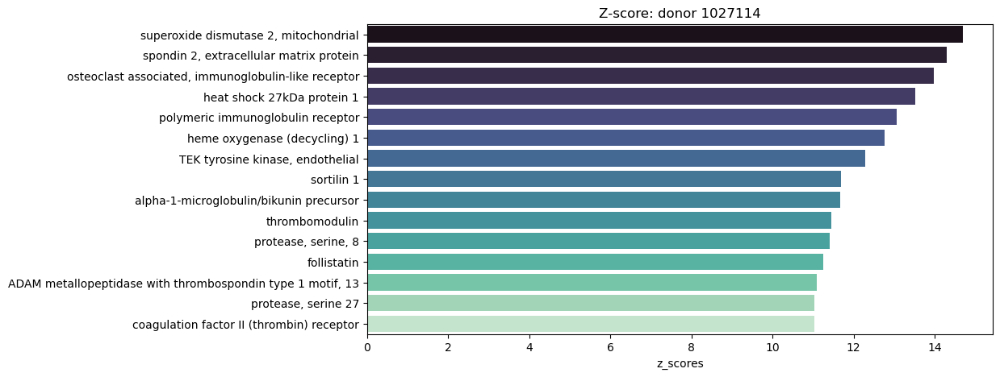

In [8]:
# View z-score: ID 1027114
z_scores_1027114_filter = z_scores_1027114.iloc[:15,:]
z_scores_1027114_filter 

plt.figure(figsize=(10, 5))
plt.title("Z-score: donor 1027114")
sns.barplot(data=z_scores_1027114_filter, y=z_scores_1027114_filter.index, x="z_scores", orient="h", palette="mako")
plt.show()


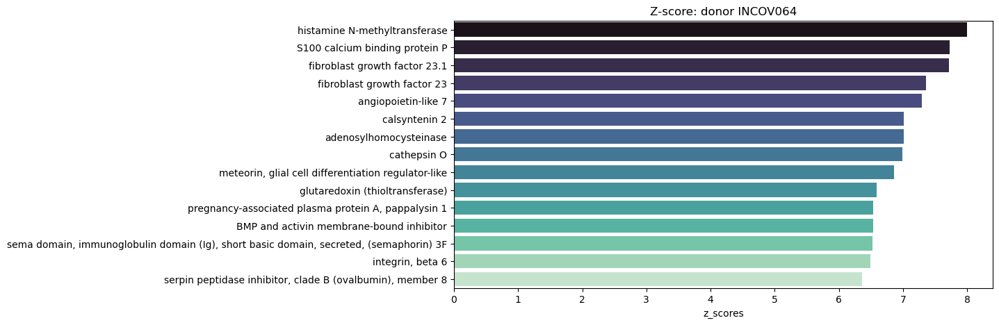

In [9]:
# View z-score: ID INCOV064
z_scores_INCOV064_filter = z_scores_INCOV064.iloc[:15,:]
z_scores_INCOV064_filter

plt.figure(figsize=(10, 5))
plt.title("Z-score: donor INCOV064")
sns.barplot(data=z_scores_INCOV064_filter, y=z_scores_INCOV064_filter.index, x="z_scores", orient="h", palette="mako")
plt.show()

In [10]:
# Reorder highest z-scores
z_scores_INCOV064 = pd.DataFrame(data= z_scores_INCOV064)
z_scores_INCOV064 = z_scores_INCOV064.rename(columns={"INCOV064":"z-scores"})
z_scores_INCOV064


,z_scores
histamine N-methyltransferase,7.997073
S100 calcium binding protein P,7.729913
fibroblast growth factor 23.1,7.715225
fibroblast growth factor 23,7.354806
angiopoietin-like 7,7.291084
...,...
clusterin-like 1 (retinal),NaN
ODA_P43629,NaN
ODA_P49763,NaN
placental growth factor.1,NaN


In [11]:
#Viewing the outliers

outlier_1 = su_data_protemoics_outliers.loc["1027114"]
outlier_2 = su_data_protemoics_outliers.loc["INCOV064"]
mean = su_data_protemoics.mean()

outliers_mean = [outlier_1, outlier_2, mean]
df = pd.DataFrame(outliers_mean)
df.index.name = 'sample_id'
df = df.rename({'Unnamed 0': 'Dataset Mean'}, axis =0)

df = df.iloc[:,:-1]
df_filter = df.iloc[:,::5]

df


/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/3859538974.py:5: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mean = su_data_protemoics.mean()


,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1027114,2.414755,1.457353,1.244160,0.712265,2.301213,0.910362,-0.073303,1.053592,0.319995,0.783655,...,5.73712,1.706265,2.174810,2.320480,0.754500,3.058775,0.745930,1.413305,-1.683045,1.542735
INCOV064,11.226425,7.437237,7.487616,13.057921,11.550940,8.481196,12.219862,11.082284,10.278102,10.218217,...,7.16203,5.542338,3.370468,5.863994,3.142410,6.204373,3.466694,3.890569,0.556906,6.010551
Dataset Mean,10.082008,3.788291,5.163664,6.241262,9.938185,7.788809,10.318033,8.419689,11.271731,8.341821,...,5.83801,2.636134,2.208922,4.292629,2.391639,7.021830,2.569849,1.534721,0.407800,2.034148


In [12]:
#Convert to long frame

outliers_long_data = pd.melt(df.iloc[:,:], ignore_index= False) #melt gets rid of your index
print(outliers_long_data.dtypes)
#Boolean mask
#What is a boolean mask? Pandas provides a feature called Boolean Masks that let's you filter DataFrames based on conditions, can filter 

filter_long_out =  outliers_long_data[outliers_long_data.variable.isin(su_data_protemoics.columns[::10])]

variable     object
value       float64
dtype: object


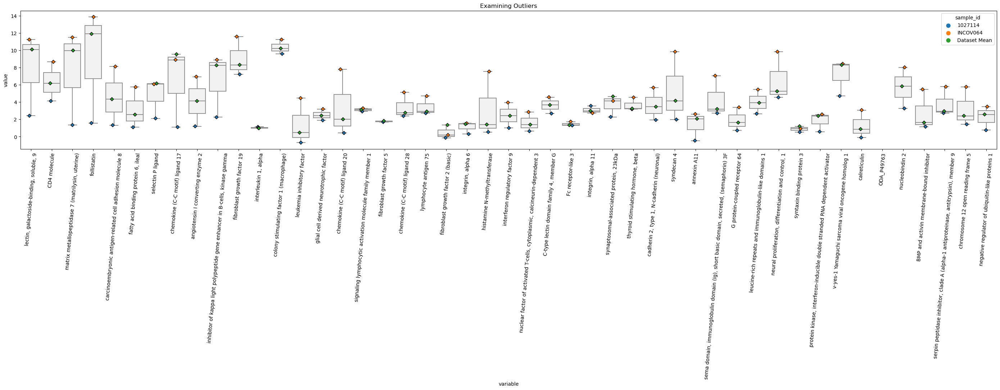

In [13]:
# View outliers

plt.figure(figsize=(35,5))
sns.boxplot(x = 'variable' , y= 'value', data=filter_long_out, color="0.95")
plt.title("Examining Outliers")
plt.xticks(rotation=85)
ax = sns.stripplot(x='variable', y='value', hue= filter_long_out.index , linewidth=1, edgecolor='black', marker='D', data=filter_long_out, zorder=3)
plt.show()

In [14]:
# scipy.stats.ttest_1samp(a, popmean, axis=0, nan_policy='propagate', alternative='two-sided')

#a = my outliers ; su_data_protemoics_outliers.loc["1027114"]
# popmean = su_data_protemoics.mean()
# axis = 1 because i want to look at columns for all the coulmns ; might be 0

# will get T statsitic - dont care 
# p valuve - the highest value will tell you what metabolite from the outlier is most different from the mean 

# Processing Data

In [15]:
# Remove metadata
no_meta = su_data_protemoics.iloc[:,:-1]
no_meta


,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,9.467005,3.150612,4.765860,5.853070,9.776093,8.076783,10.286003,7.445927,11.845645,10.276995,...,5.089420,1.904315,2.354585,3.370510,1.457120,6.393335,1.888595,1.272365,-1.015575,1.774740
1029090,9.581175,3.121713,4.649250,5.796290,9.494383,8.618412,9.356512,7.023788,10.991955,9.868815,...,5.046855,1.923825,2.362200,3.534835,1.649450,5.595935,2.099020,1.539440,-0.599360,1.543860
1049423,9.391395,3.068790,4.669920,5.773255,11.887820,7.702655,9.278815,8.153380,10.270445,5.840475,...,4.665445,1.910215,2.364895,3.594625,1.468635,5.781550,1.864265,1.657420,-0.094040,1.229660
1057525,9.142025,3.198663,5.430080,5.614800,9.746692,8.250982,9.407003,7.645927,11.169755,8.247015,...,5.510625,1.770395,2.533960,3.393515,1.293010,5.925985,1.124380,1.383710,-0.680310,1.763090
1065558,9.520395,3.261270,4.810595,5.796090,9.716400,7.394165,9.578205,8.021050,10.779190,5.698480,...,4.844270,1.815715,2.229780,2.416590,0.494190,4.416565,0.394440,1.336955,-1.091685,1.358405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,9.786717,3.699688,4.876522,6.064768,9.259790,7.528678,11.526053,7.279940,12.224605,8.855252,...,6.731739,5.465761,2.660046,6.218315,4.499703,9.236677,5.852625,1.008050,1.686931,1.697320
INCOV141,10.382318,3.511383,4.385330,5.207974,9.330641,7.803160,10.952554,8.125226,12.180945,7.589490,...,6.131039,3.616375,3.294628,5.700506,3.362275,8.424453,4.588876,1.053973,0.996480,1.344472
INCOV142,10.908705,4.361646,5.858950,6.801220,10.706707,6.956506,11.226867,9.191583,11.765794,4.034886,...,6.102758,3.627333,1.468618,4.953478,3.224846,8.259428,3.961976,0.972515,0.772288,3.442974


In [16]:
# Understanding shape and thus the dimensions of the data frame
print(su_data_protemoics.shape)
print(su_data_protemoics.shape[0]) # Rows (in this case, samples IDs)
print(su_data_protemoics.shape[1]) # Column (in this case, metabolites)

(257, 465)
257
465


In [17]:
# View metdata info - Proteomics
su_data_protemoics['Group'].value_counts()

COVID19           134
Healthy Donor     123
Name: Group, dtype: int64

In [18]:
# View Olink data
olink

,Unnamed: 0,name,panel,uniprot,gene_name,gene_description,gene_id,transcript_id,protein_id
0,0,CAM_O00533,CAM,O00533,CHL1,cell adhesion molecule L1-like,ENSG00000134121,"ENST00000256509,ENST00000397491","ENSP00000256509,ENSP00000380628"
1,1,CAM_O14786,CAM,O14786,NRP1,neuropilin 1,ENSG00000099250,"ENST00000265371,ENST00000374821,ENST0000037482...","ENSP00000265371,ENSP00000363954,ENSP0000036395..."
2,2,CAM_O15031,CAM,O15031,PLXNB2,plexin B2,ENSG00000196576,"ENST00000449103,ENST00000359337","ENSP00000409171,ENSP00000352288"
3,3,CAM_O75015,CAM,O75015,FCGR3B,"Fc fragment of IgG, low affinity IIIb, recepto...",ENSG00000162747,"ENST00000367964,ENST00000294800","ENSP00000356941,ENSP00000294800"
4,4,CAM_O75023,CAM,O75023,LILRB5,"leukocyte immunoglobulin-like receptor, subfam...","ENSG00000105609,ENSG00000263021","ENST00000316219,ENST00000345866,ENST0000044956...","ENSP00000320390,ENSP00000263430,ENSP0000040647..."
...,...,...,...,...,...,...,...,...,...
1284,1284,IMO_Q9BZW8,IMO,Q9BZW8,CD244,"CD244 molecule, natural killer cell receptor 2B4","ENSG00000122223,ENSG00000122223,ENSG0000012222...","ENST00000368034,ENST00000368033,ENST0000049206...","ENSP00000357013,ENSP00000357012,ENSP0000043263..."
1285,1285,IMO_Q9NP84,IMO,Q9NP84,TNFRSF12A,"tumor necrosis factor receptor superfamily, me...","ENSG00000006327,ENSG00000006327","ENST00000326577,ENST00000341627","ENSP00000326737,ENSP00000343894"
1286,1286,IMO_Q9NZQ7,IMO,Q9NZQ7,CD274,CD274 molecule,"ENSG00000120217,ENSG00000120217","ENST00000381577,ENST00000381573","ENSP00000370989,ENSP00000370985"
1287,1287,IMO_Q9UQV4,IMO,Q9UQV4,LAMP3,lysosomal-associated membrane protein 3,ENSG00000078081,ENST00000265598,ENSP00000265598


Count number of NA values and drop samples/proteins with >50% missing

In [19]:
# Calculate percent missing 

print(no_meta.shape)

#Calculate percent missing 
total_na = no_meta.isna().sum().sum() # This calulates the total number of NA values
#.sum().sum() - its a for loop in a one liner
#total_na = no_meta.isna().sum() # Tells you how many NA in each coulmn
# to see in whole data frame, will sum up all the columns

print("Total missing" , total_na) # total NA
print("Total number of cells" , no_meta.shape[0] * no_meta.shape[1]) # total number of values

pct_missing = total_na/ (no_meta.shape[0] * no_meta.shape[1]) * 100  # multiping the number of rows by number of columns divided by total NA to get the percent missing out of the entire data frame
print("Precent NA/missing:", pct_missing)


(257, 464)
Total missing 1849
Total number of cells 119248
Precent NA/missing: 1.5505501140480344


In [20]:
# Original
print("Original dataframe:", no_meta.shape)

# keep only samples where the number of NA values is less than 50% - Donors
no_meta = no_meta.loc[no_meta.isnull().mean(axis=1) < .5, :]
print("Number of samples NA values < 50%:", no_meta.shape) #didnt drop any rows
# 50% is a fairly good compromise

# keep only proteins where the number of NA values is less than 40% - Proteins
no_meta = no_meta.loc[:, no_meta.isnull().mean() < .4] #dropped 9 columns i.e proteins
print("Number of proteins with NA < 40%:", no_meta.shape, " -> Dropped 9 proteins! ")


Original dataframe: (257, 464)
Number of samples NA values < 50%: (257, 464)
Number of proteins with NA < 40%: (257, 454)  -> Dropped 9 proteins! 


In [21]:
no_meta

,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,9.467005,3.150612,4.765860,5.853070,9.776093,8.076783,10.286003,7.445927,11.845645,10.276995,...,5.089420,1.904315,2.354585,3.370510,1.457120,6.393335,1.888595,1.272365,-1.015575,1.774740
1029090,9.581175,3.121713,4.649250,5.796290,9.494383,8.618412,9.356512,7.023788,10.991955,9.868815,...,5.046855,1.923825,2.362200,3.534835,1.649450,5.595935,2.099020,1.539440,-0.599360,1.543860
1049423,9.391395,3.068790,4.669920,5.773255,11.887820,7.702655,9.278815,8.153380,10.270445,5.840475,...,4.665445,1.910215,2.364895,3.594625,1.468635,5.781550,1.864265,1.657420,-0.094040,1.229660
1057525,9.142025,3.198663,5.430080,5.614800,9.746692,8.250982,9.407003,7.645927,11.169755,8.247015,...,5.510625,1.770395,2.533960,3.393515,1.293010,5.925985,1.124380,1.383710,-0.680310,1.763090
1065558,9.520395,3.261270,4.810595,5.796090,9.716400,7.394165,9.578205,8.021050,10.779190,5.698480,...,4.844270,1.815715,2.229780,2.416590,0.494190,4.416565,0.394440,1.336955,-1.091685,1.358405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,9.786717,3.699688,4.876522,6.064768,9.259790,7.528678,11.526053,7.279940,12.224605,8.855252,...,6.731739,5.465761,2.660046,6.218315,4.499703,9.236677,5.852625,1.008050,1.686931,1.697320
INCOV141,10.382318,3.511383,4.385330,5.207974,9.330641,7.803160,10.952554,8.125226,12.180945,7.589490,...,6.131039,3.616375,3.294628,5.700506,3.362275,8.424453,4.588876,1.053973,0.996480,1.344472
INCOV142,10.908705,4.361646,5.858950,6.801220,10.706707,6.956506,11.226867,9.191583,11.765794,4.034886,...,6.102758,3.627333,1.468618,4.953478,3.224846,8.259428,3.961976,0.972515,0.772288,3.442974


In [22]:
unscaled_meta = pd.merge(su_data_protemoics["Group"], no_meta, right_index= True, left_index= True)
unscaled_meta

,Group,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,Healthy Donor,9.467005,3.150612,4.765860,5.853070,9.776093,8.076783,10.286003,7.445927,11.845645,...,5.089420,1.904315,2.354585,3.370510,1.457120,6.393335,1.888595,1.272365,-1.015575,1.774740
1029090,Healthy Donor,9.581175,3.121713,4.649250,5.796290,9.494383,8.618412,9.356512,7.023788,10.991955,...,5.046855,1.923825,2.362200,3.534835,1.649450,5.595935,2.099020,1.539440,-0.599360,1.543860
1049423,Healthy Donor,9.391395,3.068790,4.669920,5.773255,11.887820,7.702655,9.278815,8.153380,10.270445,...,4.665445,1.910215,2.364895,3.594625,1.468635,5.781550,1.864265,1.657420,-0.094040,1.229660
1057525,Healthy Donor,9.142025,3.198663,5.430080,5.614800,9.746692,8.250982,9.407003,7.645927,11.169755,...,5.510625,1.770395,2.533960,3.393515,1.293010,5.925985,1.124380,1.383710,-0.680310,1.763090
1065558,Healthy Donor,9.520395,3.261270,4.810595,5.796090,9.716400,7.394165,9.578205,8.021050,10.779190,...,4.844270,1.815715,2.229780,2.416590,0.494190,4.416565,0.394440,1.336955,-1.091685,1.358405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,COVID19,9.786717,3.699688,4.876522,6.064768,9.259790,7.528678,11.526053,7.279940,12.224605,...,6.731739,5.465761,2.660046,6.218315,4.499703,9.236677,5.852625,1.008050,1.686931,1.697320
INCOV141,COVID19,10.382318,3.511383,4.385330,5.207974,9.330641,7.803160,10.952554,8.125226,12.180945,...,6.131039,3.616375,3.294628,5.700506,3.362275,8.424453,4.588876,1.053973,0.996480,1.344472
INCOV142,COVID19,10.908705,4.361646,5.858950,6.801220,10.706707,6.956506,11.226867,9.191583,11.765794,...,6.102758,3.627333,1.468618,4.953478,3.224846,8.259428,3.961976,0.972515,0.772288,3.442974


Impute Missing Values

In [23]:
import sys
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest

In [24]:
# Originally did imputing based on median, but random forest is better

# # Impute missing values using the median
# imputed_dat = no_meta.fillna(value=no_meta.median(axis=0))
# imputed_dat


In [25]:
# Random Forest for imputing missing data
randomFores = MissForest()
imputed_data = pd.DataFrame(randomFores.fit_transform(no_meta))


/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='s

Iteration: 0


/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='s

Iteration: 1


/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='s

Iteration: 2


/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='s

Iteration: 3


In [26]:
imputed_data
print(type(imputed_data))
print(type(no_meta))
print(len(imputed_data))
print(len(no_meta))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
257
257


In [27]:
imputed_data.columns = no_meta.columns

In [28]:

import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest


In [29]:
randomFores = MissForest()

In [30]:
list_column_names = no_meta.columns.to_list()
list_index_names = no_meta.index.to_list()

In [31]:
#imputed_data = pd.DataFrame(imputed_data, columns= no_meta.columns, index= no_meta.index)
imputed_data.columns = list_column_names
imputed_data.index = list_index_names
imputed_data

,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
1010823,9.467005,3.150612,4.765860,5.853070,9.776093,8.076783,10.286003,7.445927,11.845645,10.276995,...,5.089420,1.904315,2.354585,3.370510,1.457120,6.393335,1.888595,1.272365,-1.015575,1.774740
1029090,9.581175,3.121713,4.649250,5.796290,9.494383,8.618412,9.356512,7.023788,10.991955,9.868815,...,5.046855,1.923825,2.362200,3.534835,1.649450,5.595935,2.099020,1.539440,-0.599360,1.543860
1049423,9.391395,3.068790,4.669920,5.773255,11.887820,7.702655,9.278815,8.153380,10.270445,5.840475,...,4.665445,1.910215,2.364895,3.594625,1.468635,5.781550,1.864265,1.657420,-0.094040,1.229660
1057525,9.142025,3.198663,5.430080,5.614800,9.746692,8.250982,9.407003,7.645927,11.169755,8.247015,...,5.510625,1.770395,2.533960,3.393515,1.293010,5.925985,1.124380,1.383710,-0.680310,1.763090
1065558,9.520395,3.261270,4.810595,5.796090,9.716400,7.394165,9.578205,8.021050,10.779190,5.698480,...,4.844270,1.815715,2.229780,2.416590,0.494190,4.416565,0.394440,1.336955,-1.091685,1.358405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,9.786717,3.699688,4.876522,6.064768,9.259790,7.528678,11.526053,7.279940,12.224605,8.855252,...,6.731739,5.465761,2.660046,6.218315,4.499703,9.236677,5.852625,1.008050,1.686931,1.697320
INCOV141,10.382318,3.511383,4.385330,5.207974,9.330641,7.803160,10.952554,8.125226,12.180945,7.589490,...,6.131039,3.616375,3.294628,5.700506,3.362275,8.424453,4.588876,1.053973,0.996480,1.344472
INCOV142,10.908705,4.361646,5.858950,6.801220,10.706707,6.956506,11.226867,9.191583,11.765794,4.034886,...,6.102758,3.627333,1.468618,4.953478,3.224846,8.259428,3.961976,0.972515,0.772288,3.442974
INCOV144,9.624015,3.330472,4.729950,4.996068,9.785855,7.849917,10.436921,7.818691,11.536490,7.558431,...,5.427625,2.387093,1.869467,5.393703,3.315091,8.689472,3.920355,1.406586,0.873741,1.418509


In [32]:

imputed_dat_meta =pd.merge(imputed_data, su_data_protemoics["Group"],right_index= True, left_index= True)
imputed_dat_meta


,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56,Group
1010823,9.467005,3.150612,4.765860,5.853070,9.776093,8.076783,10.286003,7.445927,11.845645,10.276995,...,1.904315,2.354585,3.370510,1.457120,6.393335,1.888595,1.272365,-1.015575,1.774740,Healthy Donor
1029090,9.581175,3.121713,4.649250,5.796290,9.494383,8.618412,9.356512,7.023788,10.991955,9.868815,...,1.923825,2.362200,3.534835,1.649450,5.595935,2.099020,1.539440,-0.599360,1.543860,Healthy Donor
1049423,9.391395,3.068790,4.669920,5.773255,11.887820,7.702655,9.278815,8.153380,10.270445,5.840475,...,1.910215,2.364895,3.594625,1.468635,5.781550,1.864265,1.657420,-0.094040,1.229660,Healthy Donor
1057525,9.142025,3.198663,5.430080,5.614800,9.746692,8.250982,9.407003,7.645927,11.169755,8.247015,...,1.770395,2.533960,3.393515,1.293010,5.925985,1.124380,1.383710,-0.680310,1.763090,Healthy Donor
1065558,9.520395,3.261270,4.810595,5.796090,9.716400,7.394165,9.578205,8.021050,10.779190,5.698480,...,1.815715,2.229780,2.416590,0.494190,4.416565,0.394440,1.336955,-1.091685,1.358405,Healthy Donor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,9.786717,3.699688,4.876522,6.064768,9.259790,7.528678,11.526053,7.279940,12.224605,8.855252,...,5.465761,2.660046,6.218315,4.499703,9.236677,5.852625,1.008050,1.686931,1.697320,COVID19
INCOV141,10.382318,3.511383,4.385330,5.207974,9.330641,7.803160,10.952554,8.125226,12.180945,7.589490,...,3.616375,3.294628,5.700506,3.362275,8.424453,4.588876,1.053973,0.996480,1.344472,COVID19
INCOV142,10.908705,4.361646,5.858950,6.801220,10.706707,6.956506,11.226867,9.191583,11.765794,4.034886,...,3.627333,1.468618,4.953478,3.224846,8.259428,3.961976,0.972515,0.772288,3.442974,COVID19
INCOV144,9.624015,3.330472,4.729950,4.996068,9.785855,7.849917,10.436921,7.818691,11.536490,7.558431,...,2.387093,1.869467,5.393703,3.315091,8.689472,3.920355,1.406586,0.873741,1.418509,COVID19


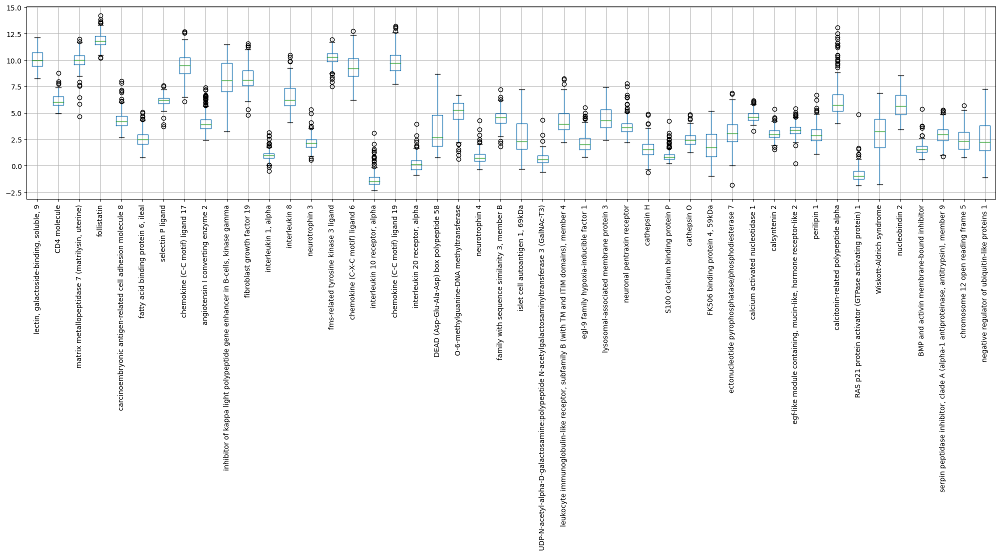

In [33]:
#View protemomic data before standardizing

# [start : end : stepsize]

#Boxplot needs the input to be an array in matplotlib.pyplot
#Filter the data so only looking at a subset of metabolites
filtered = imputed_data.iloc[:, ::10]
filtered

plt.figure(figsize=(25,5))
filtered.boxplot(rot = 90)
plt.show()

Standardize data (mean =0, SD = 1)

In [34]:
# Standardize features using the standard scalar (mean of 0, std of 1)
prot_standard = sklearn.preprocessing.StandardScaler().fit_transform(imputed_data)
#sklearn has objects, and the the functions fit (fit scaler, gives scaling value), transform (will transform into scale values), or fit_transform (does both at once) 

# Put into a data frame
prot_standard = pd.DataFrame(data = prot_standard)
prot_standard


,0,1,2,3,4,5,6,7,8,9,...,444,445,446,447,448,449,450,451,452,453
0,-0.774169,-0.715042,-0.475117,-0.376539,-0.242449,0.465974,-0.035831,-1.096496,0.642583,0.948402,...,-0.989566,-0.846847,0.211866,-0.662963,-0.763679,-0.329100,-0.448917,-0.533633,-1.385562,-0.256394
1,-0.630451,-0.747448,-0.614390,-0.431615,-0.663813,1.342395,-1.075601,-1.571843,-0.313252,0.748359,...,-1.045833,-0.824271,0.222942,-0.544820,-0.606509,-0.746644,-0.310256,0.009598,-0.980404,-0.484592
2,-0.869347,-0.806791,-0.589703,-0.453958,2.916144,-0.139408,-1.162517,-0.299875,-1.121091,-1.225875,...,-1.550021,-0.840020,0.226861,-0.501834,-0.754269,-0.649450,-0.464950,0.249570,-0.488508,-0.795142
3,-1.183256,-0.661162,0.318194,-0.607657,-0.286423,0.747850,-1.019120,-0.871288,-0.114178,-0.046463,...,-0.432772,-1.001817,0.472765,-0.646423,-0.897788,-0.573819,-0.952502,-0.307157,-1.059203,-0.267909
4,-0.706962,-0.590959,-0.421688,-0.431809,-0.331733,-0.638581,-0.827605,-0.448884,-0.551474,-1.295465,...,-1.313631,-0.949374,0.030338,-1.348789,-1.550576,-1.364199,-1.433501,-0.402257,-1.459650,-0.667893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252,-0.371715,-0.099352,-0.342947,-0.171196,-1.014702,-0.420922,1.351346,-1.283404,1.066886,0.251626,...,1.181426,3.274395,0.656156,1.384484,1.722687,1.159764,2.163207,-1.071250,1.245149,-0.332915
253,0.378032,-0.310503,-0.929602,-1.002270,-0.908728,0.023220,0.709804,-0.331578,1.018002,-0.368707,...,0.387357,1.134318,1.579150,1.012202,0.793193,0.734457,1.330451,-0.977843,0.573041,-0.681664
254,1.040650,0.642916,0.830414,0.543150,1.149508,-1.346764,1.016663,0.869184,0.553178,-2.110770,...,0.349971,1.146998,-1.076766,0.475122,0.680888,0.648045,0.917351,-1.143528,0.354805,1.392459
255,-0.576524,-0.513362,-0.518006,-1.207816,-0.227846,0.098879,0.132993,-0.676748,0.296437,-0.383928,...,-0.542490,-0.288185,-0.493735,0.791624,0.754635,0.873230,0.889925,-0.260626,0.453562,-0.608487


In [35]:
# Put standardized data into a data frame
standard = pd.DataFrame(data=prot_standard.values, columns=no_meta.columns)
standard.index=su_data_protemoics.index
standard


,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,growth hormone 1,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,-0.774169,-0.715042,-0.475117,-0.376539,-0.242449,0.465974,-0.035831,-1.096496,0.642583,0.948402,...,-0.989566,-0.846847,0.211866,-0.662963,-0.763679,-0.329100,-0.448917,-0.533633,-1.385562,-0.256394
1029090,-0.630451,-0.747448,-0.614390,-0.431615,-0.663813,1.342395,-1.075601,-1.571843,-0.313252,0.748359,...,-1.045833,-0.824271,0.222942,-0.544820,-0.606509,-0.746644,-0.310256,0.009598,-0.980404,-0.484592
1049423,-0.869347,-0.806791,-0.589703,-0.453958,2.916144,-0.139408,-1.162517,-0.299875,-1.121091,-1.225875,...,-1.550021,-0.840020,0.226861,-0.501834,-0.754269,-0.649450,-0.464950,0.249570,-0.488508,-0.795142
1057525,-1.183256,-0.661162,0.318194,-0.607657,-0.286423,0.747850,-1.019120,-0.871288,-0.114178,-0.046463,...,-0.432772,-1.001817,0.472765,-0.646423,-0.897788,-0.573819,-0.952502,-0.307157,-1.059203,-0.267909
1065558,-0.706962,-0.590959,-0.421688,-0.431809,-0.331733,-0.638581,-0.827605,-0.448884,-0.551474,-1.295465,...,-1.313631,-0.949374,0.030338,-1.348789,-1.550576,-1.364199,-1.433501,-0.402257,-1.459650,-0.667893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,-0.371715,-0.099352,-0.342947,-0.171196,-1.014702,-0.420922,1.351346,-1.283404,1.066886,0.251626,...,1.181426,3.274395,0.656156,1.384484,1.722687,1.159764,2.163207,-1.071250,1.245149,-0.332915
INCOV141,0.378032,-0.310503,-0.929602,-1.002270,-0.908728,0.023220,0.709804,-0.331578,1.018002,-0.368707,...,0.387357,1.134318,1.579150,1.012202,0.793193,0.734457,1.330451,-0.977843,0.573041,-0.681664
INCOV142,1.040650,0.642916,0.830414,0.543150,1.149508,-1.346764,1.016663,0.869184,0.553178,-2.110770,...,0.349971,1.146998,-1.076766,0.475122,0.680888,0.648045,0.917351,-1.143528,0.354805,1.392459


Adding Back Metadata and WHO status

In [36]:
# Add meta data back
standard_proteomic_meta_1 = pd.merge(su_data_protemoics['Group'],standard,right_index= True, left_index= True)
standard_proteomic_meta_1

,Group,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,platelet-derived growth factor beta polypeptide,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,Healthy Donor,-0.774169,-0.715042,-0.475117,-0.376539,-0.242449,0.465974,-0.035831,-1.096496,0.642583,...,-0.989566,-0.846847,0.211866,-0.662963,-0.763679,-0.329100,-0.448917,-0.533633,-1.385562,-0.256394
1029090,Healthy Donor,-0.630451,-0.747448,-0.614390,-0.431615,-0.663813,1.342395,-1.075601,-1.571843,-0.313252,...,-1.045833,-0.824271,0.222942,-0.544820,-0.606509,-0.746644,-0.310256,0.009598,-0.980404,-0.484592
1049423,Healthy Donor,-0.869347,-0.806791,-0.589703,-0.453958,2.916144,-0.139408,-1.162517,-0.299875,-1.121091,...,-1.550021,-0.840020,0.226861,-0.501834,-0.754269,-0.649450,-0.464950,0.249570,-0.488508,-0.795142
1057525,Healthy Donor,-1.183256,-0.661162,0.318194,-0.607657,-0.286423,0.747850,-1.019120,-0.871288,-0.114178,...,-0.432772,-1.001817,0.472765,-0.646423,-0.897788,-0.573819,-0.952502,-0.307157,-1.059203,-0.267909
1065558,Healthy Donor,-0.706962,-0.590959,-0.421688,-0.431809,-0.331733,-0.638581,-0.827605,-0.448884,-0.551474,...,-1.313631,-0.949374,0.030338,-1.348789,-1.550576,-1.364199,-1.433501,-0.402257,-1.459650,-0.667893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,COVID19,-0.371715,-0.099352,-0.342947,-0.171196,-1.014702,-0.420922,1.351346,-1.283404,1.066886,...,1.181426,3.274395,0.656156,1.384484,1.722687,1.159764,2.163207,-1.071250,1.245149,-0.332915
INCOV141,COVID19,0.378032,-0.310503,-0.929602,-1.002270,-0.908728,0.023220,0.709804,-0.331578,1.018002,...,0.387357,1.134318,1.579150,1.012202,0.793193,0.734457,1.330451,-0.977843,0.573041,-0.681664
INCOV142,COVID19,1.040650,0.642916,0.830414,0.543150,1.149508,-1.346764,1.016663,0.869184,0.553178,...,0.349971,1.146998,-1.076766,0.475122,0.680888,0.648045,0.917351,-1.143528,0.354805,1.392459


In [37]:
# Adding WHO status 
standard_proteomic_meta = pd.merge(WHO_status['WHO_status'],standard_proteomic_meta_1,right_index= True, left_index= True)
standard_proteomic_meta


,WHO_status,Group,"lectin, galactoside-binding, soluble, 9","tumor necrosis factor receptor superfamily, member 10a",agouti related protein homolog (mouse),"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, member 13B",c-fos induced growth factor (vascular endothelial growth factor D),dickkopf WNT signaling pathway inhibitor 1,renin,...,"EGF-like-domain, multiple 7",REST corepressor 1,carbonic anhydrase XIV,syntaxin 8,"protein kinase, AMP-activated, beta 1 non-catalytic subunit",mitogen-activated protein kinase kinase kinase kinase 5,negative regulator of ubiquitin-like proteins 1,ectonucleoside triphosphate diphosphohydrolase 2,"melanoma antigen family D, 1",G protein-coupled receptor 56
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,0,Healthy Donor,-0.774169,-0.715042,-0.475117,-0.376539,-0.242449,0.465974,-0.035831,-1.096496,...,-0.989566,-0.846847,0.211866,-0.662963,-0.763679,-0.329100,-0.448917,-0.533633,-1.385562,-0.256394
1029090,0,Healthy Donor,-0.630451,-0.747448,-0.614390,-0.431615,-0.663813,1.342395,-1.075601,-1.571843,...,-1.045833,-0.824271,0.222942,-0.544820,-0.606509,-0.746644,-0.310256,0.009598,-0.980404,-0.484592
1049423,0,Healthy Donor,-0.869347,-0.806791,-0.589703,-0.453958,2.916144,-0.139408,-1.162517,-0.299875,...,-1.550021,-0.840020,0.226861,-0.501834,-0.754269,-0.649450,-0.464950,0.249570,-0.488508,-0.795142
1057525,0,Healthy Donor,-1.183256,-0.661162,0.318194,-0.607657,-0.286423,0.747850,-1.019120,-0.871288,...,-0.432772,-1.001817,0.472765,-0.646423,-0.897788,-0.573819,-0.952502,-0.307157,-1.059203,-0.267909
1065558,0,Healthy Donor,-0.706962,-0.590959,-0.421688,-0.431809,-0.331733,-0.638581,-0.827605,-0.448884,...,-1.313631,-0.949374,0.030338,-1.348789,-1.550576,-1.364199,-1.433501,-0.402257,-1.459650,-0.667893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,3-4,COVID19,-0.371715,-0.099352,-0.342947,-0.171196,-1.014702,-0.420922,1.351346,-1.283404,...,1.181426,3.274395,0.656156,1.384484,1.722687,1.159764,2.163207,-1.071250,1.245149,-0.332915
INCOV141,1-2,COVID19,0.378032,-0.310503,-0.929602,-1.002270,-0.908728,0.023220,0.709804,-0.331578,...,0.387357,1.134318,1.579150,1.012202,0.793193,0.734457,1.330451,-0.977843,0.573041,-0.681664
INCOV142,5-7,COVID19,1.040650,0.642916,0.830414,0.543150,1.149508,-1.346764,1.016663,0.869184,...,0.349971,1.146998,-1.076766,0.475122,0.680888,0.648045,0.917351,-1.143528,0.354805,1.392459


In [38]:
filter = standard_proteomic_meta_1.loc[:,::60]
filter

,Group,interleukin 18 (interferon-gamma-inducing factor),colony stimulating factor 1 (macrophage),interleukin 17C,dynactin 1,adenosylhomocysteinase,dipeptidyl-peptidase 7,"protein tyrosine phosphatase, receptor type, J"
sample_id,,,,,,,,
1010823,Healthy Donor,-0.712347,-0.452924,-0.324366,0.511804,0.535355,0.117918,-0.829839
1029090,Healthy Donor,-0.789103,-0.710501,-0.489796,-0.240771,-0.741263,-0.106730,-0.154138
1049423,Healthy Donor,-0.259162,-0.282707,-0.605075,-0.564746,0.100340,-0.445588,-1.218404
1057525,Healthy Donor,-0.399493,-0.616401,-0.865364,0.183768,-0.689367,-0.415449,-0.455965
1065558,Healthy Donor,-0.531475,-0.517729,-0.687765,-1.442041,-1.625110,-0.972224,-1.223354
...,...,...,...,...,...,...,...,...
INCOV139,COVID19,0.351024,-0.563903,0.630040,1.502095,0.395262,1.880074,1.459717
INCOV141,COVID19,1.111224,0.661790,-0.481218,0.920893,-0.080146,0.196902,1.089416
INCOV142,COVID19,1.644319,0.948711,0.556818,0.492603,0.585139,-0.121708,0.344574


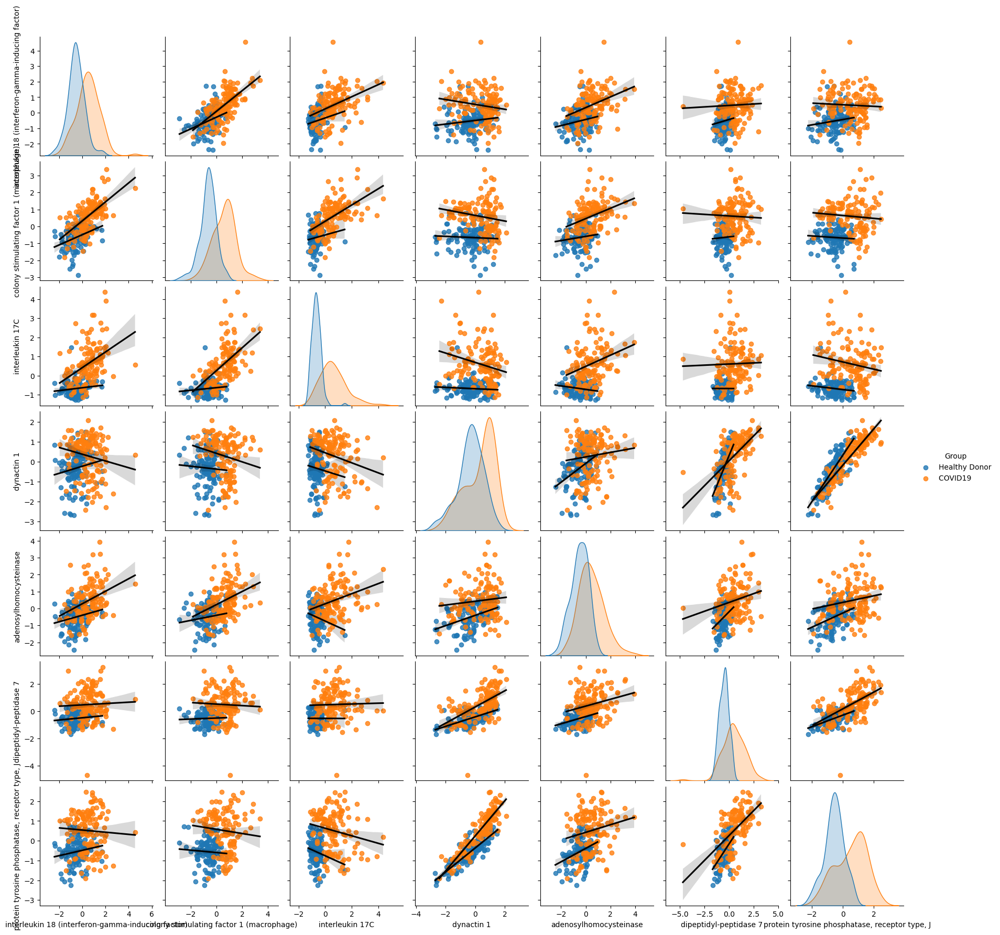

In [39]:
sns.pairplot(data=filter, hue="Group", kind="reg", plot_kws={'line_kws':{'color':'black'}}) ## line_kws are additional keywords added to a scatterplot

# Examining Data

/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/1032464470.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sns.histplot(data=standard_proteomic_meta.mean(), bins=20)


Text(0, 0.5, 'Frequency')

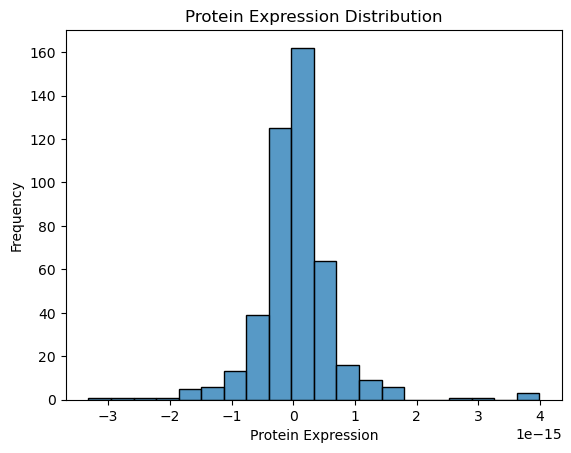

In [40]:
# Distribution of protein expression

sns.histplot(data=standard_proteomic_meta.mean(), bins=20)
plt.title("Protein Expression Distribution")
plt.xlabel("Protein Expression")
plt.ylabel("Frequency")

/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/1193844375.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sns.kdeplot(x=standard_proteomic_meta.mean())


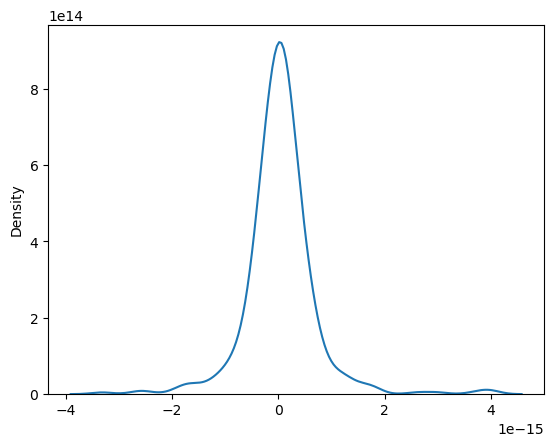

In [41]:
#Check for normal distribution
#Kernal Density

sns.kdeplot(x=standard_proteomic_meta.mean())
plt.show()

/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/894943633.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sns.histplot(x= standard_proteomic_meta.mean(), color = 'lightskyblue')


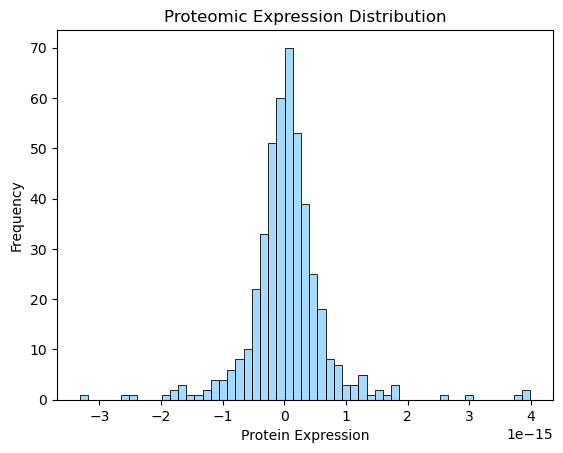

In [42]:
#Check for normal distribution
#Seaborn 

sns.histplot(x= standard_proteomic_meta.mean(), color = 'lightskyblue')
plt.title("Proteomic Expression Distribution")
plt.xlabel("Protein Expression")
plt.ylabel("Frequency")
plt.show()#Check for normal distribution


/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/3307622659.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  plt.hist(standard_proteomic_meta.mean(axis=1), bins=10) # Log transformed and mean of 0 and standard deviation of 1; should show 0 being near the center; the mean should be at 0; univariant scaled


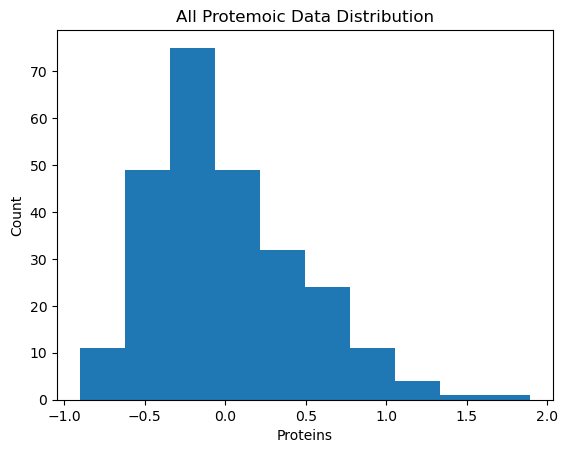

In [43]:
# Check for normal distribution
# This data is unscaled

plt.title("All Protemoic Data Distribution")
plt.xlabel("Proteins")
plt.ylabel("Count")

plt.hist(standard_proteomic_meta.mean(axis=1), bins=10) # Log transformed and mean of 0 and standard deviation of 1; should show 0 being near the center; the mean should be at 0; univariant scaled
plt.show()

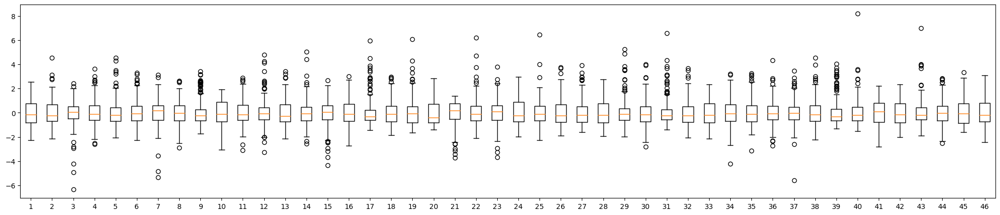

In [44]:
#Boxplot of metabolites
# [start : end : stepsize]

#Boxplot needs the input to be an array in matplotlib.pyplot
#Filter the data so only looking at a subset of metabolites
filt = standard_proteomic_meta.iloc[:, 2::10]
filt

plt.figure(figsize=(25,5))
plt.boxplot(filt)
#plt.savefig('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Plots_COVID/boxplot.png', dpi= 300, bbox_inches='tight')
plt.show()

##No idea why I can't plot the first 100, but it looks like I can see their values



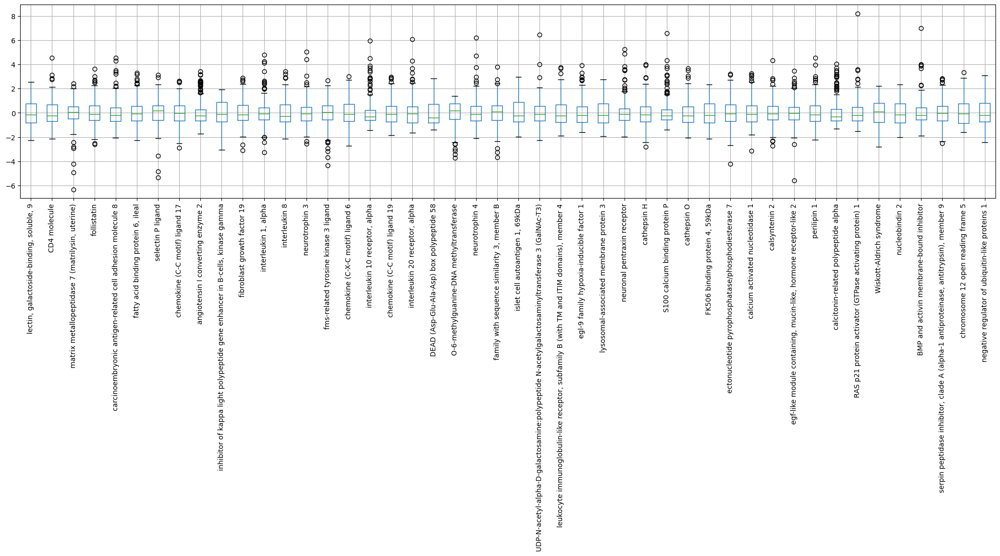

In [45]:
# Pandas you can also make boxplots and it will infer the labels on your data
#Seaborn, pandas, numpy are all built on matplotlib so can use matplot lib for them

#this is a pandas data fame
plt.figure(figsize=(25,5))
filt.boxplot(rot=90)
#plt.savefig('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Plots_COVID/boxplot_sns_labels.png', dpi= 300, bbox_inches='tight')
plt.show()

/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 2500x400 with 0 Axes>

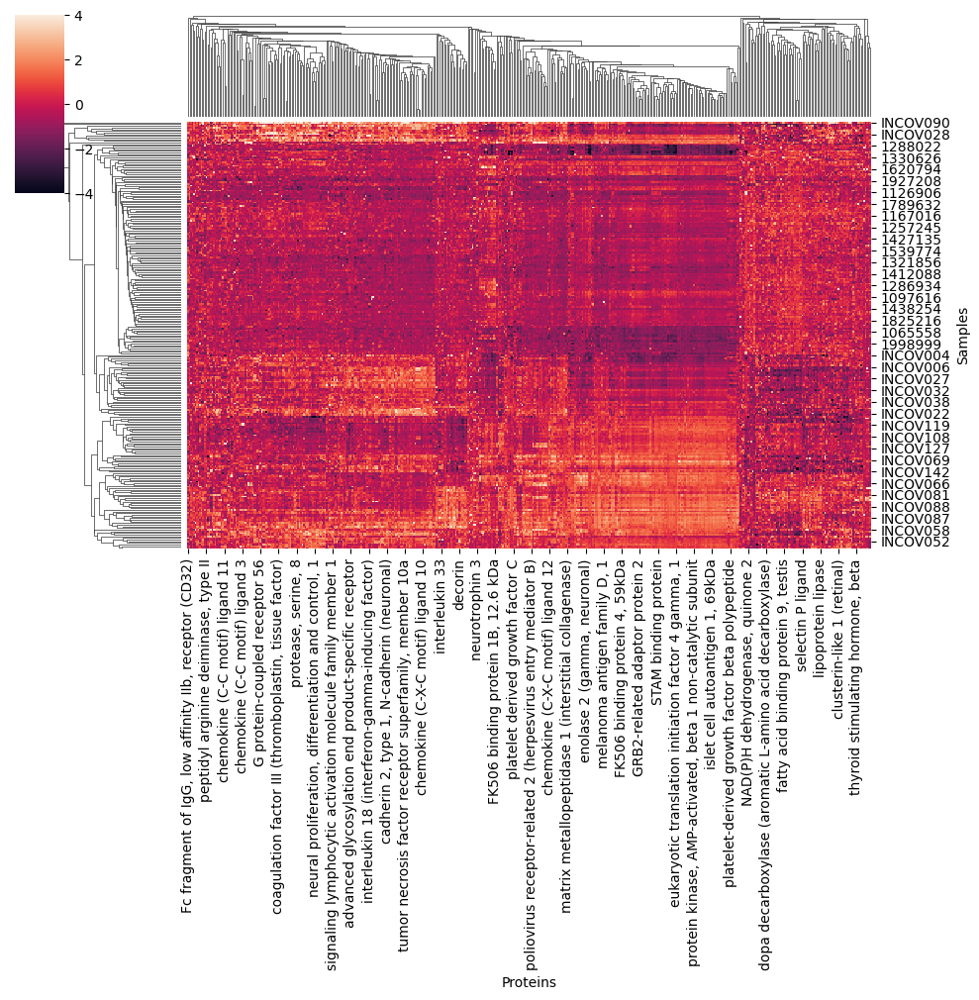

In [46]:
# Making a heatmap - Group
plt.figure(figsize=(25,4))
g = sns.clustermap(standard_proteomic_meta.iloc[:,2:], vmax = 4, vmin = -4, cmap="rocket",)

g.ax_heatmap.set_xlabel("Proteins")
g.ax_heatmap.set_ylabel("Samples")
plt.show()



In [47]:
heatmap_index = g.dendrogram_col.reordered_ind[:]


In [48]:
# Group by disease vs non disease

Disease_grouped  = standard_proteomic_meta.groupby(by="Group").mean()
WHO_status_grouped = standard_proteomic_meta.groupby(by="WHO_status").mean()


Making heatmap and clustered heatmap

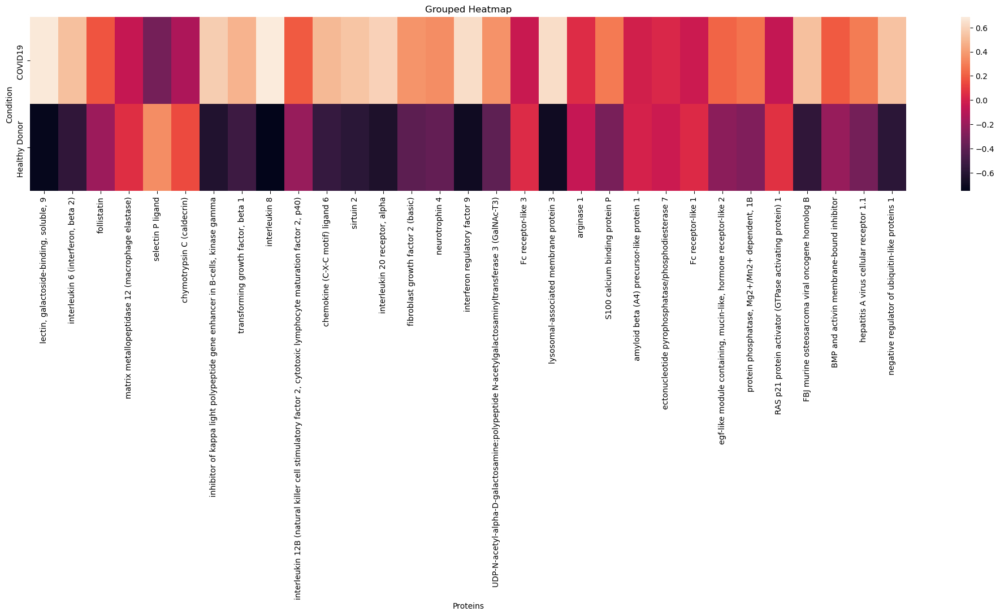

In [49]:
# Making a heatmap - Group
plt.figure(figsize=(25,4))

sns.heatmap(Disease_grouped.iloc[:,::15], cmap="rocket",)
plt.title("Grouped Heatmap")
plt.xlabel("Proteins")
plt.ylabel("Condition")
plt.xticks(rotation=90)
plt.show()


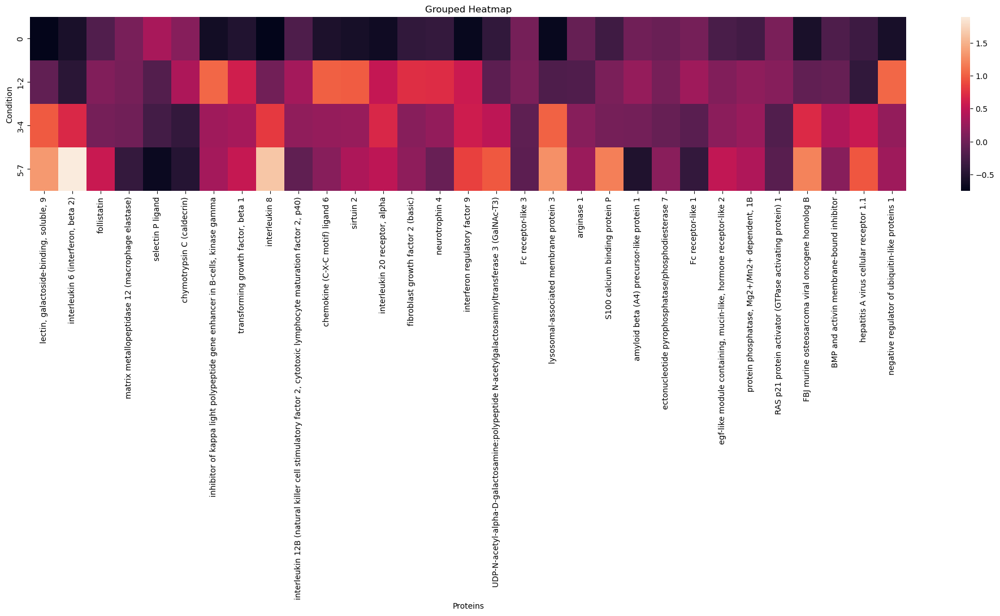

In [50]:
# Making a heatmap - Group
plt.figure(figsize=(25,4))

sns.heatmap(WHO_status_grouped.iloc[:,::15], cmap="rocket",)
plt.title("Grouped Heatmap")
plt.xlabel("Proteins")
plt.ylabel("Condition")
plt.xticks(rotation=90)
plt.show()

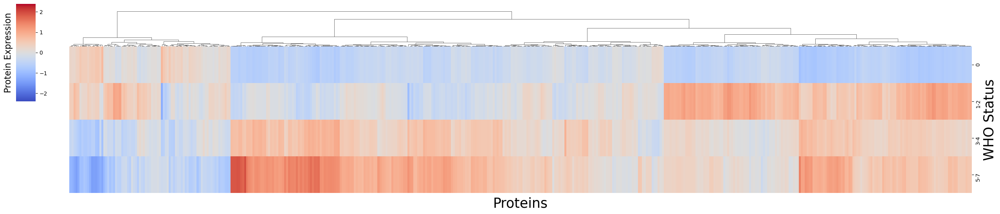

In [51]:
# Cluster heatmap
g_who = sns.clustermap(WHO_status_grouped, cmap="coolwarm", method = 'ward', xticklabels = False, figsize=(25, 5), row_cluster=False,
    dendrogram_ratio=(0.05, .2), cbar_pos=(0, .5, .02, .5), vmin=-2.4, vmax=2.4)

g_who.ax_heatmap.set_xlabel("Proteins", fontsize=25)
g_who.ax_heatmap.set_ylabel("WHO Status", fontsize=25)
g_who.ax_cbar.set_ylabel("Protein Expression",size=16, labelpad=-80)

plt.show()

In [52]:
# Indexing 
heatmap_index_who = g_who.dendrogram_col.reordered_ind[:]

# Making index
dict_protein_heatmap = dict(zip(range(0,454), no_meta))

# Get the order of pathways
protein_order = [dict_protein_heatmap[i] for i in heatmap_index_who]

# List of proteins in order
protein_order_df = pd.DataFrame(protein_order, columns= ["Protein"])

protein_order_df.to_excel("who_status_clustermap_order_protein.xlsx")
protein_order_df

,Protein
0,delta/notch-like EGF repeat containing
1,plexin domain containing 1
2,"C-type lectin domain family 4, member C"
3,"tumor necrosis factor (ligand) superfamily, me..."
4,desmoglein 4
...,...
449,SRSF protein kinase 2
450,catechol-O-methyltransferase
451,APEX nuclease (multifunctional DNA repair enzy...
452,phosphoprotein associated with glycosphingolip...


Text(314.93686868686865, 0.5, 'Condition')

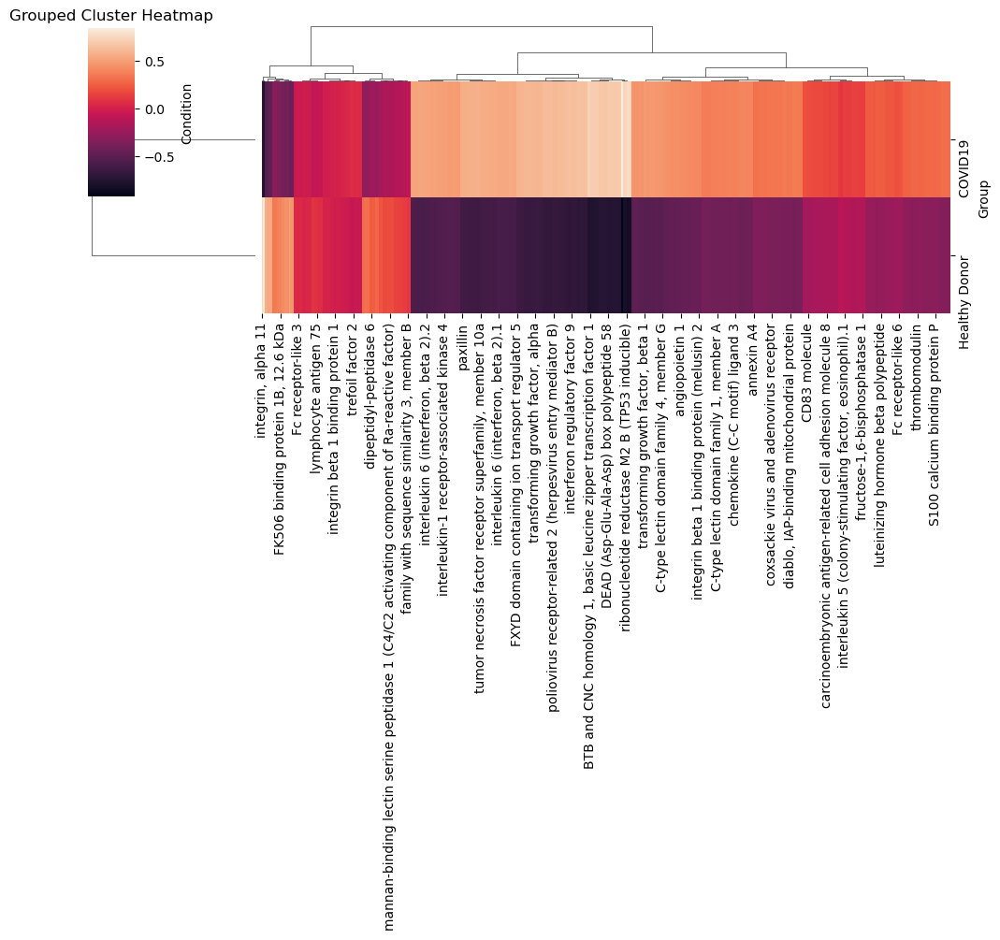

In [53]:
# Cluster heatmap

sns.clustermap(Disease_grouped.iloc[:,:], cmap="rocket", method = 'ward')

plt.title("Grouped Cluster Heatmap")
plt.xlabel("Proteins")
plt.ylabel("Condition")

Making Violin plots

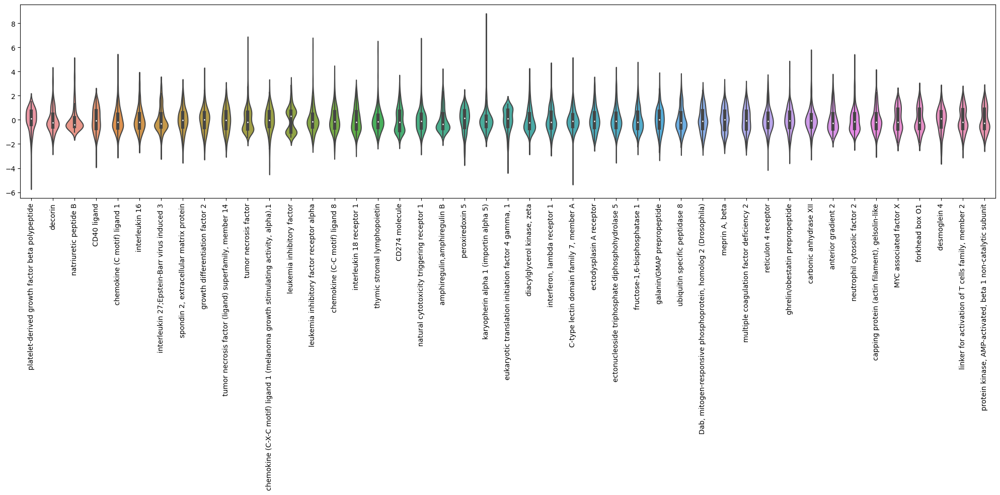

In [54]:
# Making violin plots
plt.figure(figsize=(25,5))
plt.xticks(rotation=90) # Need to put this ahead of plotting the data for violin plots
sns.violinplot(data=standard_proteomic_meta.iloc[:,::10])
plt.show()

In [55]:
# Converting wide into long so that I can look at multiple proteins at a time

long_data = pd.melt(standard_proteomic_meta.iloc[:,2:], ignore_index= False) #melt gets rid of your index
long_data
# first coulmn is .index
# first row is .column


,variable,value
sample_id,,
1010823,"lectin, galactoside-binding, soluble, 9",-0.774169
1029090,"lectin, galactoside-binding, soluble, 9",-0.630451
1049423,"lectin, galactoside-binding, soluble, 9",-0.869347
1057525,"lectin, galactoside-binding, soluble, 9",-1.183256
1065558,"lectin, galactoside-binding, soluble, 9",-0.706962
...,...,...
INCOV139,G protein-coupled receptor 56,-0.332915
INCOV141,G protein-coupled receptor 56,-0.681664
INCOV142,G protein-coupled receptor 56,1.392459


In [56]:
#Make lists to combine into a new dictionary
list_ID = standard_proteomic_meta.index
list_Group = standard_proteomic_meta["Group"] 

# Make a dictionary with two lists 
dict_group = dict(zip(list_ID, list_Group)) # zip is a way of pulling two lists together (need to be same length) and put it into a tupple (pair of things)
dict_group

{'1010823': 'Healthy Donor ',
 '1029090': 'Healthy Donor ',
 '1049423': 'Healthy Donor ',
 '1057525': 'Healthy Donor ',
 '1065558': 'Healthy Donor ',
 '1066842': 'Healthy Donor ',
 '1075315': 'Healthy Donor ',
 '1097616': 'Healthy Donor ',
 '1100090': 'Healthy Donor ',
 '1100093': 'Healthy Donor ',
 '1104524': 'Healthy Donor ',
 '1108839': 'Healthy Donor ',
 '1114138': 'Healthy Donor ',
 '1126906': 'Healthy Donor ',
 '1129657': 'Healthy Donor ',
 '1130217': 'Healthy Donor ',
 '1134467': 'Healthy Donor ',
 '1157578': 'Healthy Donor ',
 '1165338': 'Healthy Donor ',
 '1167016': 'Healthy Donor ',
 '1169545': 'Healthy Donor ',
 '1173930': 'Healthy Donor ',
 '1179920': 'Healthy Donor ',
 '1184674': 'Healthy Donor ',
 '1200802': 'Healthy Donor ',
 '1221615': 'Healthy Donor ',
 '1230333': 'Healthy Donor ',
 '1241681': 'Healthy Donor ',
 '1257245': 'Healthy Donor ',
 '1262983': 'Healthy Donor ',
 '1268568': 'Healthy Donor ',
 '1286934': 'Healthy Donor ',
 '1288022': 'Healthy Donor ',
 '1304992'

In [57]:
# Puts in a new column based on a a mapper and use d a dictionary that will map the group column to the index which is the sample IDs
# Mapper is replaced with dictionary sample ID and group 
long_data['Group'] = long_data.index.map(dict_group) 

# Look at type of data the columns are
print(long_data.dtypes)

# Look at data after its been converted to long form
long_data


variable     object
value       float64
Group        object
dtype: object


,variable,value,Group
sample_id,,,
1010823,"lectin, galactoside-binding, soluble, 9",-0.774169,Healthy Donor
1029090,"lectin, galactoside-binding, soluble, 9",-0.630451,Healthy Donor
1049423,"lectin, galactoside-binding, soluble, 9",-0.869347,Healthy Donor
1057525,"lectin, galactoside-binding, soluble, 9",-1.183256,Healthy Donor
1065558,"lectin, galactoside-binding, soluble, 9",-0.706962,Healthy Donor
...,...,...,...
INCOV139,G protein-coupled receptor 56,-0.332915,COVID19
INCOV141,G protein-coupled receptor 56,-0.681664,COVID19
INCOV142,G protein-coupled receptor 56,1.392459,COVID19


In [58]:
# Group Violin plot

#Boolean mask
#What is a boolean mask? Pandas provides a feature called Boolean Masks that let's you filter DataFrames based on conditions, can filter 

filter_long =  long_data[long_data.variable.isin(standard_proteomic_meta.columns[0::20])]
filter_long


,variable,value,Group
sample_id,,,
1010823,decorin,-0.214295,Healthy Donor
1029090,decorin,0.436568,Healthy Donor
1049423,decorin,0.676046,Healthy Donor
1057525,decorin,-0.259324,Healthy Donor
1065558,decorin,-0.337078,Healthy Donor
...,...,...,...
INCOV139,"linker for activation of T cells family, member 2",0.954742,COVID19
INCOV141,"linker for activation of T cells family, member 2",0.627409,COVID19
INCOV142,"linker for activation of T cells family, member 2",0.943821,COVID19


Text(0, 0.5, 'Value')

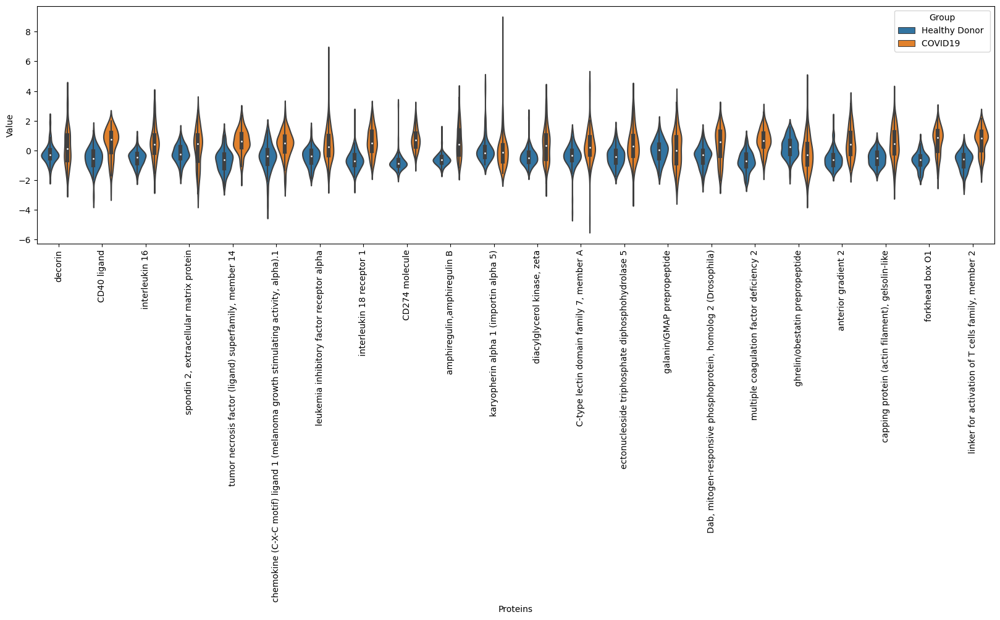

In [59]:
#Plot dimensions
plt.figure(figsize=(20,5)) # has to be above the graph

#Making the violin plot
plt.xticks(rotation=90)
sns.violinplot(data = filter_long, x = 'variable' , y= 'value',  hue= "Group")

# Labels
plt.xlabel("Proteins") # Has to be below
plt.ylabel("Value")

# Making PCA plots for outliers

In [60]:
# PCA plots
from sklearn.decomposition import PCA
pca = PCA(n_components=10).fit_transform(standard)

# PCA variance and residuals 
pca_df = pd.DataFrame(data = pca, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], index=standard_proteomic_meta.index)

# Indexing is always with square brackets
pca_df =pd.merge(pca_df, standard_proteomic_meta["Group"],right_index= True, left_index= True)
pca_df =pd.merge(pca_df, standard_proteomic_meta["WHO_status"],right_index= True, left_index= True)
pca_df 


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,Group,WHO_status
sample_id,,,,,,,,,,,,
1010823,-4.353254,-4.756417,4.619233,2.476894,-1.192961,-3.305419,-1.382208,-2.227940,0.602880,-2.090765,Healthy Donor,0
1029090,-7.189361,-1.059748,4.756439,-0.014422,-1.309246,-5.029569,-1.404923,-3.033802,1.444719,-0.551969,Healthy Donor,0
1049423,-10.052158,-0.883871,1.547246,0.527059,-2.597714,-0.100637,-0.329835,1.219245,-1.342272,1.032308,Healthy Donor,0
1057525,-8.948664,-1.067639,1.289295,0.709023,2.400933,-1.308411,0.151124,-2.220260,-0.426313,0.079467,Healthy Donor,0
1065558,-16.793458,2.054817,-2.192226,-1.640388,0.991248,-0.295737,1.144006,2.485674,0.609924,1.289925,Healthy Donor,0
...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,16.045222,-10.287039,0.539132,7.605728,6.701482,-1.573326,-4.906445,-0.751720,14.591898,-5.650515,COVID19,3-4
INCOV141,6.592645,-8.384445,-3.913641,1.927923,3.386042,3.925894,-0.369913,-3.007869,1.201118,-2.291686,COVID19,1-2
INCOV142,10.216271,2.369642,-14.550939,2.466734,0.426694,-1.905334,-1.301673,-2.210532,4.083761,1.889068,COVID19,5-7


# Making PCA plots


In [61]:
# PCA plots
from sklearn.decomposition import PCA
#pca = PCA(n_components=10).fit_transform(standard)
pca = PCA(n_components=5).fit_transform(standard)

# PCA variance and residuals 
#pca_df = pd.DataFrame(data = pca, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], index=standard_proteomic_meta.index)
pca_df = pd.DataFrame(data = pca, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], index=standard_proteomic_meta.index)

# Indexing is always with square brackets
pca_df =pd.merge(pca_df, standard_proteomic_meta["Group"],right_index= True, left_index= True)
pca_df =pd.merge(pca_df, standard_proteomic_meta["WHO_status"],right_index= True, left_index= True)
pca_df 



,PC1,PC2,PC3,PC4,PC5,Group,WHO_status
sample_id,,,,,,,
1010823,-4.353254,-4.756417,4.619233,2.476894,-1.192961,Healthy Donor,0
1029090,-7.189361,-1.059748,4.756439,-0.014422,-1.309246,Healthy Donor,0
1049423,-10.052158,-0.883871,1.547246,0.527059,-2.597714,Healthy Donor,0
1057525,-8.948664,-1.067639,1.289295,0.709023,2.400933,Healthy Donor,0
1065558,-16.793458,2.054817,-2.192226,-1.640388,0.991248,Healthy Donor,0
...,...,...,...,...,...,...,...
INCOV139,16.045222,-10.287039,0.539132,7.605728,6.701482,COVID19,3-4
INCOV141,6.592645,-8.384445,-3.913641,1.927923,3.386042,COVID19,1-2
INCOV142,10.216271,2.369642,-14.550939,2.466734,0.426694,COVID19,5-7


In [62]:
pca1 = PCA(n_components=10).fit(standard)
var_exp = pca1.explained_variance_ratio_
var_exp_df = pd.DataFrame(data=var_exp, columns= ["Ratio"], index= ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10']) 
var_exp_df["Varriance_percent"]= var_exp_df["Ratio"] *100
var_exp_df["Residual"]= 100 - (var_exp_df["Ratio"]*100)
print(var_exp_df.sum())
var_exp_df

Ratio                  0.631486
Varriance_percent     63.148643
Residual             936.851357
dtype: float64


,Ratio,Varriance_percent,Residual
PC1,0.297566,29.756593,70.243407
PC2,0.143452,14.345188,85.654812
PC3,0.069534,6.953427,93.046573
PC4,0.025477,2.547683,97.452317
PC5,0.022278,2.227807,97.772193
PC6,0.016881,1.688126,98.311874
PC7,0.015974,1.597386,98.402614
PC8,0.014452,1.445212,98.554788
PC9,0.013828,1.382779,98.617221
PC10,0.012044,1.204442,98.795558


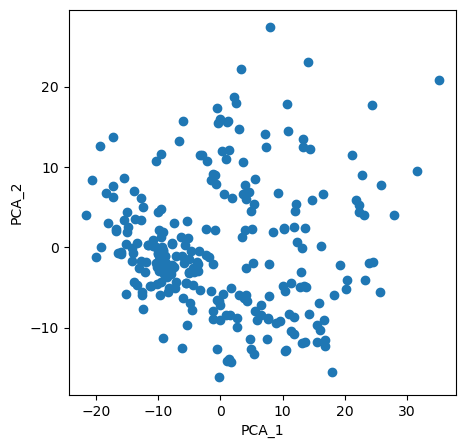

In [63]:
# View PCA
plt.figure(figsize=(5,5))
plt.xlabel("PCA_1")
plt.ylabel("PCA_2")
plt.scatter(pca_df.PC1, pca_df.PC2)


<AxesSubplot:title={'center':'PCA Proteomics - Group'}, xlabel='PCA_1', ylabel='PCA_2'>

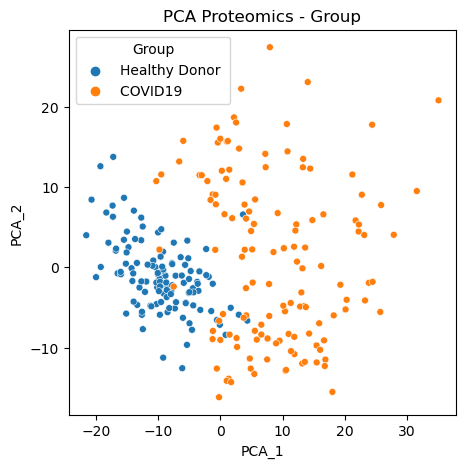

In [64]:
#Scatter plot to visualize COVID vs Healthy
plt.figure(figsize=(5,5))
plt.title("PCA Proteomics - Group")
plt.xlabel("PCA_1")
plt.ylabel("PCA_2")
sns.scatterplot(x=pca[:, 0 ], y=pca[:, 1], hue=standard_proteomic_meta["Group"], s=25)
# Needs to be in a numpy array


<AxesSubplot:title={'center':'PCA Proteomics'}, xlabel='PC1', ylabel='PC2'>

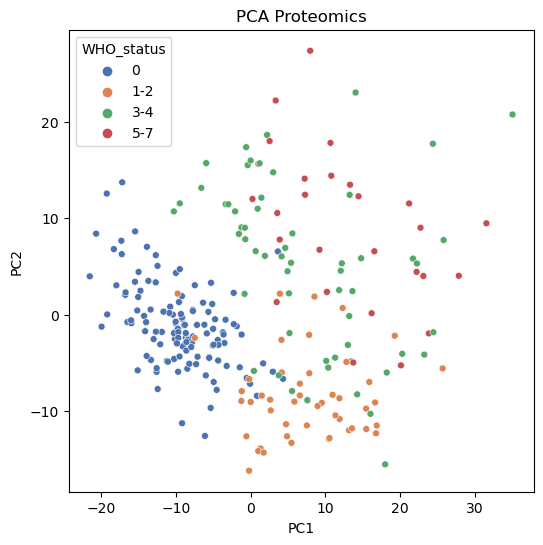

In [65]:
#Scatter plot to visualize COVID vs Healthy
plt.figure(figsize=(6,6))
plt.title("PCA Proteomics")
plt.xlabel("PC1")
plt.ylabel("PC2")
sns.scatterplot(x=pca[:, 0 ], y=pca[:, 1], hue=standard_proteomic_meta["WHO_status"], s=25, palette='deep' , hue_order= ["0", "1-2", "3-4", "5-7"])
# Needs to be in a numpy array


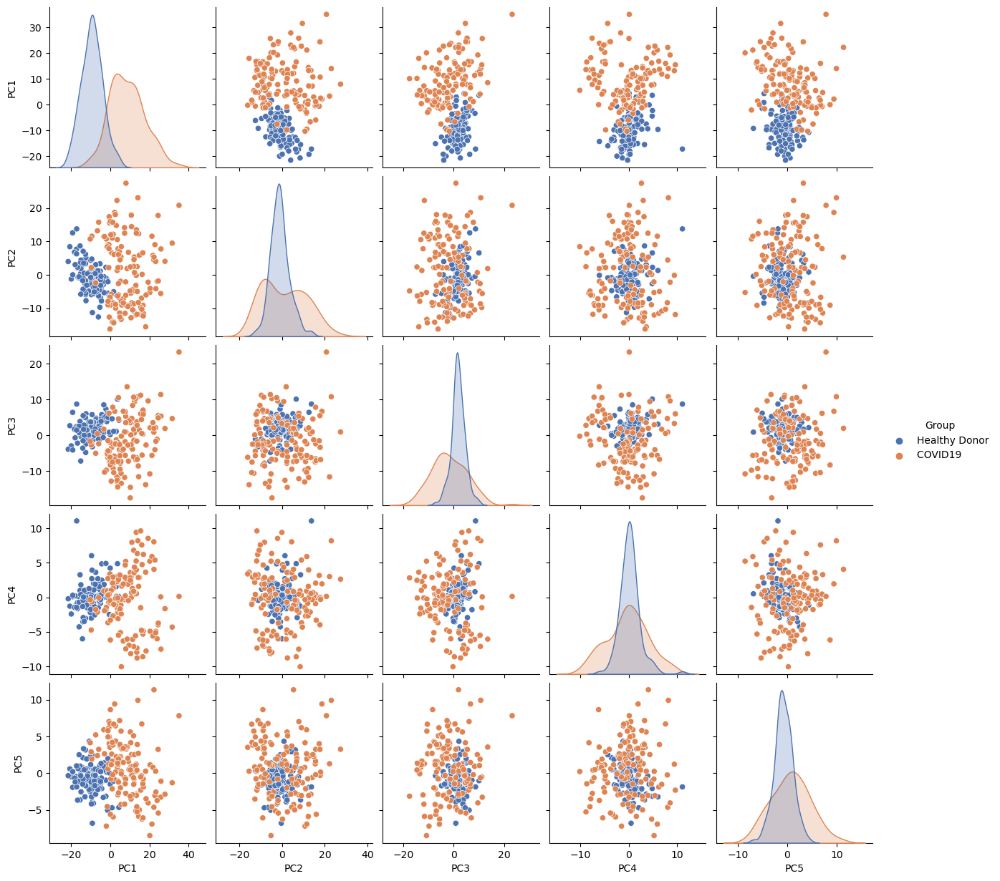

In [66]:
# Pairplot

sns.pairplot(pca_df, hue="Group", palette="deep")

# Needs to be in a dataframe to graph a pairplot

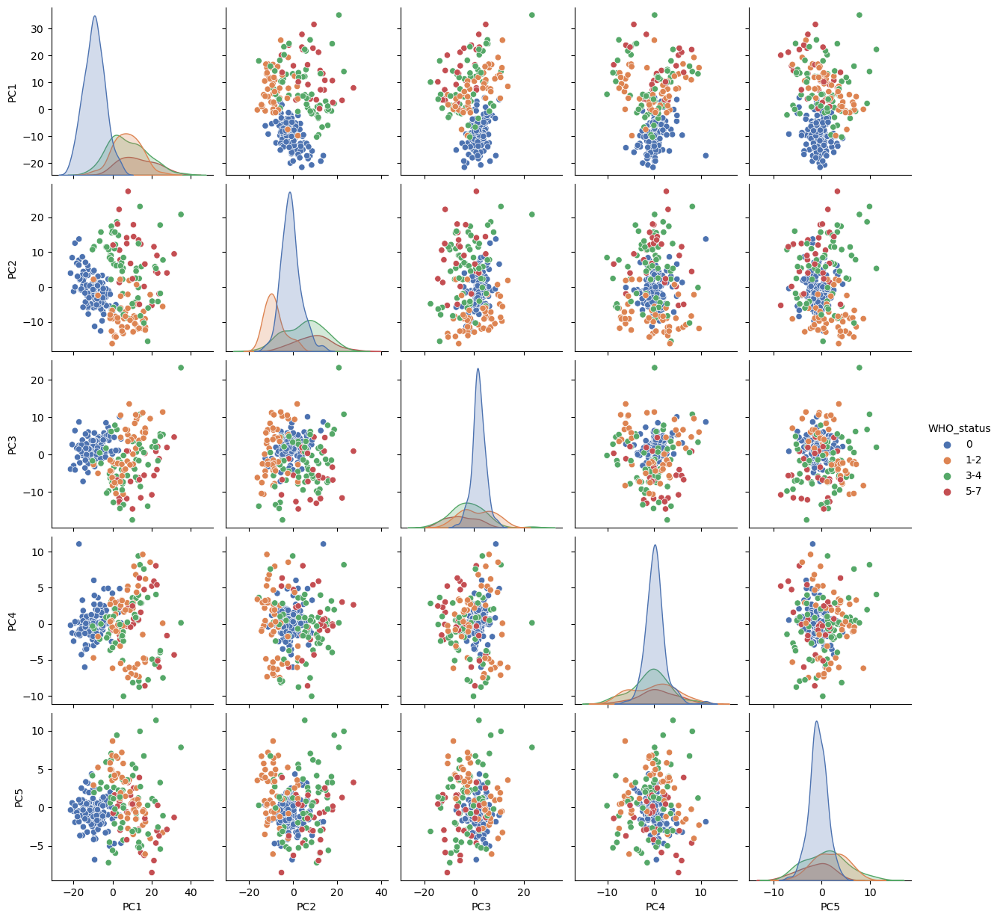

In [67]:
# Pairplot

sns.pairplot(pca_df, hue="WHO_status", palette="deep", hue_order= ["0", "1-2", "3-4", "5-7"])

# Needs to be in a dataframe

In [68]:
# How to remove outliers
# Can label them and then remove them because you know the label

# Order the data frame by highest to lowest 
pca_df['PC3'].sort_values()
#Make a list of the samples you want to get rid of then drop and then make a new data frame with all of the outliers removed
# How to drop rows or columns from a data frame ex. drop 1027114, INCOV064-BL


#Need brackets () after when you're usuing a function that takes arguments
# Dont need () after an attribute (i.e shape) which is essentially a metadata about it
 

sample_id
INCOV125   -17.496607
INCOV142   -14.550939
INCOV133   -14.425683
INCOV111   -13.811448
INCOV124   -13.433878
              ...    
INCOV028    10.780322
INCOV097    11.187650
INCOV083    11.382680
INCOV092    13.542361
INCOV090    23.253208
Name: PC3, Length: 257, dtype: float64

Volcano Plot

In [69]:
# Make group healthy vs COVID19

COVID19_group = standard_proteomic_meta[standard_proteomic_meta["Group"] == "COVID19 "] # It has a hidden space 
Healthy_group = standard_proteomic_meta[standard_proteomic_meta["Group"] != "COVID19 "] 


In [70]:
def t_tests(matrix, classes, multiple_correction_method, testtype="ttest"):
    metabolites = matrix.columns.tolist()
    matrix['Group'] = pd.factorize(classes)[0]
    disease = matrix.loc[matrix["Group"] == 0]
    disease.drop(['Group'], axis=1, inplace=True)
    ctrl = matrix.loc[matrix["Group"] != 0]
    ctrl.drop(['Group'], axis=1, inplace=True)
    if testtype == "mwu":
        pvalues = stats.mannwhitneyu(disease, ctrl, axis=0)[1] # T test for the non-parametric (not normally distributed); some people think its still not going to be normal so they feel more comfortable to do the ManWhitneyU tesy
    else:
        pvalues = stats.ttest_ind(disease, ctrl)[1]
        
    padj = sm.stats.multipletests(pvalues, 0.05, method=multiple_correction_method)
    results = pd.DataFrame(zip(metabolites, pvalues, padj[1]),
                           columns=["Protein", "P-value", "P-adjust"])
    return results

In [71]:
# Results from T test with multiple corrections
#Calculate the p values using T test on the data that has not been scaled (but still log)

# First input = your data
# Second input = the column you're analyzing, need to put it as df["Name of coulmn"] because pd.factorize takes a series (each column of a data frame is a series)
# Third input = correction method; fdr_bh is multiple correction
# Forth input = if you want to run a T test (if normal) or man whitneyu (if not normal)

results = t_tests(imputed_data, imputed_dat_meta["Group"], "fdr_bh")
results.index= results.Protein # Need to merge by index so each index has the same data frame so we are making the index of this to be Protein; defining the index name
results["-log10_P_adjusted"] = -np.log10(results["P-adjust"])
results

/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/2813427203.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disease.drop(['Group'], axis=1, inplace=True)
/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/2813427203.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ctrl.drop(['Group'], axis=1, inplace=True)


,Protein,P-value,P-adjust,-log10_P_adjusted
Protein,,,,
"lectin, galactoside-binding, soluble, 9","lectin, galactoside-binding, soluble, 9",3.101627e-39,4.855650e-38,37.313753
"tumor necrosis factor receptor superfamily, member 10a","tumor necrosis factor receptor superfamily, me...",1.006869e-24,4.968679e-24,23.303759
agouti related protein homolog (mouse),agouti related protein homolog (mouse),5.025303e-15,1.288976e-14,13.889755
"tumor necrosis factor receptor superfamily, member 10b","tumor necrosis factor receptor superfamily, me...",1.081813e-18,3.387193e-18,17.470160
"tumor necrosis factor receptor superfamily, member 13B","tumor necrosis factor receptor superfamily, me...",3.175019e-10,6.056550e-10,9.217775
...,...,...,...,...
mitogen-activated protein kinase kinase kinase kinase 5,mitogen-activated protein kinase kinase kinase...,6.372435e-23,2.606383e-22,21.583962
negative regulator of ubiquitin-like proteins 1,negative regulator of ubiquitin-like proteins 1,2.589172e-22,1.040251e-21,20.982862
ectonucleoside triphosphate diphosphohydrolase 2,ectonucleoside triphosphate diphosphohydrolase 2,2.922129e-02,3.358599e-02,1.473842


In [72]:
#Calculate Fold Change

COVID19_group_unscaled = unscaled_meta[unscaled_meta["Group"] == "COVID19 "] # It has a hidden space 
Healthy_group_unscaled = unscaled_meta[unscaled_meta["Group"] != "COVID19 "] 


# Calculating fold change: (Y - X)/X or is it (Y-X) - ask Cecelia?
# Need to use the UNSCALED values to calculate fold change; the data is already log2 transformed
fold_changes = (np.mean(COVID19_group_unscaled, axis=0)) - (np.mean(Healthy_group_unscaled, axis=0))

# Convert into a data frame
fold_changes = pd.DataFrame(fold_changes, columns= ["Fold_Change"]) # to name a column write column = ["Name of column"]; need to add the name of the column as a list 

fold_changes

/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


,Fold_Change
"lectin, galactoside-binding, soluble, 9",1.113967
"tumor necrosis factor receptor superfamily, member 10a",1.039484
agouti related protein homolog (mouse),0.775164
"tumor necrosis factor receptor superfamily, member 10b",1.059747
"tumor necrosis factor receptor superfamily, member 13B",0.507823
...,...
mitogen-activated protein kinase kinase kinase kinase 5,2.153627
negative regulator of ubiquitin-like proteins 1,1.691051
ectonucleoside triphosphate diphosphohydrolase 2,0.133894
"melanoma antigen family D, 1",1.396291


In [73]:
# Make data frame for volcano plot
volcano_df = pd.merge(fold_changes["Fold_Change"], results, right_index= True, left_index= True)
volcano_df

,Fold_Change,Protein,P-value,P-adjust,-log10_P_adjusted
"lectin, galactoside-binding, soluble, 9",1.113967,"lectin, galactoside-binding, soluble, 9",3.101627e-39,4.855650e-38,37.313753
"tumor necrosis factor receptor superfamily, member 10a",1.039484,"tumor necrosis factor receptor superfamily, me...",1.006869e-24,4.968679e-24,23.303759
agouti related protein homolog (mouse),0.775164,agouti related protein homolog (mouse),5.025303e-15,1.288976e-14,13.889755
"tumor necrosis factor receptor superfamily, member 10b",1.059747,"tumor necrosis factor receptor superfamily, me...",1.081813e-18,3.387193e-18,17.470160
"tumor necrosis factor receptor superfamily, member 13B",0.507823,"tumor necrosis factor receptor superfamily, me...",3.175019e-10,6.056550e-10,9.217775
...,...,...,...,...,...
mitogen-activated protein kinase kinase kinase kinase 5,2.153627,mitogen-activated protein kinase kinase kinase...,6.372435e-23,2.606383e-22,21.583962
negative regulator of ubiquitin-like proteins 1,1.691051,negative regulator of ubiquitin-like proteins 1,2.589172e-22,1.040251e-21,20.982862
ectonucleoside triphosphate diphosphohydrolase 2,0.133894,ectonucleoside triphosphate diphosphohydrolase 2,2.922129e-02,3.358599e-02,1.473842
"melanoma antigen family D, 1",1.396291,"melanoma antigen family D, 1",4.377013e-36,6.021709e-35,34.220280


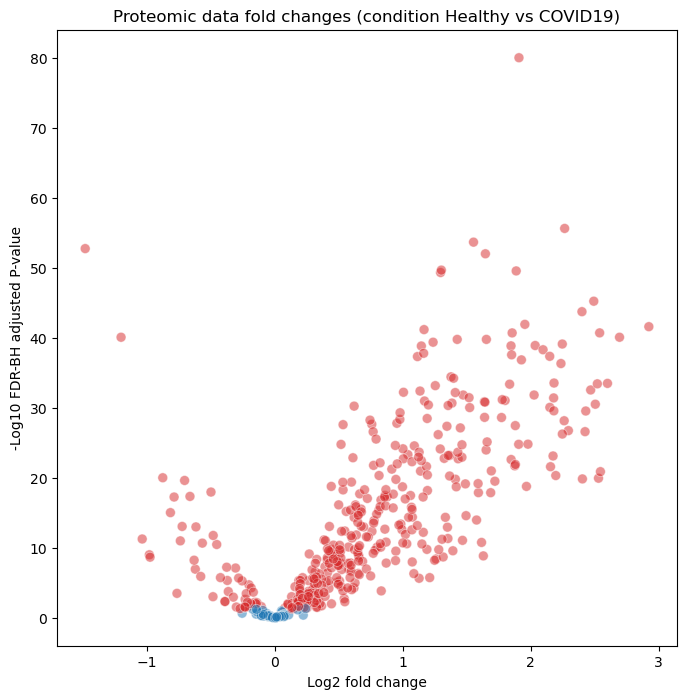

In [74]:
# Make graph 

# Need to log normalize the p values
# .tolist() converts into a list, which you would want if you had it as an array? ask Cecelia

# Making plots
fig, ax = plt.subplots(figsize=(8, 8))
coloring = ["tab:red" if i <= 0.05 else "tab:blue" for i in volcano_df["P-adjust"].tolist()] #if p value is below 0.05 put it as red and if it isnt put it as blue
sns.scatterplot(y=-np.log10(volcano_df["P-adjust"].tolist()), x=volcano_df["Fold_Change"].tolist(), s=50, alpha=0.5, zorder=3, c = coloring)

# Label titles
plt.ylabel("-Log10 FDR-BH adjusted P-value")
plt.xlabel("Log2 fold change")
plt.title("Proteomic data fold changes (condition Healthy vs COVID19)")

# Show and save figures
plt.show()

# Looks slightly unexpected - take one of the metabolites and manually calculate the fold change that its numerically corrected by the code 
#trouble shoot run line by line and print the line by line output and command every line, check commentation of the function
# for i in whatever; list comprehension advance coding, but it does everything in one line; is quciker because apend is slow; it used to optmize code

SSPA package

In [75]:
#Load Reactome pathways and KEGG pathways
# This returns a GMT format pandas DataFrame containing the pathway information
reactome_pathways  = sspa.process_reactome(organism="Homo sapiens")
kegg_human_pathways  = sspa.process_kegg(organism="hsa")
reactome_uniprot = sspa.process_reactome("Homo sapiens","/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Databases/UniProt2Reactome_All_Levels.txt") 
# Website: https://reactome.org/download-data
# just need to call the function, not the function and the module so just 
# download Reactome latest
#reactome_pathways = sspa.process_reactome("Homo sapiens", download_latest=True, filepath=".")


In [76]:
# View reactome pathway
reactome_pathways

# Make dictionary with pathway name and RSA 

,Pathway_name,0,1,2,3,4,5,6,7,8,...,1468,1469,1470,1471,1472,1473,1474,1475,1476,1477
R-HSA-1059683,Interleukin-6 signaling,30616,456216,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109581,Apoptosis,61120,4705,456216,28494,36080,15377,43474,30616,16412,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109582,Hemostasis,15366,91144,15377,15378,15379,456215,456216,35366,37941,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109606,Intrinsic Pathway for Apoptosis,456216,28494,36080,15377,43474,30616,None,None,None,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109703,PKB-mediated events,456216,16618,17489,15377,456215,30616,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R-HSA-983695,Antigen activates B Cell Receptor (BCR) leadin...,57540,456216,16618,18348,36080,16595,29108,17815,30616,...,None,None,None,None,None,None,None,None,None,None
R-HSA-983705,Signaling by the B Cell Receptor (BCR),57540,456216,16618,29034,18348,58189,36080,29105,16595,...,None,None,None,None,None,None,None,None,None,None
R-HSA-983712,Ion channel transport,17544,49552,15377,15378,35475,456216,30616,16038,76072,...,None,None,None,None,None,None,None,None,None,None
R-HSA-991365,Activation of GABAB receptors,58189,29103,17552,59888,43474,18420,37565,None,None,...,None,None,None,None,None,None,None,None,None,None


In [77]:
#View kegg pathway
kegg_human_pathways.head()

# KEGG isnt loading

,Pathway_name,0,1,2,3,4,5,6,7,8,...,316,317,318,319,320,321,322,323,324,325
hsa00010,Glycolysis / Gluconeogenesis - Homo sapiens (h...,C00221,C15972,C01159,C00267,C06188,C06187,C00022,C01451,C00118,...,None,None,None,None,None,None,None,None,None,None
hsa00020,Citrate cycle (TCA cycle) - Homo sapiens (human),C15972,C00026,C00022,C05125,C00024,C16255,C00122,C00417,C00158,...,None,None,None,None,None,None,None,None,None,None
hsa00030,Pentose phosphate pathway - Homo sapiens (human),C03752,C00221,C01801,C00257,C00258,C20589,C00121,C00620,C00022,...,None,None,None,None,None,None,None,None,None,None
hsa00040,Pentose and glucuronate interconversions - Hom...,C20680,C06441,C00508,C04575,C00474,C00714,C00532,C05411,C00026,...,None,None,None,None,None,None,None,None,None,None
hsa00051,Fructose and mannose metabolism - Homo sapiens...,C01721,C00424,C00976,C00096,C00267,C00159,C01099,C11544,C01934,...,None,None,None,None,None,None,None,None,None,None


In [78]:
# Make dictionary

gene_description = olink["gene_description"]
uniprot	= olink["uniprot"]

uniprot_id = dict(zip(gene_description, uniprot))
uniprot_id

# Replace name with uniport IDs
uniport_proteomic = standard_proteomic_meta.rename(mapper= uniprot_id, axis=1)
uniport_proteomic


,WHO_status,Group,O00182,O00220,O00253,O14763,O14836,O43915,O94907,P00797,...,Q9UHF1,Q9UKL0,Q9ULX7,Q9UNK0,Q9Y478,Q9Y4K4,Q9Y5A7,Q9Y5L3,Q9Y5V3,Q9Y653
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,0,Healthy Donor,-0.774169,-0.715042,-0.475117,-0.376539,-0.242449,0.465974,-0.035831,-1.096496,...,-0.989566,-0.846847,0.211866,-0.662963,-0.763679,-0.329100,-0.448917,-0.533633,-1.385562,-0.256394
1029090,0,Healthy Donor,-0.630451,-0.747448,-0.614390,-0.431615,-0.663813,1.342395,-1.075601,-1.571843,...,-1.045833,-0.824271,0.222942,-0.544820,-0.606509,-0.746644,-0.310256,0.009598,-0.980404,-0.484592
1049423,0,Healthy Donor,-0.869347,-0.806791,-0.589703,-0.453958,2.916144,-0.139408,-1.162517,-0.299875,...,-1.550021,-0.840020,0.226861,-0.501834,-0.754269,-0.649450,-0.464950,0.249570,-0.488508,-0.795142
1057525,0,Healthy Donor,-1.183256,-0.661162,0.318194,-0.607657,-0.286423,0.747850,-1.019120,-0.871288,...,-0.432772,-1.001817,0.472765,-0.646423,-0.897788,-0.573819,-0.952502,-0.307157,-1.059203,-0.267909
1065558,0,Healthy Donor,-0.706962,-0.590959,-0.421688,-0.431809,-0.331733,-0.638581,-0.827605,-0.448884,...,-1.313631,-0.949374,0.030338,-1.348789,-1.550576,-1.364199,-1.433501,-0.402257,-1.459650,-0.667893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,3-4,COVID19,-0.371715,-0.099352,-0.342947,-0.171196,-1.014702,-0.420922,1.351346,-1.283404,...,1.181426,3.274395,0.656156,1.384484,1.722687,1.159764,2.163207,-1.071250,1.245149,-0.332915
INCOV141,1-2,COVID19,0.378032,-0.310503,-0.929602,-1.002270,-0.908728,0.023220,0.709804,-0.331578,...,0.387357,1.134318,1.579150,1.012202,0.793193,0.734457,1.330451,-0.977843,0.573041,-0.681664
INCOV142,5-7,COVID19,1.040650,0.642916,0.830414,0.543150,1.149508,-1.346764,1.016663,0.869184,...,0.349971,1.146998,-1.076766,0.475122,0.680888,0.648045,0.917351,-1.143528,0.354805,1.392459


# kPCA

In [79]:
# kPCA
kpca_scores = sspa.sspa_kpca(uniport_proteomic, reactome_uniprot)
print("kPCA shape:", kpca_scores.shape)

## ssPA method minimum threshold is 2 by default; if you want to change it then its min_entity = can change change increase it 



kPCA shape: (257, 598)


In [80]:
# Drop vauge overarching pathways
print(kpca_scores.shape)
kpca_scores = kpca_scores.drop(columns=["R-HSA-1640170", "R-HSA-1500931","R-HSA-8953897", "R-HSA-4839726", "R-HSA-1266738", "R-HSA-1643685", "R-HSA-73894", "R-HSA-69306",
                            "R-HSA-9748784","R-HSA-1474244","R-HSA-74160","R-HSA-109582","R-HSA-168256","R-HSA-1430728",
                            "R-HSA-392499","R-HSA-8953854", "R-HSA-397014","R-HSA-112316","R-HSA-1852241","R-HSA-5357801",
                            "R-HSA-9609507","R-HSA-9709957","R-HSA-162582","R-HSA-382551","R-HSA-5653656"])
print(kpca_scores.shape)

(257, 598)
(257, 573)


In [81]:
## Not present 
## kpca_scores["R-HSA-9612973"] # Autophagy
## kpca_scores["R-HSA-400253"] # Circadian Clock
## kpca_scores["R-HSA-8963743"] # Digestion and absorption
# kpca_scores["R-HSA-1474165"] # Reproduction

## Present
#kpca_scores["R-HSA-1640170"] # Cell Cycle
#kpca_scores["R-HSA-1500931"] # Cell-Cell communication
#kpca_scores["R-HSA-8953897"] # Cellular responses to stimuli
#kpca_scores["R-HSA-4839726"] # Chromatin organization
#kpca_scores["R-HSA-1266738"] # Developmental Biology
#kpca_scores["R-HSA-1643685"] # Disease
#kpca_scores["R-HSA-73894"] # DNA Repair
#kpca_scores["R-HSA-69306"] # DNA Replication
#kpca_scores["R-HSA-9748784"] # Drug ADME
#kpca_scores["R-HSA-1474244"] # Extracellular matrix organization
#kpca_scores["R-HSA-74160"] # Gene expression (Transcription)
#kpca_scores["R-HSA-109582"] # Hemostasis
#kpca_scores["R-HSA-168256"] # Immune System
#kpca_scores["R-HSA-1430728"] # Metabolism
#kpca_scores["R-HSA-392499"] # Metabolism of proteins
#kpca_scores["R-HSA-8953854"] # Metabolism of RNA
#kpca_scores["R-HSA-397014"] # Muscle contraction
#kpca_scores["R-HSA-112316"] # Neuronal System
#kpca_scores["R-HSA-1852241"] # Organelle biogenesis and maintenance
#kpca_scores["R-HSA-5357801"] # Programmed Cell Death
#kpca_scores["R-HSA-9609507"] # Protein localization
#kpca_scores["R-HSA-9709957"] # Sensory Perception
#kpca_scores["R-HSA-162582"] # Signal Transduction
#kpca_scores["R-HSA-382551"] # Transport of small molecules
#kpca_scores["R-HSA-5653656"] # Vesicle-mediated transport

In [82]:
len(set(kpca_scores.columns))

573

In [83]:
print("Number of pathways", len(kpca_scores.columns.to_list()))
# print("Pathways",kpca_scores.columns.to_list())


Number of pathways 573


In [84]:
# Look at distribution of pathway scores

kpca_1 = kpca_scores.iloc[:,::90]
kpca_1["Group"] = standard_proteomic_meta["Group"]

kpca_2 = kpca_scores.iloc[:,10::50]
kpca_2["Group"] = standard_proteomic_meta["Group"]

## Do the same with the metabolomics and look at 
kpca_1

/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/3770877967.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kpca_1["Group"] = standard_proteomic_meta["Group"]
/var/folders/yq/6fgvx0fj0cs57zmqydzbhbfh0000gn/T/ipykernel_5475/3770877967.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kpca_2["Group"] = standard_proteomic_meta["Group"]


,R-HSA-109581,R-HSA-174824,R-HSA-216083,R-HSA-428157,R-HSA-5663202,R-HSA-8866910,R-HSA-9679506,Group
sample_id,,,,,,,,
1010823,-0.032059,0.529539,-0.161570,-0.148154,-0.059342,-0.461730,-0.212395,Healthy Donor
1029090,-0.199815,0.048914,-0.297447,-0.302186,-0.485856,-0.521387,-0.359396,Healthy Donor
1049423,-0.553664,-0.450940,-0.235052,0.271435,-0.451126,-0.562202,-0.298952,Healthy Donor
1057525,-0.429940,0.398071,-0.227441,-0.107044,-0.456625,-0.595755,-0.494210,Healthy Donor
1065558,-0.499792,0.258725,-0.090486,0.035944,-0.436287,-0.602174,-0.452669,Healthy Donor
...,...,...,...,...,...,...,...,...
INCOV139,0.356256,0.155618,-0.198859,-0.342867,0.365597,0.484993,0.472209,COVID19
INCOV141,0.448792,0.618460,-0.133381,0.089378,0.438216,0.244003,0.375980,COVID19
INCOV142,0.344616,-0.088568,0.545197,0.478897,0.357791,0.590416,0.410959,COVID19


<Figure size 800x800 with 0 Axes>

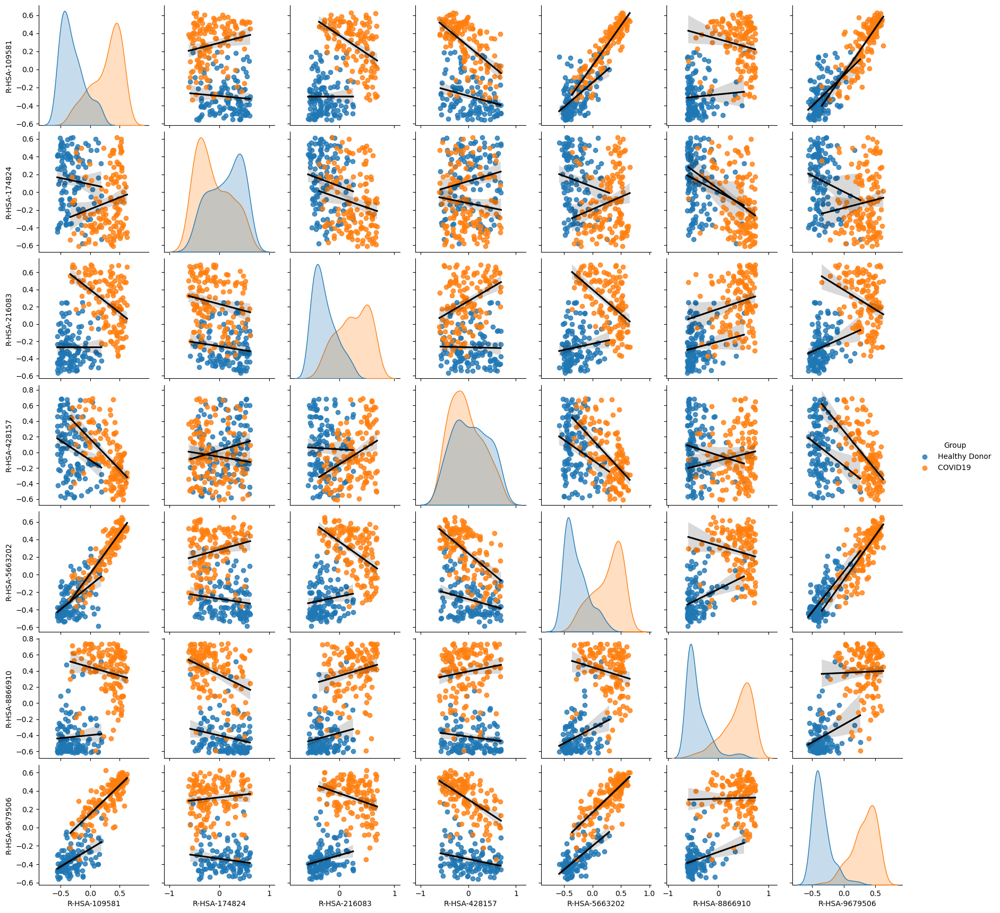

In [85]:
plt.figure(figsize=(8,8))
sns.pairplot(data=kpca_1, hue="Group", kind="reg", plot_kws={'line_kws':{'color':'black'}}) ## line_kws are additional keywords added to a scatterplot

In [86]:
# sns.pairplot(data=kpca_2, hue="Group", kind="reg", plot_kws={'line_kws':{'color':'black'}}) ## line_kws are additional keywords added to a scatterplot

In [87]:
kpca_scores_stack = kpca_scores.stack().reset_index()
kpca_scores_stack.columns = ["sample_ID", "Pathway", "Pathway_score"]
kpca_scores_stack

,sample_ID,Pathway,Pathway_score
0,1010823,R-HSA-109581,-0.032059
1,1010823,R-HSA-109606,-0.211955
2,1010823,R-HSA-109704,-0.327562
3,1010823,R-HSA-110362,0.049359
4,1010823,R-HSA-110373,0.049359
...,...,...,...
147256,INCOV145,R-HSA-983168,0.532079
147257,INCOV145,R-HSA-983169,0.468301
147258,INCOV145,R-HSA-983231,0.769626
147259,INCOV145,R-HSA-983695,0.589059


Text(0, 0.5, 'Frequency')

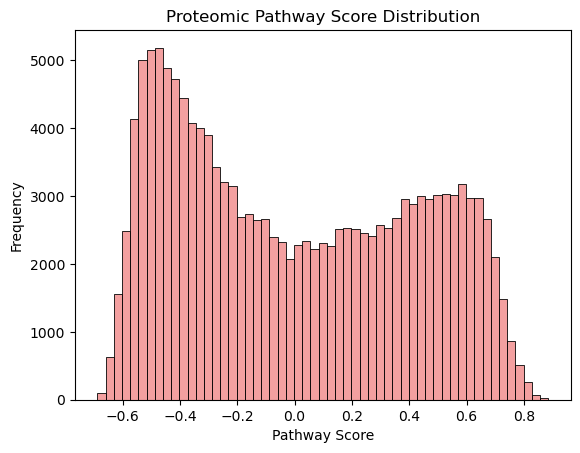

In [88]:
# Distribution of Pathway score for proteins

sns.histplot(data=kpca_scores_stack, x= kpca_scores_stack["Pathway_score"], color = 'lightcoral')
plt.title("Proteomic Pathway Score Distribution")
plt.xlabel("Pathway Score")
plt.ylabel("Frequency")


<AxesSubplot:xlabel='variable', ylabel='value'>

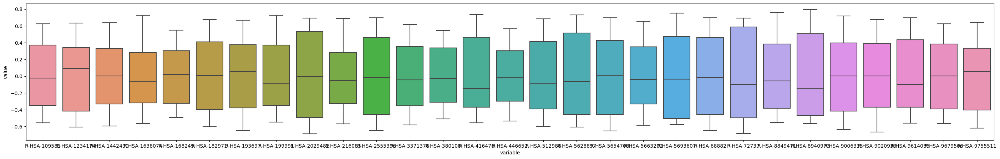

In [89]:
filter = kpca_scores.iloc[:,::20]
filter = pd.melt(filter)
plt.figure(figsize=(35,5))
sns.boxplot(x = 'variable' , y= 'value', data=filter)

In [90]:
# Replae pathway IDs with pathways names

#Make two lists to zip together
reactome_uniprot_id = reactome_uniprot.index
reactome_uniprot_pathway = reactome_uniprot["Pathway_name"]

# Make a dictionary with two lists 
reactome_dict = dict(zip(reactome_uniprot_id, reactome_uniprot_pathway)) # zip is a way of pulling two lists together (need to be same length) and put it into a tupple (pair of things)
reactome_dict


{'R-HSA-1059683': 'Interleukin-6 signaling',
 'R-HSA-109581': 'Apoptosis',
 'R-HSA-109582': 'Hemostasis',
 'R-HSA-109606': 'Intrinsic Pathway for Apoptosis',
 'R-HSA-109703': 'PKB-mediated events',
 'R-HSA-109704': 'PI3K Cascade',
 'R-HSA-110056': 'MAPK3 (ERK1) activation',
 'R-HSA-110312': 'Translesion synthesis by REV1',
 'R-HSA-110313': 'Translesion synthesis by Y family DNA polymerases bypasses lesions on DNA template',
 'R-HSA-110314': 'Recognition of DNA damage by PCNA-containing replication complex',
 'R-HSA-110320': 'Translesion Synthesis by POLH',
 'R-HSA-110328': 'Recognition and association of DNA glycosylase with site containing an affected pyrimidine',
 'R-HSA-110329': 'Cleavage of the damaged pyrimidine ',
 'R-HSA-110330': 'Recognition and association of DNA glycosylase with site containing an affected purine',
 'R-HSA-110331': 'Cleavage of the damaged purine',
 'R-HSA-110357': 'Displacement of DNA glycosylase by APEX1',
 'R-HSA-110362': 'POLB-Dependent Long Patch Base Ex

In [91]:
# Rename the pathway IDs with pathway names

# kPCA_names = kpca_scores.rename(mapper=reactome_dict, axis=1, errors='ignore') # axis =1 because you want to replace columns
# kPCA_names["Attachment and Entry"]

kPCA_names = kpca_scores
kPCA_names 
#mapper is the data structure you're giving it ; contains the coulmn names and what you want it mapped to; use diction

,R-HSA-109581,R-HSA-109606,R-HSA-109704,R-HSA-110362,R-HSA-110373,R-HSA-111465,R-HSA-112314,R-HSA-112315,R-HSA-112399,R-HSA-114508,...,R-HSA-975871,R-HSA-9758881,R-HSA-9759194,R-HSA-9772572,R-HSA-9772573,R-HSA-983168,R-HSA-983169,R-HSA-983231,R-HSA-983695,R-HSA-983705
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,-0.032059,-0.211955,-0.327562,0.049359,0.049359,0.141269,-0.460049,-0.409174,-0.327562,-0.165081,...,0.016476,0.078632,0.247628,-0.273294,-0.214313,-0.146975,-0.212929,-0.294839,0.184332,-0.024023
1029090,-0.199815,-0.333629,0.101999,-0.510433,-0.510433,-0.089141,-0.516720,-0.534277,0.101999,-0.460059,...,-0.278400,0.155778,0.063540,-0.114437,-0.319053,-0.448024,-0.512255,-0.504086,-0.522890,-0.430729
1049423,-0.553664,0.523944,0.097818,-0.508981,-0.508981,-0.513514,-0.543173,-0.560950,0.097818,-0.520982,...,-0.551378,0.677893,-0.490542,-0.495449,-0.501505,-0.511872,-0.492252,-0.556389,0.056385,-0.156212
1057525,-0.429940,-0.147421,0.120971,-0.403370,-0.403370,-0.475916,-0.541395,-0.533350,0.120971,-0.364895,...,-0.431225,-0.407620,-0.119335,-0.468034,-0.537365,-0.490824,-0.499926,-0.448103,-0.516311,-0.482990
1065558,-0.499792,0.662202,0.209682,-0.520688,-0.520688,-0.494941,-0.378345,-0.412406,0.209682,-0.511481,...,-0.527689,-0.388423,-0.547618,-0.241959,-0.419640,-0.540850,-0.473224,-0.514543,-0.498446,-0.533020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,0.356256,-0.031794,-0.021092,0.234402,0.234402,0.282476,0.745239,0.717664,-0.021092,0.656921,...,0.184527,-0.284981,0.574114,0.262427,0.564825,0.578648,0.297682,0.340321,0.631290,0.600646
INCOV141,0.448792,-0.506748,-0.476594,0.350158,0.350158,0.758998,0.646614,0.676666,-0.476594,0.849130,...,0.557714,-0.505831,0.634184,-0.376497,0.466782,0.472867,0.327867,0.805540,0.699063,0.576791
INCOV142,0.344616,-0.096260,-0.156027,0.654677,0.654677,0.606634,0.500648,0.569463,-0.156027,0.786014,...,0.394834,0.276422,0.248678,0.334217,0.424065,0.628359,0.460514,0.661202,0.594364,0.527780


In [92]:
# Add Group and WHO_status back

kpca_scores_meta_1 = pd.merge(standard_proteomic_meta["Group"], kPCA_names,right_index= True, left_index= True)
kpca_scores_meta = pd.merge(standard_proteomic_meta["WHO_status"], kpca_scores_meta_1,right_index= True, left_index= True)
kpca_scores_meta

,WHO_status,Group,R-HSA-109581,R-HSA-109606,R-HSA-109704,R-HSA-110362,R-HSA-110373,R-HSA-111465,R-HSA-112314,R-HSA-112315,...,R-HSA-975871,R-HSA-9758881,R-HSA-9759194,R-HSA-9772572,R-HSA-9772573,R-HSA-983168,R-HSA-983169,R-HSA-983231,R-HSA-983695,R-HSA-983705
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,0,Healthy Donor,-0.032059,-0.211955,-0.327562,0.049359,0.049359,0.141269,-0.460049,-0.409174,...,0.016476,0.078632,0.247628,-0.273294,-0.214313,-0.146975,-0.212929,-0.294839,0.184332,-0.024023
1029090,0,Healthy Donor,-0.199815,-0.333629,0.101999,-0.510433,-0.510433,-0.089141,-0.516720,-0.534277,...,-0.278400,0.155778,0.063540,-0.114437,-0.319053,-0.448024,-0.512255,-0.504086,-0.522890,-0.430729
1049423,0,Healthy Donor,-0.553664,0.523944,0.097818,-0.508981,-0.508981,-0.513514,-0.543173,-0.560950,...,-0.551378,0.677893,-0.490542,-0.495449,-0.501505,-0.511872,-0.492252,-0.556389,0.056385,-0.156212
1057525,0,Healthy Donor,-0.429940,-0.147421,0.120971,-0.403370,-0.403370,-0.475916,-0.541395,-0.533350,...,-0.431225,-0.407620,-0.119335,-0.468034,-0.537365,-0.490824,-0.499926,-0.448103,-0.516311,-0.482990
1065558,0,Healthy Donor,-0.499792,0.662202,0.209682,-0.520688,-0.520688,-0.494941,-0.378345,-0.412406,...,-0.527689,-0.388423,-0.547618,-0.241959,-0.419640,-0.540850,-0.473224,-0.514543,-0.498446,-0.533020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,3-4,COVID19,0.356256,-0.031794,-0.021092,0.234402,0.234402,0.282476,0.745239,0.717664,...,0.184527,-0.284981,0.574114,0.262427,0.564825,0.578648,0.297682,0.340321,0.631290,0.600646
INCOV141,1-2,COVID19,0.448792,-0.506748,-0.476594,0.350158,0.350158,0.758998,0.646614,0.676666,...,0.557714,-0.505831,0.634184,-0.376497,0.466782,0.472867,0.327867,0.805540,0.699063,0.576791
INCOV142,5-7,COVID19,0.344616,-0.096260,-0.156027,0.654677,0.654677,0.606634,0.500648,0.569463,...,0.394834,0.276422,0.248678,0.334217,0.424065,0.628359,0.460514,0.661202,0.594364,0.527780


In [93]:
# Group by

kPCA_Group =kpca_scores_meta.groupby(by="Group").mean()
kPCA_WHO_status =kpca_scores_meta.groupby(by="WHO_status").mean()

kPCA_healthy = kpca_scores_meta[kpca_scores_meta["Group"] != "COVID19 "]
kPCA_COVID19 = kpca_scores_meta[kpca_scores_meta["Group"] == "COVID19 "]

kPCA_0 = kpca_scores_meta[kpca_scores_meta["WHO_status"] == "0"]
kPCA_1_2 = kpca_scores_meta[kpca_scores_meta["WHO_status"] == "1-2"]
kPCA_3_4 = kpca_scores_meta[kpca_scores_meta["WHO_status"] == "3-4"]
kPCA_5_7 = kpca_scores_meta[kpca_scores_meta["WHO_status"] == "5-7"]

kPCA_WHO_status


,R-HSA-109581,R-HSA-109606,R-HSA-109704,R-HSA-110362,R-HSA-110373,R-HSA-111465,R-HSA-112314,R-HSA-112315,R-HSA-112399,R-HSA-114508,...,R-HSA-975871,R-HSA-9758881,R-HSA-9759194,R-HSA-9772572,R-HSA-9772573,R-HSA-983168,R-HSA-983169,R-HSA-983231,R-HSA-983695,R-HSA-983705
WHO_status,,,,,,,,,,,,,,,,,,,,,
0,-0.301245,0.094384,0.167917,-0.280709,-0.280709,-0.312817,-0.313526,-0.325264,0.167917,-0.301009,...,-0.324396,-0.128830,-0.290343,-0.279443,-0.354006,-0.334271,-0.332691,-0.394859,-0.286311,-0.277340
1-2,0.408476,-0.305790,-0.276696,0.189632,0.189632,0.546440,0.592061,0.563107,-0.276696,0.541109,...,0.491979,0.045217,0.330512,0.033088,0.415181,0.328905,0.306048,0.528012,0.383411,0.392569
3-4,0.178667,0.078081,-0.065514,0.226505,0.226505,0.119926,0.121934,0.144661,-0.065514,0.143010,...,0.172045,0.108872,0.178590,0.341084,0.251403,0.263161,0.281588,0.227670,0.203301,0.174725
5-7,0.255738,-0.056966,-0.129890,0.446705,0.446705,0.191544,0.109286,0.164568,-0.129890,0.096790,...,0.227226,0.268603,0.344845,0.468864,0.325234,0.363016,0.356185,0.362615,0.178435,0.183730


In [94]:
# Stack dataset

kPCA_WHO_status_stack =kPCA_WHO_status.stack().reset_index()
kPCA_WHO_status_stack.columns=["WHO_status", "Pathway", "Pathway_Score"]
kPCA_WHO_status_stack

,WHO_status,Pathway,Pathway_Score
0,0,R-HSA-109581,-0.301245
1,0,R-HSA-109606,0.094384
2,0,R-HSA-109704,0.167917
3,0,R-HSA-110362,-0.280709
4,0,R-HSA-110373,-0.280709
...,...,...,...
2287,5-7,R-HSA-983168,0.363016
2288,5-7,R-HSA-983169,0.356185
2289,5-7,R-HSA-983231,0.362615
2290,5-7,R-HSA-983695,0.178435


In [95]:
598*4

2392

In [96]:
# Filter 

filter = kpca_scores_meta.iloc[:,1::10]
no_meta_kpca = kpca_scores_meta.iloc[:,2:]


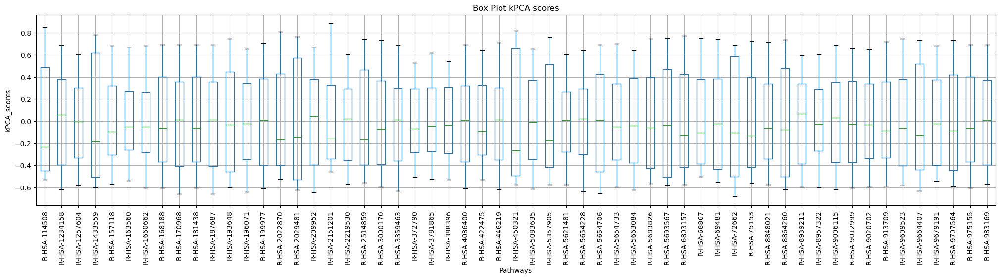

In [97]:
# Boxplot of kPCA using Pandas

plt.figure(figsize=(25,5))
filter.boxplot(rot=90)
plt.title("Box Plot kPCA scores")
plt.xlabel("Pathways")
plt.ylabel("kPCA_scores")

#plt.savefig('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Plots_COVID/kPCA_boxplot.png', dpi= 300, bbox_inches='tight')
plt.show()

/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


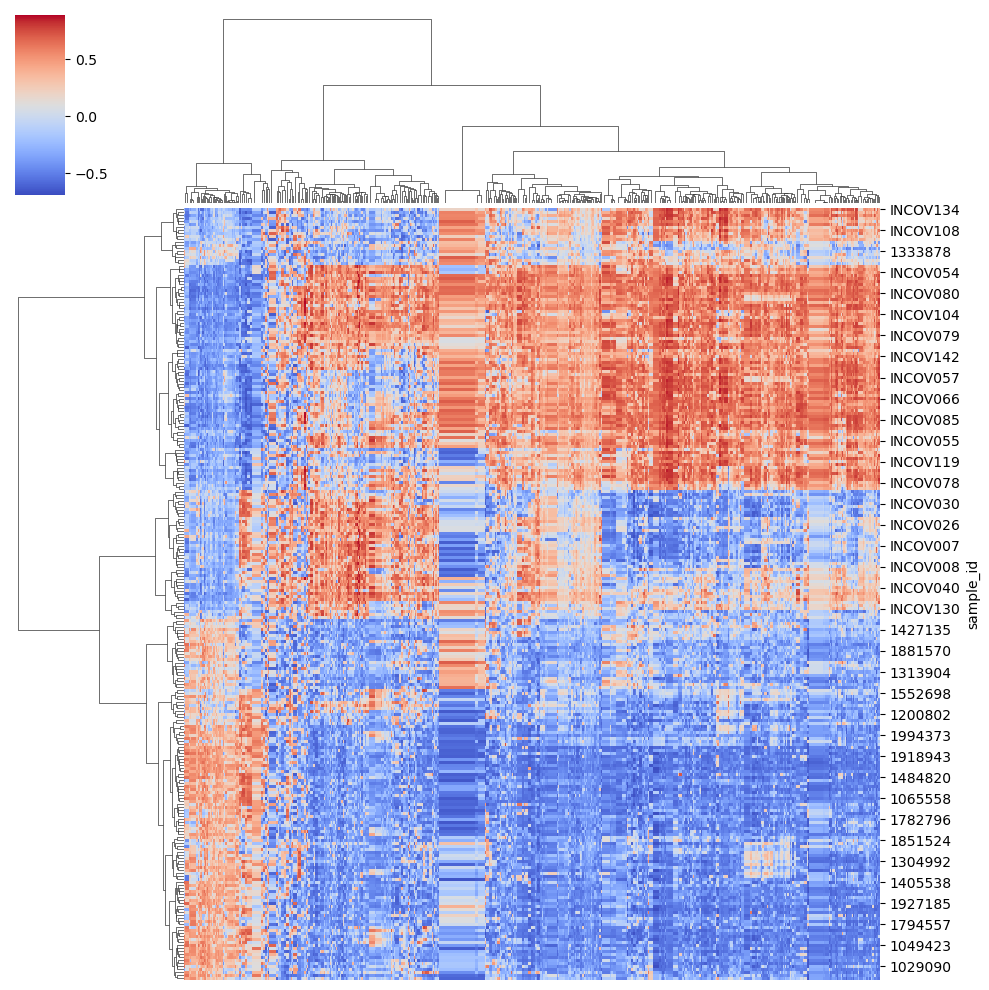

In [98]:
# Clustered heatmap

sns.clustermap(kpca_scores_meta.iloc[:,2:], cmap= "coolwarm", method = 'ward', xticklabels = False)


<Figure size 2000x1000 with 0 Axes>

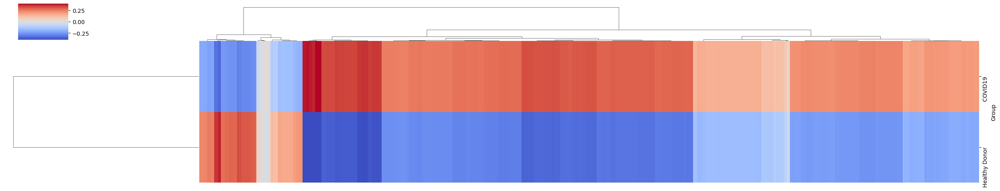

In [99]:
# Clustered heatmap by Group

plt.figure(figsize=(20,10))
sns.clustermap(kPCA_Group, cmap= "coolwarm", figsize = (25,5), vmin=-0.4, vmax=0.4,  method = 'ward', xticklabels = False)
#plt.savefig('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Plots_kPCA_COVID/clutstered_heatmap_group.png', dpi= 300, bbox_inches='tight')


<Figure size 3000x2000 with 0 Axes>

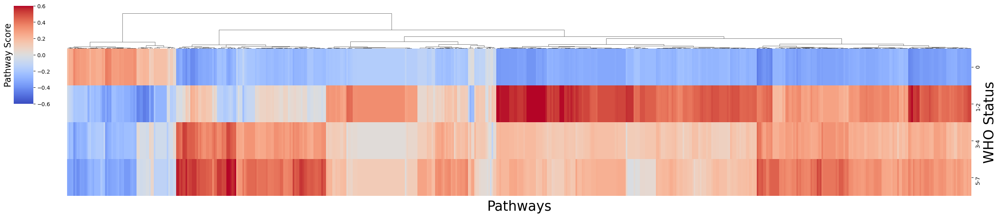

In [100]:
# Clustered heatmap by WHO status

plt.figure(figsize=(30,20))

g_pathway_who = sns.clustermap(kPCA_WHO_status, cmap= "coolwarm", figsize = (25, 5), vmin=-0.6, vmax=0.6, method = 'ward', xticklabels = False,  row_cluster=False,
    dendrogram_ratio=(0.05, .2), cbar_pos=(0, .5, .02, .5))
g_pathway_who.ax_cbar.set_ylabel("Pathway Score",size=16, labelpad=-85)
g_pathway_who.ax_heatmap.set_xlabel("Pathways", fontsize=25)
g_pathway_who.ax_heatmap.set_ylabel("WHO Status", fontsize=25)

plt.show()

In [101]:
# Indexing 
heatmap_index_pathway_who = g_pathway_who.dendrogram_col.reordered_ind[:]

# Making index
reactome_dict_heatmap = dict(zip(range(0,598), reactome_uniprot.index))
reactome_dict_heatmap

# Get the order of pathways
pathway_order = [reactome_dict_heatmap[i] for i in heatmap_index_pathway_who]

# List of proteins in order in a data frame
pathway_order_df = pd.DataFrame(pathway_order, columns= ["ID"])

#Add pathway name to the pathway ID
pathway_order_df["Pathway"] =  pathway_order_df["ID"].map(reactome_dict)

# Save to Excel
pathway_order_df.to_excel("who_status_clustermap_order_pathway.xlsx")
pathway_order_df



,ID,Pathway
0,R-HSA-156582,Acetylation
1,R-HSA-163358,PKA-mediated phosphorylation of key metabolic ...
2,R-HSA-112310,Neurotransmitter release cycle
3,R-HSA-1474165,Reproduction
4,R-HSA-1500931,Cell-Cell communication
...,...,...
568,R-HSA-156584,Cytosolic sulfonation of small molecules
569,R-HSA-1566977,Fibronectin matrix formation
570,R-HSA-190861,Gap junction assembly
571,R-HSA-1222556,ROS and RNS production in phagocytes


In [102]:
# PCA analysis

# To calculate PCA
from sklearn.decomposition import PCA
kPCA_pca = PCA(n_components=5).fit_transform(kPCA_names)
kPCA_pca

#Convert PCA from array into a dataframe
kPCA_pca_df = pd.DataFrame(data = kPCA_pca, columns = ['PC1', 'PC2', 'PC3','PC4', 'PC5'], index=kpca_scores_meta.index)
kPCA_pca_df


,PC1,PC2,PC3,PC4,PC5
sample_id,,,,,
1010823,-1.908566,-3.541265,-3.257296,-1.446316,-0.239586
1029090,-6.932614,-1.180530,-0.526158,-2.516856,0.428907
1049423,-9.855343,-0.089327,-0.088972,-0.418651,-0.391518
1057525,-8.730703,-2.230869,-1.631745,-0.445572,-0.297124
1065558,-10.594513,-0.472632,1.519044,0.705733,-0.765494
...,...,...,...,...,...
INCOV139,7.684496,0.023504,5.525371,-0.790137,-1.540364
INCOV141,8.970499,-3.999784,0.057252,2.112924,0.491939
INCOV142,8.852330,1.187271,-0.300474,3.118562,0.416147


In [103]:
# Add metadata back to PCA

kPCA_pca_merge_1 = pd.merge(kPCA_pca_df, kpca_scores_meta["Group"], right_index = True, left_index= True)
kPCA_pca_merge = pd.merge(kPCA_pca_merge_1, kpca_scores_meta["WHO_status"], right_index = True, left_index= True)
kPCA_pca_merge


,PC1,PC2,PC3,PC4,PC5,Group,WHO_status
sample_id,,,,,,,
1010823,-1.908566,-3.541265,-3.257296,-1.446316,-0.239586,Healthy Donor,0
1029090,-6.932614,-1.180530,-0.526158,-2.516856,0.428907,Healthy Donor,0
1049423,-9.855343,-0.089327,-0.088972,-0.418651,-0.391518,Healthy Donor,0
1057525,-8.730703,-2.230869,-1.631745,-0.445572,-0.297124,Healthy Donor,0
1065558,-10.594513,-0.472632,1.519044,0.705733,-0.765494,Healthy Donor,0
...,...,...,...,...,...,...,...
INCOV139,7.684496,0.023504,5.525371,-0.790137,-1.540364,COVID19,3-4
INCOV141,8.970499,-3.999784,0.057252,2.112924,0.491939,COVID19,1-2
INCOV142,8.852330,1.187271,-0.300474,3.118562,0.416147,COVID19,5-7


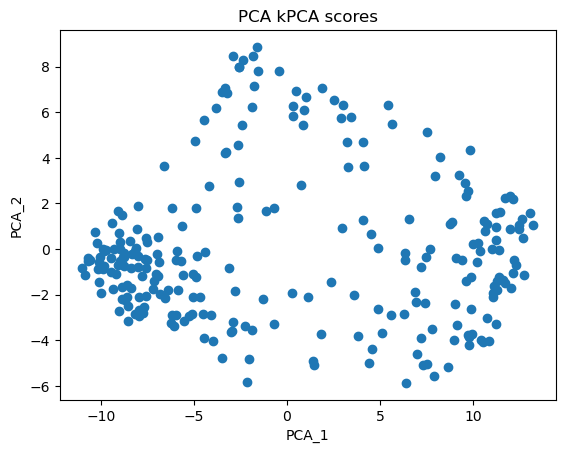

In [104]:
# Make scatter plot

plt.title("PCA kPCA scores")
plt.xlabel("PCA_1")
plt.ylabel("PCA_2")
plt.scatter(x=kPCA_pca_merge.PC1, y=kPCA_pca_merge.PC2)

<AxesSubplot:title={'center':'PCA kPCA scores'}, xlabel='PCA_1', ylabel='PCA_2'>

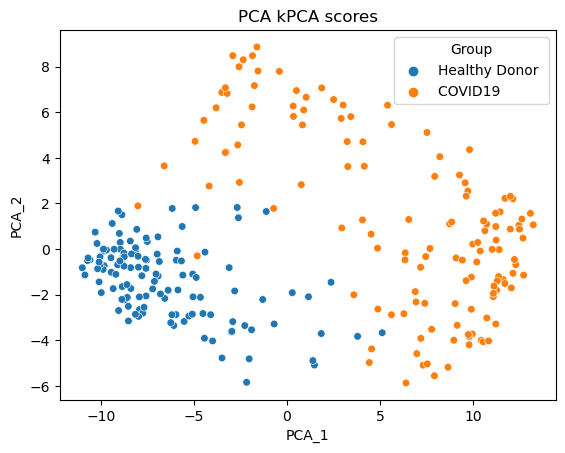

In [105]:
#PCA Group

plt.title("PCA kPCA scores")
plt.xlabel("PCA_1")
plt.ylabel("PCA_2")
sns.scatterplot(x=kPCA_pca[:, 0 ], y=kPCA_pca[:, 1], hue=kPCA_pca_merge["Group"], s=30)

<AxesSubplot:title={'center':'PCA kPCA scores'}, xlabel='PC1', ylabel='PC2'>

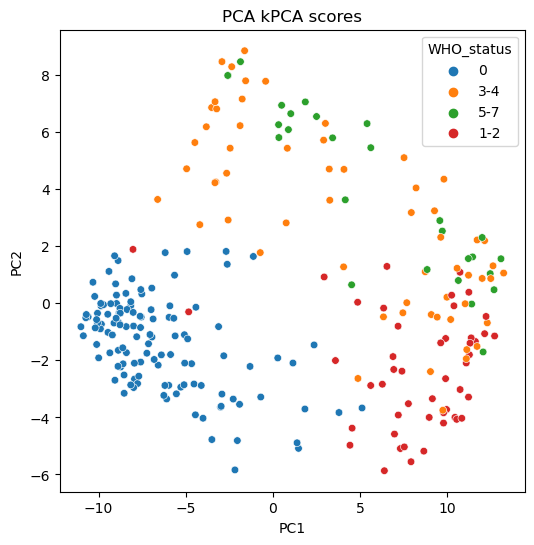

In [106]:
#PCA WHO Status
plt.figure(figsize=(6,6))
plt.title("PCA kPCA scores")
plt.xlabel("PC1")
plt.ylabel("PC2")
sns.scatterplot(x=kPCA_pca[:, 0 ], y=kPCA_pca[:, 1], hue=kPCA_pca_merge["WHO_status"], s=30)

In [107]:
# Calculate p-value

kPCA_ttest_pval = sspa.t_tests(kPCA_names,kpca_scores_meta["Group"],"fdr_bh")

#Sort by value
kPCA_ttest_pval = kPCA_ttest_pval.sort_values("P-adjust")
kPCA_ttest_pval

# make a new column using log10
kPCA_ttest_pval["-log10_P_adjusted"] = -np.log10(kPCA_ttest_pval["P-adjust"])
kPCA_ttest_pval

,Entity,P-value,P-adjust,-log10_P_adjusted
533,R-HSA-9664433,4.340982e-102,1.243691e-99,98.905287
527,R-HSA-9662851,4.340982e-102,1.243691e-99,98.905287
474,R-HSA-8978868,1.236471e-96,2.361660e-94,93.626783
178,R-HSA-2142753,6.608489e-93,9.466660e-91,90.023803
31,R-HSA-1280215,5.642942e-90,6.466811e-88,87.189310
...,...,...,...,...
357,R-HSA-5658442,5.119622e-01,5.155613e-01,0.287720
428,R-HSA-75108,6.313515e-01,6.346744e-01,0.197449
472,R-HSA-8963899,6.959049e-01,6.971216e-01,0.156691
471,R-HSA-8963889,6.959049e-01,6.971216e-01,0.156691


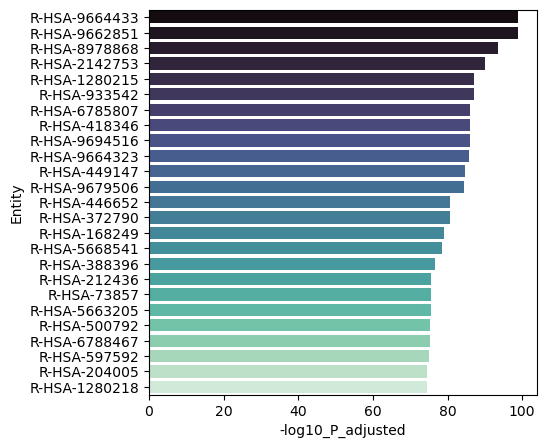

In [108]:
# View top 25 kPCA - P-adjusted 
kPCA_top_25_pathways = kPCA_ttest_pval.iloc[:25, :] #select the top 25 most significant pathways

plt.figure(figsize=(5, 5))
sns.barplot(data=kPCA_top_25_pathways, y="Entity", x="-log10_P_adjusted", orient="h", palette="mako")
plt.show()


# Calculating correlation scores and correlation pval

In [109]:
kPCA_names

,R-HSA-109581,R-HSA-109606,R-HSA-109704,R-HSA-110362,R-HSA-110373,R-HSA-111465,R-HSA-112314,R-HSA-112315,R-HSA-112399,R-HSA-114508,...,R-HSA-9758881,R-HSA-9759194,R-HSA-9772572,R-HSA-9772573,R-HSA-983168,R-HSA-983169,R-HSA-983231,R-HSA-983695,R-HSA-983705,Target
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,-0.032059,-0.211955,-0.327562,0.049359,0.049359,0.141269,-0.460049,-0.409174,-0.327562,-0.165081,...,0.078632,0.247628,-0.273294,-0.214313,-0.146975,-0.212929,-0.294839,0.184332,-0.024023,0
1029090,-0.199815,-0.333629,0.101999,-0.510433,-0.510433,-0.089141,-0.516720,-0.534277,0.101999,-0.460059,...,0.155778,0.063540,-0.114437,-0.319053,-0.448024,-0.512255,-0.504086,-0.522890,-0.430729,0
1049423,-0.553664,0.523944,0.097818,-0.508981,-0.508981,-0.513514,-0.543173,-0.560950,0.097818,-0.520982,...,0.677893,-0.490542,-0.495449,-0.501505,-0.511872,-0.492252,-0.556389,0.056385,-0.156212,0
1057525,-0.429940,-0.147421,0.120971,-0.403370,-0.403370,-0.475916,-0.541395,-0.533350,0.120971,-0.364895,...,-0.407620,-0.119335,-0.468034,-0.537365,-0.490824,-0.499926,-0.448103,-0.516311,-0.482990,0
1065558,-0.499792,0.662202,0.209682,-0.520688,-0.520688,-0.494941,-0.378345,-0.412406,0.209682,-0.511481,...,-0.388423,-0.547618,-0.241959,-0.419640,-0.540850,-0.473224,-0.514543,-0.498446,-0.533020,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,0.356256,-0.031794,-0.021092,0.234402,0.234402,0.282476,0.745239,0.717664,-0.021092,0.656921,...,-0.284981,0.574114,0.262427,0.564825,0.578648,0.297682,0.340321,0.631290,0.600646,1
INCOV141,0.448792,-0.506748,-0.476594,0.350158,0.350158,0.758998,0.646614,0.676666,-0.476594,0.849130,...,-0.505831,0.634184,-0.376497,0.466782,0.472867,0.327867,0.805540,0.699063,0.576791,1
INCOV142,0.344616,-0.096260,-0.156027,0.654677,0.654677,0.606634,0.500648,0.569463,-0.156027,0.786014,...,0.276422,0.248678,0.334217,0.424065,0.628359,0.460514,0.661202,0.594364,0.527780,1


In [110]:
# Remove target
kPCA_names = kPCA_names.iloc[:,:-1]
kPCA_names

,R-HSA-109581,R-HSA-109606,R-HSA-109704,R-HSA-110362,R-HSA-110373,R-HSA-111465,R-HSA-112314,R-HSA-112315,R-HSA-112399,R-HSA-114508,...,R-HSA-975871,R-HSA-9758881,R-HSA-9759194,R-HSA-9772572,R-HSA-9772573,R-HSA-983168,R-HSA-983169,R-HSA-983231,R-HSA-983695,R-HSA-983705
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,-0.032059,-0.211955,-0.327562,0.049359,0.049359,0.141269,-0.460049,-0.409174,-0.327562,-0.165081,...,0.016476,0.078632,0.247628,-0.273294,-0.214313,-0.146975,-0.212929,-0.294839,0.184332,-0.024023
1029090,-0.199815,-0.333629,0.101999,-0.510433,-0.510433,-0.089141,-0.516720,-0.534277,0.101999,-0.460059,...,-0.278400,0.155778,0.063540,-0.114437,-0.319053,-0.448024,-0.512255,-0.504086,-0.522890,-0.430729
1049423,-0.553664,0.523944,0.097818,-0.508981,-0.508981,-0.513514,-0.543173,-0.560950,0.097818,-0.520982,...,-0.551378,0.677893,-0.490542,-0.495449,-0.501505,-0.511872,-0.492252,-0.556389,0.056385,-0.156212
1057525,-0.429940,-0.147421,0.120971,-0.403370,-0.403370,-0.475916,-0.541395,-0.533350,0.120971,-0.364895,...,-0.431225,-0.407620,-0.119335,-0.468034,-0.537365,-0.490824,-0.499926,-0.448103,-0.516311,-0.482990
1065558,-0.499792,0.662202,0.209682,-0.520688,-0.520688,-0.494941,-0.378345,-0.412406,0.209682,-0.511481,...,-0.527689,-0.388423,-0.547618,-0.241959,-0.419640,-0.540850,-0.473224,-0.514543,-0.498446,-0.533020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,0.356256,-0.031794,-0.021092,0.234402,0.234402,0.282476,0.745239,0.717664,-0.021092,0.656921,...,0.184527,-0.284981,0.574114,0.262427,0.564825,0.578648,0.297682,0.340321,0.631290,0.600646
INCOV141,0.448792,-0.506748,-0.476594,0.350158,0.350158,0.758998,0.646614,0.676666,-0.476594,0.849130,...,0.557714,-0.505831,0.634184,-0.376497,0.466782,0.472867,0.327867,0.805540,0.699063,0.576791
INCOV142,0.344616,-0.096260,-0.156027,0.654677,0.654677,0.606634,0.500648,0.569463,-0.156027,0.786014,...,0.394834,0.276422,0.248678,0.334217,0.424065,0.628359,0.460514,0.661202,0.594364,0.527780


In [111]:
print("Number of unquie nodes", len(set(kPCA_names)))

Number of unquie nodes 573


In [112]:
# Calculate correlation between pathways

kpca_scores_corr = kPCA_names.corr(method='spearman')
kpca_scores_corr

,R-HSA-109581,R-HSA-109606,R-HSA-109704,R-HSA-110362,R-HSA-110373,R-HSA-111465,R-HSA-112314,R-HSA-112315,R-HSA-112399,R-HSA-114508,...,R-HSA-975871,R-HSA-9758881,R-HSA-9759194,R-HSA-9772572,R-HSA-9772573,R-HSA-983168,R-HSA-983169,R-HSA-983231,R-HSA-983695,R-HSA-983705
R-HSA-109581,1.000000,-0.605776,-0.650287,0.661173,0.661173,0.898035,0.753518,0.779110,-0.650287,0.742959,...,0.888188,0.211206,0.864432,0.593217,0.860405,0.860805,0.869756,0.835720,0.788021,0.838972
R-HSA-109606,-0.605776,1.000000,0.567167,-0.517821,-0.517821,-0.719860,-0.582220,-0.611743,0.567167,-0.651228,...,-0.623047,-0.028306,-0.599734,-0.108486,-0.517329,-0.527116,-0.489275,-0.519332,-0.517642,-0.561226
R-HSA-109704,-0.650287,0.567167,1.000000,-0.450627,-0.450627,-0.629372,-0.600031,-0.620578,1.000000,-0.640693,...,-0.638352,-0.155062,-0.616469,-0.357448,-0.618395,-0.585468,-0.572233,-0.607833,-0.588084,-0.623075
R-HSA-110362,0.661173,-0.517821,-0.450627,1.000000,1.000000,0.636641,0.503183,0.556007,-0.450627,0.527584,...,0.677487,0.309761,0.698010,0.605118,0.668335,0.716732,0.738545,0.669443,0.629322,0.644836
R-HSA-110373,0.661173,-0.517821,-0.450627,1.000000,1.000000,0.636641,0.503183,0.556007,-0.450627,0.527584,...,0.677487,0.309761,0.698010,0.605118,0.668335,0.716732,0.738545,0.669443,0.629322,0.644836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R-HSA-983168,0.860805,-0.527116,-0.585468,0.716732,0.716732,0.768528,0.673451,0.713207,-0.585468,0.689819,...,0.817524,0.292572,0.887982,0.629780,0.806801,1.000000,0.938905,0.819869,0.755283,0.856334
R-HSA-983169,0.869756,-0.489275,-0.572233,0.738545,0.738545,0.767201,0.694280,0.751452,-0.572233,0.671925,...,0.852927,0.294170,0.850405,0.715149,0.830494,0.938905,1.000000,0.874306,0.816762,0.880218
R-HSA-983231,0.835720,-0.519332,-0.607833,0.669443,0.669443,0.807094,0.769999,0.808663,-0.607833,0.732663,...,0.860946,0.178114,0.795641,0.592890,0.832476,0.819869,0.874306,1.000000,0.801577,0.828619
R-HSA-983695,0.788021,-0.517642,-0.588084,0.629322,0.629322,0.723992,0.720067,0.780233,-0.588084,0.657804,...,0.791091,0.223386,0.702365,0.549901,0.772108,0.755283,0.816762,0.801577,1.000000,0.894221


In [113]:
# Calculate p-value for correlation 

correlation_t_test, pval = stats.spearmanr(kPCA_names, axis=0, nan_policy='propagate', alternative='two-sided')

#Put into a dataframe and pval
correlation_t_test = pd.DataFrame(correlation_t_test, columns = kpca_scores_corr.columns, index=kpca_scores_corr.index)
pval_corr = pd.DataFrame(pval, columns = kpca_scores_corr.columns, index=kpca_scores_corr.index)


In [114]:
573 * 573

328329

In [115]:
#Transform into a links data frame
pval_corr_list = pval_corr.stack().reset_index()
pval_corr_list.columns = ["Pathway_1", "Pathway_2", "p_val"]
pval_corr_list


,Pathway_1,Pathway_2,p_val
0,R-HSA-109581,R-HSA-109581,0.000000e+00
1,R-HSA-109581,R-HSA-109606,3.936819e-27
2,R-HSA-109581,R-HSA-109704,2.785881e-32
3,R-HSA-109581,R-HSA-110362,1.124205e-33
4,R-HSA-109581,R-HSA-110373,1.124205e-33
...,...,...,...
328324,R-HSA-983705,R-HSA-983168,3.814034e-75
328325,R-HSA-983705,R-HSA-983169,1.620453e-84
328326,R-HSA-983705,R-HSA-983231,3.388655e-66
328327,R-HSA-983705,R-HSA-983695,5.369575e-91


In [116]:
#Transform into a links data frame
corr = correlation_t_test.stack().reset_index()
corr.columns = ["Pathway_1", "Pathway_2", "Correlation"]
corr["Correlation_abs"]=abs(corr["Correlation"])
corr


,Pathway_1,Pathway_2,Correlation,Correlation_abs
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000
1,R-HSA-109581,R-HSA-109606,-0.605776,0.605776
2,R-HSA-109581,R-HSA-109704,-0.650287,0.650287
3,R-HSA-109581,R-HSA-110362,0.661173,0.661173
4,R-HSA-109581,R-HSA-110373,0.661173,0.661173
...,...,...,...,...
328324,R-HSA-983705,R-HSA-983168,0.856334,0.856334
328325,R-HSA-983705,R-HSA-983169,0.880218,0.880218
328326,R-HSA-983705,R-HSA-983231,0.828619,0.828619
328327,R-HSA-983705,R-HSA-983695,0.894221,0.894221


Text(0.5, 1.0, 'KPCA Correlation Distribution')

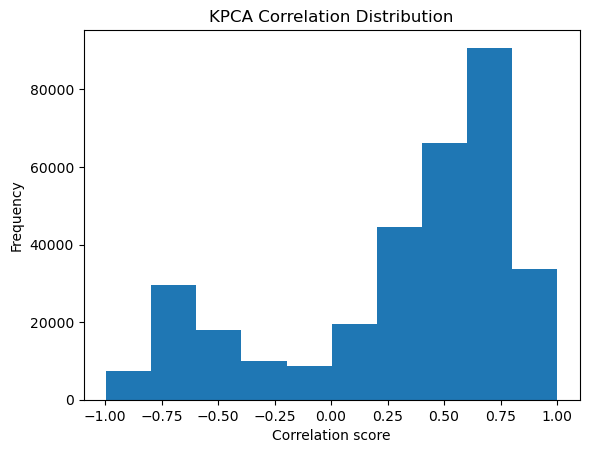

In [117]:
# Look at correlation of distribtuion
plt.hist(x=corr["Correlation"])
plt.xlabel('Correlation score')
plt.ylabel('Frequency')
plt.title('KPCA Correlation Distribution')

Text(0, 0.5, 'Frequency')

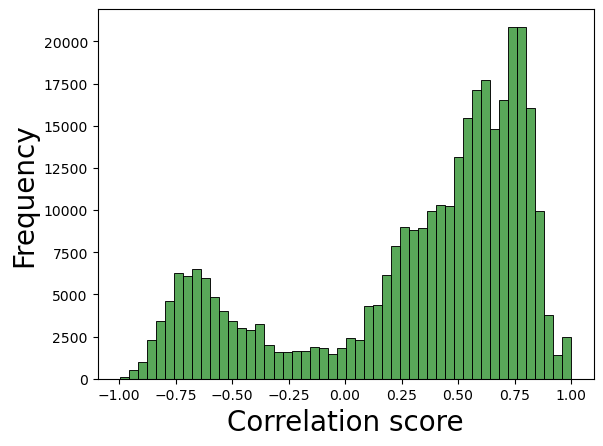

In [118]:
sns.histplot(data=corr["Correlation"], bins=50, legend = False, color = 'forestgreen')
plt.xlabel('Correlation score', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
#plt.title('Protein kPCA Correlation Distribution')

/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


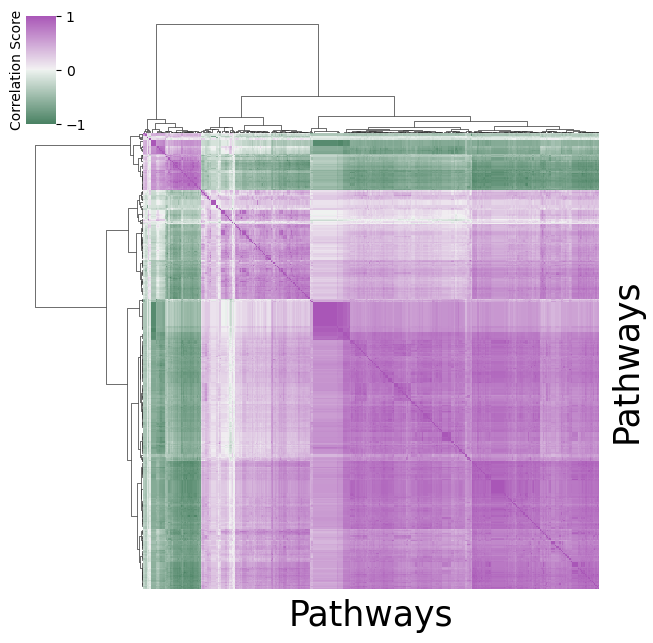

In [119]:
# Clusterheat map of correlation
color = sns.diverging_palette(145, 300, s=60, as_cmap=True)
g_pathway_who = sns.clustermap(correlation_t_test, cmap= color, figsize = (6, 6), vmin=-1, vmax=1, method = 'ward', xticklabels = False,  yticklabels = False)
g_pathway_who.ax_cbar.set_ylabel("Correlation Score",size=10, labelpad=-55)
g_pathway_who.ax_heatmap.set_xlabel("Pathways", fontsize=25)
g_pathway_who.ax_heatmap.set_ylabel("Pathways", fontsize=25)


plt.show()

In [120]:
# Do multi testing corrections - calculate bonferroni p val

pvals_corrected_stats = statsmodels.stats.multitest.multipletests(pval_corr_list["p_val"], alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)
reject = pvals_corrected_stats[0]
pvals_corrected = pvals_corrected_stats[1]
alphacBonf = pvals_corrected_stats[2]

# Put p value into a dataframe
pvals_corrected_df = pd.DataFrame(pvals_corrected, columns = ["p_val_adjust"])

# Merge dataframes
kpca_scores_corr_pval = corr.merge(pval_corr_list["p_val"], right_index= True, left_index = True)
kpca_scores_corr_pval = kpca_scores_corr_pval.merge(pvals_corrected_df["p_val_adjust"], right_index= True, left_index = True)
kpca_scores_corr_pval

,Pathway_1,Pathway_2,Correlation,Correlation_abs,p_val,p_val_adjust
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000,0.000000e+00,0.000000e+00
1,R-HSA-109581,R-HSA-109606,-0.605776,0.605776,3.936819e-27,1.292572e-21
2,R-HSA-109581,R-HSA-109704,-0.650287,0.650287,2.785881e-32,9.146854e-27
3,R-HSA-109581,R-HSA-110362,0.661173,0.661173,1.124205e-33,3.691090e-28
4,R-HSA-109581,R-HSA-110373,0.661173,0.661173,1.124205e-33,3.691090e-28
...,...,...,...,...,...,...
328324,R-HSA-983705,R-HSA-983168,0.856334,0.856334,3.814034e-75,1.252258e-69
328325,R-HSA-983705,R-HSA-983169,0.880218,0.880218,1.620453e-84,5.320418e-79
328326,R-HSA-983705,R-HSA-983231,0.828619,0.828619,3.388655e-66,1.112594e-60
328327,R-HSA-983705,R-HSA-983695,0.894221,0.894221,5.369575e-91,1.762987e-85


In [121]:
# Transform to log10

kpca_scores_corr_pval["log10_p_val_adjusted"]= -np.log10(kpca_scores_corr_pval["p_val_adjust"])
kpca_scores_corr_pval

/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Pathway_1,Pathway_2,Correlation,Correlation_abs,p_val,p_val_adjust,log10_p_val_adjusted
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000,0.000000e+00,0.000000e+00,inf
1,R-HSA-109581,R-HSA-109606,-0.605776,0.605776,3.936819e-27,1.292572e-21,20.888545
2,R-HSA-109581,R-HSA-109704,-0.650287,0.650287,2.785881e-32,9.146854e-27,26.038728
3,R-HSA-109581,R-HSA-110362,0.661173,0.661173,1.124205e-33,3.691090e-28,27.432845
4,R-HSA-109581,R-HSA-110373,0.661173,0.661173,1.124205e-33,3.691090e-28,27.432845
...,...,...,...,...,...,...,...
328324,R-HSA-983705,R-HSA-983168,0.856334,0.856334,3.814034e-75,1.252258e-69,68.902306
328325,R-HSA-983705,R-HSA-983169,0.880218,0.880218,1.620453e-84,5.320418e-79,78.274054
328326,R-HSA-983705,R-HSA-983231,0.828619,0.828619,3.388655e-66,1.112594e-60,59.953663
328327,R-HSA-983705,R-HSA-983695,0.894221,0.894221,5.369575e-91,1.762987e-85,84.753751


Text(0.5, 1.0, 'KPCA Correlation -Log10(p_val_adjust) Distribution')

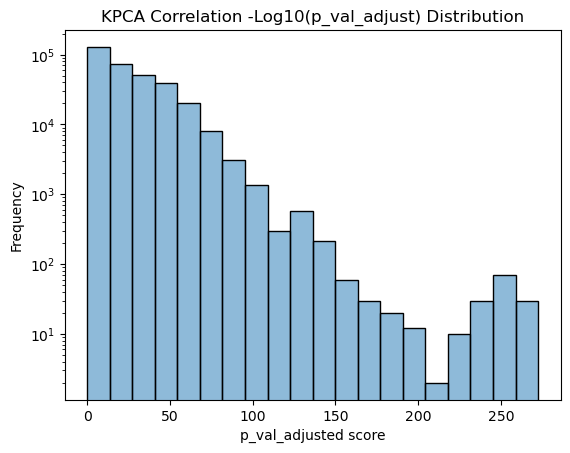

In [122]:
# Look at pval distribution

sns.histplot(data=kpca_scores_corr_pval["log10_p_val_adjusted"], bins = 20, legend = False, alpha = 0.5)
plt.yscale('log') # will ut the axis on a log scale
plt.xlabel('p_val_adjusted score')
plt.ylabel('Frequency')
plt.title('KPCA Correlation -Log10(p_val_adjust) Distribution')

In [123]:
# Sort by adjusted p value

kpca_scores_corr_pval_sort = kpca_scores_corr_pval.sort_values(by = ["p_val_adjust"])
kpca_scores_corr_pval_sort

,Pathway_1,Pathway_2,Correlation,Correlation_abs,p_val,p_val_adjust,log10_p_val_adjusted
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000,0.000000,0.0,inf
93159,R-HSA-2033519,R-HSA-5654693,1.000000,1.000000,0.000000,0.0,inf
93160,R-HSA-2033519,R-HSA-5654695,1.000000,1.000000,0.000000,0.0,inf
93161,R-HSA-2033519,R-HSA-5654696,1.000000,1.000000,0.000000,0.0,inf
93162,R-HSA-2033519,R-HSA-5654699,1.000000,1.000000,0.000000,0.0,inf
...,...,...,...,...,...,...,...
204695,R-HSA-5658442,R-HSA-196854,-0.090006,0.090006,0.150209,1.0,-0.0
204694,R-HSA-5658442,R-HSA-196849,0.025837,0.025837,0.680159,1.0,-0.0
204693,R-HSA-5658442,R-HSA-196741,0.045549,0.045549,0.467207,1.0,-0.0
280510,R-HSA-9012999,R-HSA-5576891,0.040415,0.040415,0.518924,1.0,-0.0


# Structuring correlations

In [124]:
#Transform into a links data frame
links = kpca_scores_corr.stack().reset_index()
links.columns = ["Pathway_1", "Pathway_2", "Correlation"]
links["Correlation_abs"]=abs(corr["Correlation"])
links

,Pathway_1,Pathway_2,Correlation,Correlation_abs
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000
1,R-HSA-109581,R-HSA-109606,-0.605776,0.605776
2,R-HSA-109581,R-HSA-109704,-0.650287,0.650287
3,R-HSA-109581,R-HSA-110362,0.661173,0.661173
4,R-HSA-109581,R-HSA-110373,0.661173,0.661173
...,...,...,...,...
328324,R-HSA-983705,R-HSA-983168,0.856334,0.856334
328325,R-HSA-983705,R-HSA-983169,0.880218,0.880218
328326,R-HSA-983705,R-HSA-983231,0.828619,0.828619
328327,R-HSA-983705,R-HSA-983695,0.894221,0.894221


 # Making the Networks using NetworkX


Netowrk for protein all with filter of p < 0.005

In [125]:
corr_threshold = kpca_scores_corr_pval_sort.loc[
    (kpca_scores_corr_pval_sort["p_val_adjust"] <= 0.05) & (kpca_scores_corr_pval_sort["Pathway_1"] != kpca_scores_corr_pval_sort["Pathway_2"])]

Text(0.5, 1.0, 'Proteomics Network (COVID + Healthy) Correlation_abs with pval <= 0.005')

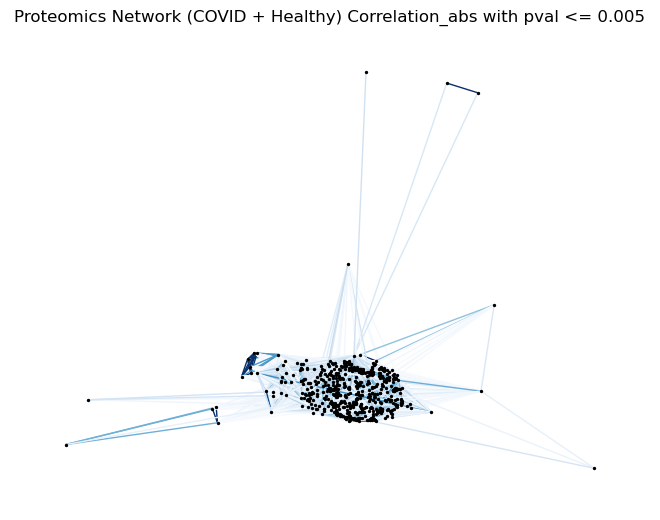

In [126]:
# Create an empty graph structure (a “null graph”) with no nodes and no edges
G_all_corr_thres = nx.Graph()

#Add the nodes from any container (a list, dict, set or even the lines from a file or the nodes from another graph)

# What is happening with my network? Why does it change when I add nodes or not?
#G.add_nodes_from(kpca_scores_stats.columns)
G_all_corr_thres=nx.from_pandas_edgelist(corr_threshold, 'Pathway_1', 'Pathway_2', edge_attr= "Correlation_abs")

weight_corr = [i['Correlation_abs'] for i in dict(G_all_corr_thres.edges).values()]

nx.draw(G_all_corr_thres, with_labels=False, node_color='black', node_size=2, edge_color=weight_corr, font_size=5, edge_cmap=plt.cm.Blues)
plt.title('Proteomics Network (COVID + Healthy) Correlation_abs with pval <= 0.005')

In [127]:
# Statistics of correlation all data : G_all_corr_thres
degree_centrality = nx.degree_centrality(G_all_corr_thres) # Compute the degree centrality for nodes.

betweenness_centrality = nx.betweenness_centrality(G_all_corr_thres, normalized = True)

clustering = nx.clustering(G_all_corr_thres) # Compute the clustering coefficent for nodes

density = nx.density(G_all_corr_thres) # Calculte how dense the graph is
print("Graph density:", density)

number_of_nodes_thres = G_all_corr_thres.number_of_nodes()
print("Number of nodes:", number_of_nodes_thres)


Graph density: 0.824568601276132
Number of nodes: 572


# Making Correlation for Healthy and COVID groups individually

In [128]:
# Calculate Correlations - spearman
kpca_scores_corr_healthy = kPCA_healthy.corr(method='spearman')
kpca_scores_corr_COVID19 = kPCA_COVID19.corr(method='spearman')

In [129]:
# Calculate p-value for correlation - spearman and p-val

kPCA_health_no_meta = kPCA_healthy.iloc[:,2:]
kPCA_COVID19_no_meta= kPCA_COVID19.iloc[:,2:]

correlation_t_test_healthy, pval_healthy = stats.spearmanr(kPCA_health_no_meta, axis=0, alternative='two-sided')
correlation_t_test_COVID19, pval_COVID19 = stats.spearmanr(kPCA_COVID19_no_meta, axis=0, alternative='two-sided')

In [130]:
#Put into a dataframe and pval
correlation_t_test_healthy = pd.DataFrame(correlation_t_test_healthy, columns = kPCA_health_no_meta.columns, index=kPCA_health_no_meta.columns)
pval_corr_healthy = pd.DataFrame(pval_healthy, columns = kPCA_health_no_meta.columns, index=kPCA_health_no_meta.columns)

correlation_t_test_COVID19 = pd.DataFrame(correlation_t_test_COVID19, columns = kPCA_COVID19_no_meta.columns, index=kPCA_COVID19_no_meta.columns)
pval_corr_COVID19 = pd.DataFrame(pval_COVID19, columns = kPCA_COVID19_no_meta.columns, index=kPCA_COVID19_no_meta.columns)

In [131]:
# Transform into stacked list

## Correlation
# Healthy
links_healthy_updated = correlation_t_test_healthy.stack().reset_index()
links_healthy_updated.columns = ["Pathway_1", "Pathway_2", "Correlation"]

#COVID19
links_COVID19_updated = correlation_t_test_COVID19.stack().reset_index()
links_COVID19_updated.columns = ["Pathway_1", "Pathway_2", "Correlation"]


In [132]:

## p-val
# Healthy
pval_corr_list_healthy = pval_corr_healthy.stack().reset_index()
pval_corr_list_healthy.columns = ["Pathway_1", "Pathway_2", "p_val"]

# COVID19
pval_corr_list_COVID19 = pval_corr_COVID19.stack().reset_index()
pval_corr_list_COVID19.columns = ["Pathway_1", "Pathway_2", "p_val"]


In [133]:
# Do multi testing corrections - calculate bonferroni p val

## Healthy
pvals_corrected_stats_healthy = statsmodels.stats.multitest.multipletests(
    pval_corr_list_healthy["p_val"], alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)

reject_h = pvals_corrected_stats_healthy[0]
pvals_corrected_h = pvals_corrected_stats_healthy[1]
alphacBonf_h = pvals_corrected_stats_healthy[2]

# Put p value into a dataframe
pvals_corrected_healthy_df = pd.DataFrame(pvals_corrected_h, columns = ["p_val_adjust"])

In [134]:
# Do multi testing corrections - calculate bonferroni p val

## COVID19
pvals_corrected_stats_COVID19 = statsmodels.stats.multitest.multipletests(
    pval_corr_list_COVID19["p_val"], alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)

reject_c = pvals_corrected_stats_COVID19[0]
pvals_corrected_c = pvals_corrected_stats_COVID19[1]
alphacBonf_c = pvals_corrected_stats_COVID19[2]

# Put p value into a dataframe
pvals_corrected_COVID19_df = pd.DataFrame(pvals_corrected_c, columns = ["p_val_adjust"])

In [135]:
# Healthy and COVID dataframe

# Merge dataframes

## Healthy

kpca_scores_corr_pval_healthy = links_healthy_updated.merge(pval_corr_list_healthy["p_val"], right_index= True, left_index = True)
kpca_scores_corr_pval_healthy = kpca_scores_corr_pval_healthy.merge(pvals_corrected_healthy_df["p_val_adjust"], right_index= True, left_index = True)
kpca_scores_corr_pval_healthy = kpca_scores_corr_pval_healthy.sort_values(by="p_val_adjust")
kpca_scores_corr_pval_healthy["Correlation_abs"] = kpca_scores_corr_pval_healthy["Correlation"].abs()
#Reorder data frame
kpca_scores_corr_pval_healthy = kpca_scores_corr_pval_healthy[["Pathway_1", "Pathway_2", "Correlation", "Correlation_abs", "p_val", "p_val_adjust"]]

## COVID19
kpca_scores_corr_pval_COVID19 = links_COVID19_updated.merge(pval_corr_list_COVID19["p_val"], right_index= True, left_index= True)
kpca_scores_corr_pval_COVID19 = kpca_scores_corr_pval_COVID19.merge(pvals_corrected_COVID19_df["p_val_adjust"], right_index = True, left_index = True)
kpca_scores_corr_pval_COVID19 = kpca_scores_corr_pval_COVID19.sort_values(by= "p_val_adjust")
kpca_scores_corr_pval_COVID19["Correlation_abs"] = kpca_scores_corr_pval_COVID19["Correlation"].abs()
#Reorder data frame
kpca_scores_corr_pval_COVID19 = kpca_scores_corr_pval_COVID19[["Pathway_1", "Pathway_2", "Correlation", "Correlation_abs", "p_val", "p_val_adjust"]]

## ADJUSTED PVALUES ARE SMALLER RATHER THAN BIGGER
kpca_scores_corr_pval_COVID19


,Pathway_1,Pathway_2,Correlation,Correlation_abs,p_val,p_val_adjust
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000,0.000000,0.0
93159,R-HSA-2033519,R-HSA-5654693,1.000000,1.000000,0.000000,0.0
93160,R-HSA-2033519,R-HSA-5654695,1.000000,1.000000,0.000000,0.0
93161,R-HSA-2033519,R-HSA-5654696,1.000000,1.000000,0.000000,0.0
93162,R-HSA-2033519,R-HSA-5654699,1.000000,1.000000,0.000000,0.0
...,...,...,...,...,...,...
193565,R-HSA-5654700,R-HSA-8950505,-0.353588,0.353588,0.000028,1.0
193567,R-HSA-5654700,R-HSA-8956319,-0.020247,0.020247,0.816378,1.0
193568,R-HSA-5654700,R-HSA-8956321,0.168354,0.168354,0.051838,1.0
77030,R-HSA-196854,R-HSA-3858494,-0.088567,0.088567,0.308851,1.0


In [136]:
#Transform into a links data frame
# Keep only correlations where adjusted P value is >0.05 

# Healthy
corr_threshold_healthy = kpca_scores_corr_pval_healthy.loc[
    (kpca_scores_corr_pval_healthy["p_val_adjust"] <= 0.05) & (kpca_scores_corr_pval_healthy["Pathway_1"] != kpca_scores_corr_pval_healthy["Pathway_2"])]
corr_threshold_healthy

# COVID19

corr_threshold_COVID19 = kpca_scores_corr_pval_COVID19.loc[
    (kpca_scores_corr_pval_COVID19["p_val_adjust"] <= 0.05) & (kpca_scores_corr_pval_COVID19["Pathway_1"] != kpca_scores_corr_pval_COVID19["Pathway_2"])]

print(len(corr_threshold_COVID19))
print(len(corr_threshold_healthy))

##set off p_val not adjusted pval because something is wrong with the multiple testing

158964
51552


array([[<AxesSubplot:title={'center':'Correlation'}>,
        <AxesSubplot:title={'center':'Correlation_abs'}>],
       [<AxesSubplot:title={'center':'p_val'}>,
        <AxesSubplot:title={'center':'p_val_adjust'}>]], dtype=object)

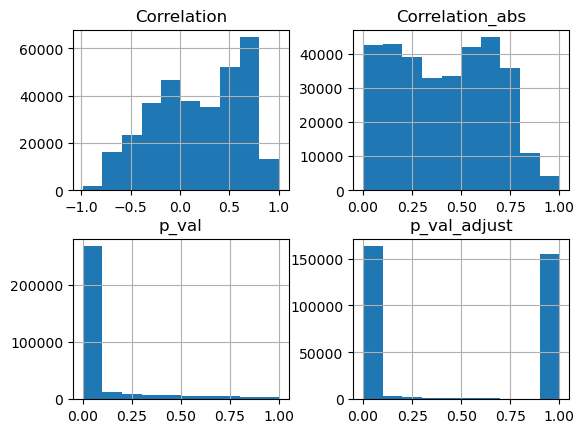

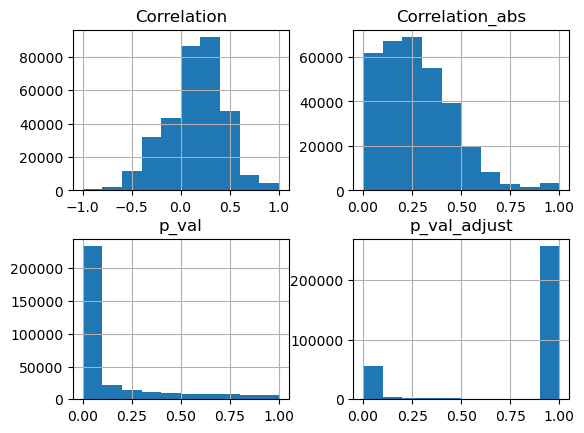

In [137]:
# Look at distribution of the data

kpca_scores_corr_pval_COVID19.hist()
kpca_scores_corr_pval_healthy.hist()

Text(0.5, 1.0, 'Proteomics Network (Healthy) Correlation_abs with pval <= 0.005')

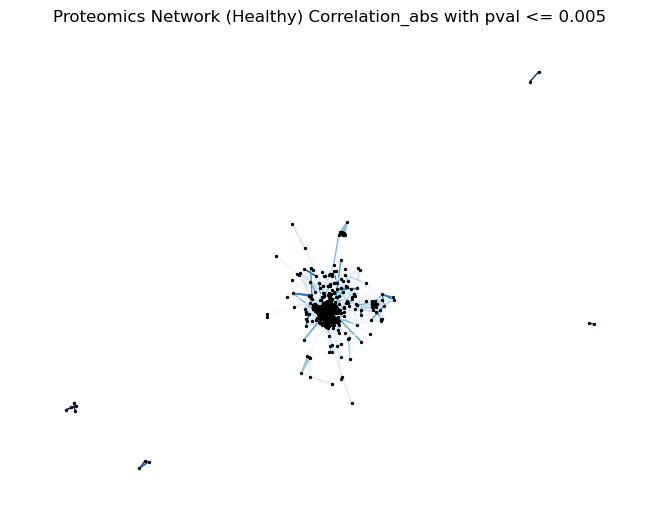

In [138]:

#Add the nodes from any container (a list, dict, set or even the lines from a file or the nodes from another graph)

# What is happening with my network? Why does it change when I add nodes or not?
#G.add_nodes_from(kpca_scores_stats.columns)
G_healthy=nx.from_pandas_edgelist(corr_threshold_healthy, 'Pathway_1', 'Pathway_2', edge_attr= "Correlation_abs")

weight_corr = [i['Correlation_abs'] for i in dict(G_healthy.edges).values()]

nx.draw(G_healthy, with_labels=False, node_color='black', node_size=2, edge_color=weight_corr, font_size=5, edge_cmap=plt.cm.Blues)
plt.title('Proteomics Network (Healthy) Correlation_abs with pval <= 0.005')

#Add the nodes from any container (a list, dict, set or even the lines from a file or the nodes from another graph)

# What is happening with my network? Why does it change when I add nodes or not?
#G.add_nodes_from(kpca_scores_stats.columns)
G_COVID19=nx.from_pandas_edgelist(corr_threshold_COVID19, 'Pathway_1', 'Pathway_2', edge_attr= "Correlation_abs")

weight_corr = [i['Correlation_abs'] for i in dict(G_COVID19.edges).values()]

nx.draw(G_COVID19, with_labels=False, node_color='black', node_size=2, edge_color=weight_corr, font_size=5, edge_cmap=plt.cm.Blues)
plt.title('Proteomics Network (COVID19) Correlation_abs with pval <= 0.005')

# Understanding Coverage - Proteins pathways

In [139]:
# Make dictionary of the pathway and all the proteins that define that pathway using uniport IDs
reactome_dict_proteins = sspa.utils.pathwaydf_to_dict(reactome_uniprot)
len(reactome_dict_proteins) # put in dictionry because you can calculate more easily 

2320

In [140]:
# Remove group and who status
uniport_proteomic_IDs = uniport_proteomic.iloc[:,2:]

In [141]:
# Computing coverage - which proteins are in the dataset
compounds_present = uniport_proteomic_IDs.columns.tolist() #proteins from oringal data set, using uniport IDs
# uniport gives you protein IDs
print("Number of proteins in the dataset" , len(compounds_present))

Number of proteins in the dataset 454


In [142]:
# Proteins in any given pathway 
pathways_present = {k: v for k, v in reactome_dict_proteins.items() if len([i for i in compounds_present if i in v]) >= 2} # out of the entire reactome, only keeping pathways where we have 2+ proteins
print(len(pathways_present)) #tells you how many pathways you have

pathways_present = pd.Series(pathways_present) # Need to put into a series first
pathways_present_df = pd.DataFrame(pathways_present, columns = ['All_proteins_in_path']) # put into a dataframe
pathways_present_df.index.name = "Pathways" # Set the name of a pathway


598


In [143]:
# Make a dictionary out of the pathways that are in the dataset with pathway names as keys and proteins present as values
pathway_dictionary = pathways_present.to_dict()

In [144]:
# Number of proteins per pathway 
pathways_present_num = {}
for key, values in pathways_present.items():
        pathways_present_num[key] = len(values)

pathways_present_num_df = pd.Series(pathways_present_num) # put into a series
pathways_present_num_df = pd.DataFrame(pathways_present_num_df, columns = ['Number_of_proteins']) # put into a dataframe
pathways_present_num_df["Number_of_proteins_Log_10"] = np.log10(pathways_present_num_df["Number_of_proteins"])
pathways_present_num_df.index.name = "Pathways" # Set the name of a pathway
reactome_dict_proteins


{'R-HSA-1059683': ['P40189',
  'P08887',
  'P08887-2',
  'P42224-1',
  'P29597',
  'O14543',
  'P23458',
  'P05231',
  'P40189-1',
  'P22681',
  'P42224',
  'Q06124',
  'O60674',
  'P40189-2',
  'P40763'],
 'R-HSA-109581': ['P43146',
  'P28070',
  'P27348',
  'O00233',
  'O43293',
  'Q05655',
  'P42574',
  'Q07021',
  'Q9HAW4',
  'Q14974',
  'P51813',
  'P20700',
  'P40763',
  'Q86XR7',
  'Q6ZN44',
  'O00220',
  'Q13158',
  'Q96KQ4',
  'O15519-1',
  'Q07812',
  'Q13546',
  'P02545-1',
  'P61981',
  'O43521',
  'P07305',
  'P63167',
  'P35611',
  'P55957',
  'Q02539',
  'P28072',
  'P50591',
  'O14727',
  'P15924',
  'Q13835',
  'P53355',
  'Q15628',
  'P55036',
  'Q98325',
  'Q9NR28',
  'P49720',
  'P17980',
  'Q9Y6Y9',
  'P55212',
  'P49354',
  'Q15149',
  'Q13464',
  'P25787',
  'P61289',
  'P10415',
  'Q16611',
  'Q9Y243',
  'P20618',
  'O43236-6',
  'P16401',
  'P25788',
  'Q15008',
  'O75832',
  'P0CG47',
  'P55210',
  'P48556',
  'P62191',
  'P28062',
  'P28065',
  'Q14126',
  'P

In [145]:
# Computing whats in a given pathway

path_coverage = {k: [i for i in v if i in compounds_present] for k, v in pathways_present.items()} # making a dictionary where you have the pathway name and then the proteins in the pathway 
 # tells you which proteins from your dataset you have in the pathway 
## Need this to calculate overlap - what you can access in your data
print(type(path_coverage))

path_coverage_df = pd.Series(path_coverage) # put into a series
path_coverage_df = pd.DataFrame(path_coverage_df, columns = ['Data_proteins_in_path']) # put into a dataframe
path_coverage_df.index.name = "Pathways" # Set the name of a pathway

path_coverage_df

<class 'dict'>


,Data_proteins_in_path
Pathways,
R-HSA-109581,"[Q9HAW4, O00220, P55957, P50591, Q9NR28, Q0475..."
R-HSA-109582,"[O00186, P09769, Q9UIB8, Q9BZW8, O15123, Q1357..."
R-HSA-109606,"[Q14790, P55957, Q9NR28]"
R-HSA-109704,"[Q9GZV9, P09038, P49771, O95750]"
R-HSA-110362,"[P09874, P27695]"
...,...
R-HSA-983168,"[P25786, P19474, Q05516, P52888]"
R-HSA-983169,"[P25786, P07711, P27797, P19474, Q05516, P5288..."
R-HSA-983231,"[Q9UQQ2, Q9UKL0]"


In [146]:
# Out of all the pathways in reactome, how many am I seeing
print("Number of pathways in reactome:", len(reactome_dict_proteins))
print("Number of pathways in my data set:",len(path_coverage))
path_coverage_percent = (len(pathways_present) / len(reactome_dict_proteins)) *100
print("Percent of pathways measured in my data set", path_coverage_percent)

Number of pathways in reactome: 2320
Number of pathways in my data set: 598
Percent of pathways measured in my data set 25.775862068965516


In [147]:
# Number of proteins per pathway

path_coverage_nums = {k: len([i for i in v if i in compounds_present]) for k, v in pathways_present.items()} 
path_coverage_nums # will tell you how many proteins you have in the pathway 
path_coverage_nums_df = pd.Series(path_coverage_nums) # put into a series
path_coverage_nums_df = pd.DataFrame(path_coverage_nums_df, columns = ['Number_of_proteins']) # put into a dataframe
path_coverage_nums_df["Number_of_proteins_Log_10"] = np.log10(path_coverage_nums_df["Number_of_proteins"])
path_coverage_nums_df.index.name = "Pathways" # Set the name of a pathway


In [148]:
# Imputing metabolites 
number_of_metabolites = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/number_of_metabolites.csv', index_col=0)
path_coverage_nums_df.to_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/number_of_proteins.csv')

In [242]:
# Protein
mean_protein = path_coverage_nums_df["Number_of_proteins"].mean()
median_protein = path_coverage_nums_df["Number_of_proteins"].median()
mode_protein = path_coverage_nums_df["Number_of_proteins"].mode()
print("Protein mean", mean_protein)
print("Protein median", median_protein)
print("Protein mode", mode_protein)

# Metabolite
mean_met = number_of_metabolites["Number_of_metabolites"].mean()
median_met = number_of_metabolites["Number_of_metabolites"].median()
mode_met = number_of_metabolites["Number_of_metabolites"].mode()
print("Metabolite mean", mean_met)
print("Metabolite median", median_met)
print("Metabolite mode", mode_met)

Protein mean 6.170568561872909
Protein median 3.0
Protein mode 0    2
Name: Number_of_proteins, dtype: int64
Metabolite mean 5.054545454545455
Metabolite median 3.0
Metabolite mode 0    2
Name: Number_of_metabolites, dtype: int64


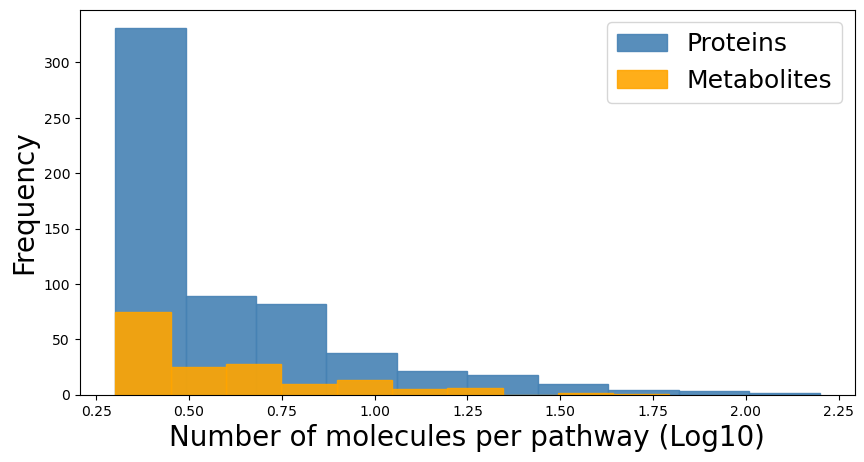

In [149]:
# Looking at number of proteins in any given pathway
#plt.hist(pathways_present_num_df["Number_of_proteins_Log_10"], alpha=0.8) ## "Total proteins",
plt.figure(figsize=(10,5))
plt.hist(path_coverage_nums_df["Number_of_proteins_Log_10"], alpha = .9, color = 'steelblue', edgecolor='steelblue')
plt.hist(number_of_metabolites["Number_of_metabolites_Log_10"], alpha = .9, color = 'orange', edgecolor='orange')
plt.xlabel('Number of molecules per pathway (Log10)', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.legend(["Proteins", "Metabolites"], fontsize=18)
plt.show()

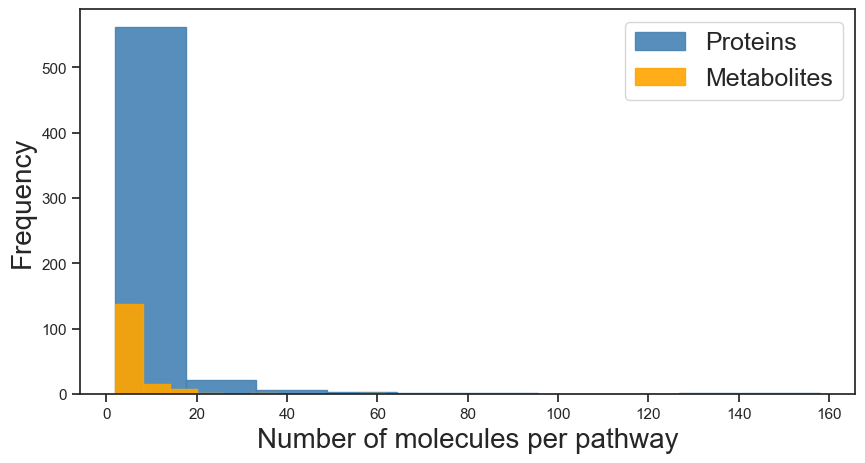

In [241]:
# Looking at number of proteins in any given pathway
#plt.hist(pathways_present_num_df["Number_of_proteins_Log_10"], alpha=0.8) ## "Total proteins",
plt.figure(figsize=(10,5))
plt.hist(path_coverage_nums_df["Number_of_proteins"], alpha = .9, color = 'steelblue', edgecolor='steelblue')
plt.hist(number_of_metabolites["Number_of_metabolites"], alpha = .9, color = 'orange', edgecolor='orange')
plt.xlabel('Number of molecules per pathway', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.legend(["Proteins", "Metabolites"], fontsize=18)
plt.show()

# Calculating Coverage of proteins to proteins in the reactome

In [150]:
## if using Reactome database as the pathway database
# count all compounds in the dataset
print(len(compounds_present), "compounds in the dataset")

# count all unique compounds in the Reactome database
all_reactome_cpds = set(sum(sspa.utils.pathwaydf_to_dict(reactome_uniprot).values(), []))
print(len(all_reactome_cpds), "total unique compounds in Reactome - how many proteins in all of Reactome")

# find the intesect between all reactome compounds and all ChEBI IDs annotated to the dataset
mapped_annotated_cpds = (set(compounds_present) & all_reactome_cpds)
print(len(mapped_annotated_cpds), "proteins present in both the dataset and Reactome pathways - aka only this amount of proteins in my datasets are mapped to a pathway")
# of the 333 metabolites, only 77 are present in pathways in reactomes ; Reactome pathways have low coverage

454 compounds in the dataset
11625 total unique compounds in Reactome - how many proteins in all of Reactome
354 proteins present in both the dataset and Reactome pathways - aka only this amount of proteins in my datasets are mapped to a pathway


In [151]:
def wrap_labels(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=0)

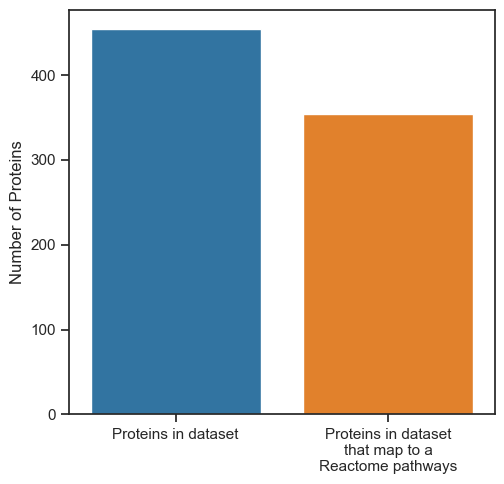

In [152]:
# Visualise this in barchart form
plt.figure(figsize=(5,5))
sns.set_context('notebook')
sns.set_style('ticks')
ax = sns.barplot(y=[len(compounds_present), len(mapped_annotated_cpds)], 
                x=['Proteins in dataset', 'Proteins in dataset that map to a Reactome pathways'])
wrap_labels(ax, 20, break_long_words=False)
plt.tight_layout()
plt.ylabel("Number of Proteins")
plt.show()

In [153]:
print(len(compounds_present))
print(len(mapped_annotated_cpds))

454
354


In [154]:
354/454*100

77.97356828193833

# Calculating a Overlap Network

In [155]:
#Define the overlap coefficient

# useful for pathways because some pathways have 10 and some have 2; so captures when smaller set is inside the other bigger set
def overlap_coefficient(list1, list2):
    # Szymkiewicz–Simpson coefficient
    intersection = len(list(set(list1).intersection(list(set(list2))))) 
    smaller_set = min(len(list1), len(list2)) # tells which length is the smallest, normalizes it
    return float(intersection) / smaller_set

    ## set() method is used to convert any of the iterable to sequence of iterable elements with distinct elements; a set is essentially all values have to be unique
    ## in a set you can only have one of each value; use when you want to only count something once
    # sets have attributes to them - ex. .intersection which will calculate the intersection aka what exists in both sets aka thats common to both of them
    # sets.union = all of the elemnts togethers; only the uniques

    # can look at difference between ways of calculating overlap 

In [156]:
# Overlap coefficient

# all pathways, need to get all pairwise coffecient - that will give you matrix
# need to loop over every pairwise combintion
overlap_cf = overlap_coefficient(path_coverage, path_coverage)

In [157]:
# Looking at *all* the keys (k; i.e pathway names) and their respective values (v; the proteins in the pathway) for the dictionary "path_coverage"
# .items is an interator; interator is used in a loop
# dont have to call them k and v
for k,v in path_coverage.items(): 
	print(k,v) 

R-HSA-109581 ['Q9HAW4', 'O00220', 'P55957', 'P50591', 'Q9NR28', 'Q04759', 'Q12933', 'P25786', 'Q9Y5V3', 'O14763', 'Q13490', 'P52294', 'O00273', 'Q14790']
R-HSA-109582 ['O00186', 'P09769', 'Q9UIB8', 'Q9BZW8', 'O15123', 'Q13574', 'P78380', 'P01137', 'P25116', 'O00220', 'Q92520', 'P78310', 'P03956', 'P29474', 'P31997', 'O43915', 'P07947', 'P12931', 'Q9UQQ2', 'Q9NP99', 'P35237', 'Q04759', 'P15692', 'P13726', 'Q14242', 'Q12866', 'P07204', 'P14210', 'P31431', 'P40225', 'P23229', 'P50452', 'O14763', 'P00749', 'Q9UKL0', 'Q15389', 'P01127', 'Q02763']
R-HSA-109606 ['Q14790', 'P55957', 'Q9NR28']
R-HSA-109704 ['Q9GZV9', 'P09038', 'P49771', 'O95750']
R-HSA-110362 ['P09874', 'P27695']
R-HSA-110373 ['P27695', 'P09874']
R-HSA-111465 ['Q9HAW4', 'Q13490', 'Q14790', 'Q04759']
R-HSA-112314 ['P12931', 'Q9Y478']
R-HSA-112315 ['P12931', 'Q9Y478', 'P21964']
R-HSA-112316 ['P21964', 'P12931', 'Q9Y478']
R-HSA-112399 ['Q9GZV9', 'P09038', 'P49771', 'O95750']
R-HSA-114508 ['Q13574', 'Q04759']
R-HSA-114608 ['P14210'

In [158]:
# Make a list of all pathway codes
all_pathways = [k for k, v in path_coverage.items()] # Makes a list of all the pathway names from the dictionary
## this line is a list comprenstion; make an empty list and then everytime you loop over, you would add them into the list
#k - keys, v - value, d - dictionary
# df.items() = Iterates over the DataFrame columns, returning a tuple with the column name and the content as a Series.
print(type(all_pathways)) # is a list


<class 'list'>


In [159]:
overlap_coefficient_list = [] #empty list
for pathway_pair in itertools.permutations(all_pathways, 2): #itertool is a python package that does iter tools; does permutations of all the the things you give it 
    overlap_coefficient_list.append(overlap_coefficient(path_coverage[pathway_pair[0]], path_coverage[pathway_pair[1]]))

# itertools.permutations(iterable, r=None)
# Return successive r length permutations of elements in the iterable.
# If r is not specified or is None, then r defaults to the length of the iterable and all possible full-length permutations are generated

# this is a standard normal way of doing things
#make an empty list and store the overlap coefficent into the list for every pairwaise comparisons 
# for pathway_pair in itertools.permutations(all_pathways, 2) --  the 2 is what is telling you the pairwise part
#overlap_coefficient_list.append - adding to the open list 
# path_coverage[pathway_pair[0]] - pathway_coverage is our dictionary; pathway_pair is a tuple the we named from the itertools.permutations
# every pathway pair is a tuple containing 2 things; 0 and 1 is thing 1 in the tuple and thing 2 in the tuple


In [160]:
# this is the first pathway pair of the list 
for x in itertools.permutations(all_pathways, 2):
    print(x)
    break


# prints the first item in the tuple
for x in itertools.permutations(all_pathways, 2):
    print(x[0])
    print(path_coverage[x[0]])
    break

# prints the second item in the tuple
for x in itertools.permutations(all_pathways, 2):
    print(x[1])
    break

('R-HSA-109581', 'R-HSA-109582')
R-HSA-109581
['Q9HAW4', 'O00220', 'P55957', 'P50591', 'Q9NR28', 'Q04759', 'Q12933', 'P25786', 'Q9Y5V3', 'O14763', 'Q13490', 'P52294', 'O00273', 'Q14790']
R-HSA-109582


In [161]:
# Putting the list into a matrix 
all_pathways = [k for k, v in path_coverage.items()]
rows = [] # makes an empty list

for i in all_pathways:
    curr_row = []
    for p in all_pathways:
        curr_row.append(overlap_coefficient(path_coverage[i], path_coverage[p]))
    rows.append(curr_row)

# building the matrix row by row
# when you iterate over something, you can call it whatever you want- here cecelia uses i and p ; youre trying to get the pairs
#within the loop you get another loop and by doing this you get pairs of everything 

In [162]:
# Making the data frame of the overlap matrix of proteins in my dataset
overlap_ar = np.array(rows)
overlap_df = pd.DataFrame(overlap_ar, index=path_coverage.keys(), columns=path_coverage.keys())
# overlap_df = overlap_df.rename(mapper=reactome_dict, axis =1)
# overlap_df = overlap_df.rename(mapper=reactome_dict, axis =0)

#Sanity check, the diagnols should be 1; the matrix should be square
print("Data overlap matrix shape:", overlap_df.shape)

Data overlap matrix shape: (598, 598)


/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


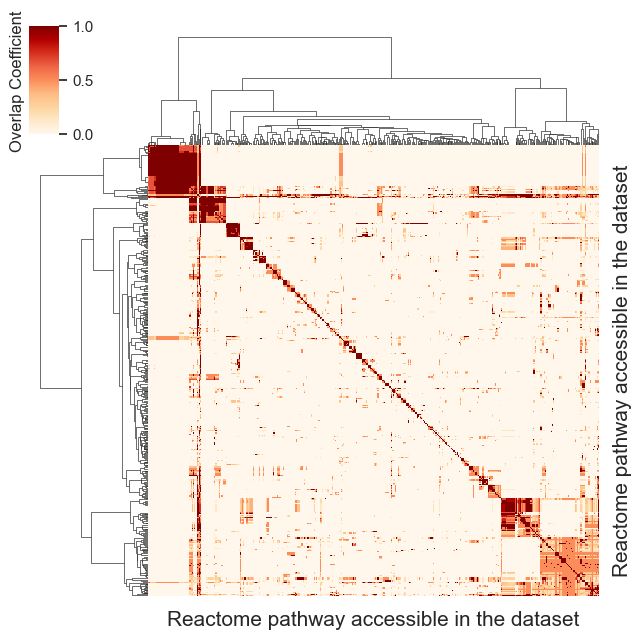

In [243]:
# Clustermap of overlap 

g = sns.clustermap(overlap_df, yticklabels= False, xticklabels= False, cmap = "OrRd", figsize = (6, 6), method = 'ward')
g.ax_heatmap.set_ylabel("Reactome pathway accessible in the dataset", fontsize=15)
g.ax_heatmap.set_xlabel("Reactome pathway accessible in the dataset", fontsize=15)
g.ax_cbar.set_ylabel("Overlap Coefficient",size=12, labelpad=-60)
plt.show()

# Clustermap is more difficult to work with because it is its own object, not everything from seaborn and matplotlib works on it

# plt.tight_layout - good to make layout more perfect
#fig.suptitle("Proteomic Dataset Overlap")
#dendrogram_ratio=(0.05, .2)
#cbar_pos=(0, .8, .025, .2)

In [164]:
# Making a heatmap of the overlap of the proteins in all dataset

overlap_coefficient_list_all = [] #empty list
for pathway_pair in itertools.permutations(reactome_dict_proteins.keys(), 2): #itertool is a python package that does iter tools; does permutations of all the the things you give it 
    overlap_coefficient_list.append(overlap_coefficient(reactome_dict_proteins[pathway_pair[0]], reactome_dict_proteins[pathway_pair[1]]))

# itertools.permutations(iterable, r=None)
# Return successive r length permutations of elements in the iterable - we do 2 becauase we are doing a pairwise comparision so comparing 1 thing to 1 other thing

# this is a standard normal way of doing things
# make an empty list and store the overlap coefficent into the list for every pairwaise comparisons 
# for pathway_pair in itertools.permutations(all_pathways, 2) --  the 2 is what is telling you the pairwise part
# overlap_coefficient_list.append - adding to the open list 
# path_coverage[pathway_pair[0]] - pathway_coverage is our dictionary; pathway_pair is a tuple the we named from the itertools.permutations
# every pathway pair is a tuple containing 2 things; 0 and 1 is thing 1 in the tuple and thing 2 in the tuple

# Putting the list into a matrix 
#thways_all = [k for k, v in all_pathways.items()]
rows = [] # makes an empty list

for i in reactome_dict_proteins.keys():
    curr_row = []
    for p in reactome_dict_proteins.keys():
        curr_row.append(overlap_coefficient(reactome_dict_proteins[i], reactome_dict_proteins[p]))
    rows.append(curr_row)

# building the matrix row by row
# when you iterate over something, you can call it whatever you want- here cecelia uses i and p ; youre trying to get the pairs
#within the loop you get another loop and by doing this you get pairs of everything 


In [165]:
overlap_ar_all = np.array(rows)
overlap_df_all = pd.DataFrame(overlap_ar_all, index = reactome_dict_proteins.keys(), columns=reactome_dict_proteins.keys())
overlap_df_all
#sanity check, the diagnols should be 1; the matrix should be square

,R-HSA-1059683,R-HSA-109581,R-HSA-109582,R-HSA-109606,R-HSA-109703,R-HSA-109704,R-HSA-110056,R-HSA-110312,R-HSA-110313,R-HSA-110314,...,R-HSA-983168,R-HSA-983169,R-HSA-983170,R-HSA-983189,R-HSA-983231,R-HSA-983695,R-HSA-983705,R-HSA-983712,R-HSA-991365,R-HSA-997272
R-HSA-1059683,1.000000,0.066667,0.133333,0.066667,0.0,0.066667,0.727273,0.00,0.000000,0.000000,...,0.066667,0.066667,0.000000,0.0,0.066667,0.000000,0.000000,0.000000,0.000000,0.000000
R-HSA-109581,0.066667,1.000000,0.060440,1.000000,0.5,0.020000,0.090909,0.25,0.102564,0.133333,...,0.269231,0.296703,0.010204,0.0,0.006250,0.000000,0.284091,0.027473,0.000000,0.000000
R-HSA-109582,0.133333,0.060440,1.000000,0.109091,0.0,0.140000,0.272727,0.00,0.000000,0.000000,...,0.000000,0.015453,0.010204,1.0,1.000000,0.842105,0.494318,0.086957,0.488372,0.586207
R-HSA-109606,0.066667,1.000000,0.109091,1.000000,0.5,0.020000,0.090909,0.00,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.018182,0.000000,0.018182,0.000000,0.000000,0.000000
R-HSA-109703,0.000000,0.500000,0.000000,0.500000,1.0,1.000000,0.000000,0.00,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R-HSA-983695,0.000000,0.000000,0.842105,0.000000,0.0,0.040000,0.000000,0.00,0.000000,0.000000,...,0.000000,0.010526,0.000000,0.0,0.000000,1.000000,1.000000,0.021053,0.000000,0.000000
R-HSA-983705,0.000000,0.284091,0.494318,0.018182,0.0,0.040000,0.000000,0.25,0.102564,0.133333,...,0.301136,0.323864,0.000000,0.0,0.000000,1.000000,1.000000,0.034091,0.000000,0.000000
R-HSA-983712,0.000000,0.027473,0.086957,0.000000,0.0,0.000000,0.000000,0.25,0.102564,0.133333,...,0.032609,0.032609,0.000000,0.0,0.000000,0.021053,0.034091,1.000000,0.000000,0.000000
R-HSA-991365,0.000000,0.000000,0.488372,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000


/Users/sarapatti/opt/anaconda3/envs/Python_3104/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


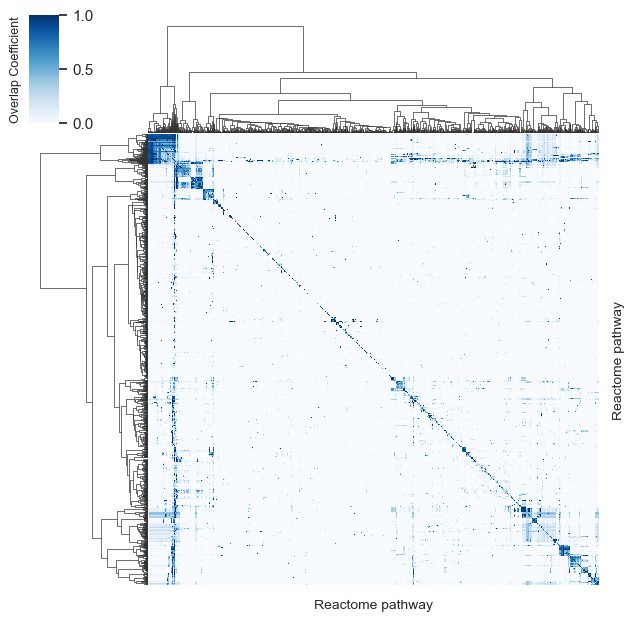

In [166]:
# Clustermap of overlap  - it looks exactly the same
color = sns.color_palette("Blues", as_cmap=True)
g = sns.clustermap(overlap_ar_all, yticklabels= False, xticklabels= False, cmap = color, figsize = (6, 6), method = 'ward')
g.ax_heatmap.set_ylabel("Reactome pathway", fontsize=10)
g.ax_heatmap.set_xlabel("Reactome pathway", fontsize=10)
g.ax_cbar.set_ylabel("Overlap Coefficient",size=9, labelpad=-60)
plt.show()


# Calculating hypergeometric distribution using the Fischer exact

In [167]:
# Step 1:
# Calculate background - 77 metabolites in the pathways with ChBEI IDs; 78 I think total

background = []
for k,v in pathways_present.items():
    background.append(v)

background_chain = list(chain.from_iterable(background))
print("All proteins in pathways present (includes duplicates)", len(background_chain))
background_set = set(background_chain)
print("Unique proteins in pathways", len(background_set))

background_metabolites = list(set(compounds_present) & set(background_set))
print("Proteins in the pathway and our data", len(background_metabolites))


All proteins in pathways present (includes duplicates) 83568
Unique proteins in pathways 11544
Proteins in the pathway and our data 354


In [168]:
# Calculate combination pairwise of all combinations of pathway_1 and pathway _2 - can do a nested list or list containing the pairs
pairwise_pathways = []
for x in itertools.permutations(path_coverage, 2): #itertool is a python package that does iter tools; does permutations of all the the things you give it
    pairwise_pathways.append(x)

print("Expected pairwise connections", 598*598, "Expected without self-pairs",( 598*598-598))
print("Number of pairwise connections", len(pairwise_pathways), "doesnt include self pairs I think?")

Expected pairwise connections 357604 Expected without self-pairs 357006
Number of pairwise connections 357006 doesnt include self pairs I think?


In [169]:
# Calculate combination pairwise of all combinations of pathway_1 and pathway _2 - can do a nested list or list containing the pairs
pairwise_pathways_x = []
pairwise_pathways_y = []  #empty list
for x, y in itertools.permutations(path_coverage, 2): #itertool is a python package that does iter tools; does permutations of all the the things you give it
    pairwise_pathways_x.append(x)
    pairwise_pathways_y.append(y)

pairwise_labels = pd.DataFrame({'Pathway1':pairwise_pathways_x, 'Pathway2': pairwise_pathways_y})
len(pairwise_labels)

357006

In [170]:
# Make a list with all possible pathway pairs - attempt 2

fisher_exact_pathway_p_val = [] #empty list
for x in pairwise_pathways: #itertool is a python package that does iter tools; does permutations of all the the things you give it
    # in P1 and P2
    ##print(x)
    p1_and_p2 = len(set((path_coverage[x[0]])) & set(((path_coverage[x[1]]))))
    ##print(p1_and_p2)
    ##pairwise_metabolites.append(p1_and_p2)
    # in P1 and not in P2
    in_p1_and_not_p2 = len(np.setdiff1d((path_coverage[x[0]]),(path_coverage[x[1]])))
    # in P2 and not in P1
    in_p2_and_not_p1 = len(np.setdiff1d((path_coverage[x[1]]),(path_coverage[x[0]])))
    # not in P1 or P2
    neither_p1_p2 = len(np.setdiff1d(background_metabolites,((path_coverage[x[0]])+path_coverage[x[1]])))
    table = np.array([[p1_and_p2, in_p2_and_not_p1], [in_p1_and_not_p2, neither_p1_p2]])
    #print(table)
    res, p_val = stats.fisher_exact(table, alternative='two-sided')
    fisher_exact_pathway_p_val.append(p_val)
    

In [171]:
## Sanity Check
print("Pathways:", pairwise_pathways[0])
print("Pathway_1", len(path_coverage["R-HSA-109581"]), path_coverage["R-HSA-109581"])
print("Pathway_2", len(path_coverage["R-HSA-109582"]), path_coverage["R-HSA-109582"] )

## Table
p1_and_p2 = len(set(path_coverage["R-HSA-109581"]) & set(path_coverage["R-HSA-109582"]))
in_p1_and_not_p2 = len(np.setdiff1d(path_coverage["R-HSA-109581"],path_coverage["R-HSA-109582"]))
in_p2_and_not_p1 = len(np.setdiff1d(path_coverage["R-HSA-109582"],path_coverage["R-HSA-109581"]))
p1_and_p2_combined = (path_coverage["R-HSA-109581"])+(path_coverage["R-HSA-109582"])
neither_p1_p2 = len(np.setdiff1d(background_metabolites, p1_and_p2_combined))

# Making table
table = np.array([[p1_and_p2, in_p2_and_not_p1], [in_p1_and_not_p2, neither_p1_p2]])
print(table)

Pathways: ('R-HSA-109581', 'R-HSA-109582')
Pathway_1 14 ['Q9HAW4', 'O00220', 'P55957', 'P50591', 'Q9NR28', 'Q04759', 'Q12933', 'P25786', 'Q9Y5V3', 'O14763', 'Q13490', 'P52294', 'O00273', 'Q14790']
Pathway_2 38 ['O00186', 'P09769', 'Q9UIB8', 'Q9BZW8', 'O15123', 'Q13574', 'P78380', 'P01137', 'P25116', 'O00220', 'Q92520', 'P78310', 'P03956', 'P29474', 'P31997', 'O43915', 'P07947', 'P12931', 'Q9UQQ2', 'Q9NP99', 'P35237', 'Q04759', 'P15692', 'P13726', 'Q14242', 'Q12866', 'P07204', 'P14210', 'P31431', 'P40225', 'P23229', 'P50452', 'O14763', 'P00749', 'Q9UKL0', 'Q15389', 'P01127', 'Q02763']
[[  3  35]
 [ 11 305]]


In [172]:
# Putting fisher_exact_pathway_p_val into a matrix
fisher_exact_pathway_p_val_array = np.array(fisher_exact_pathway_p_val)
fisher_exact_pathway_p_val_df = pd.DataFrame(fisher_exact_pathway_p_val_array, columns= ["Fisher_exact_p_val"])
print(len(fisher_exact_pathway_p_val_df))

357006


In [173]:
# # Merge pathways
fisher_exact_pathway_p_val_df_full = pd.merge(pairwise_labels,fisher_exact_pathway_p_val_df, right_index=True, left_index=True )
fisher_exact_pathway_p_val_df_full

,Pathway1,Pathway2,Fisher_exact_p_val
0,R-HSA-109581,R-HSA-109582,0.181009
1,R-HSA-109581,R-HSA-109606,0.000050
2,R-HSA-109581,R-HSA-109704,1.000000
3,R-HSA-109581,R-HSA-110362,1.000000
4,R-HSA-109581,R-HSA-110373,1.000000
...,...,...,...
357001,R-HSA-983705,R-HSA-9772573,1.000000
357002,R-HSA-983705,R-HSA-983168,0.066367
357003,R-HSA-983705,R-HSA-983169,0.008193
357004,R-HSA-983705,R-HSA-983231,1.000000


In [174]:
# Renaming columns
fisher_exact_pathway_p_val_keep = fisher_exact_pathway_p_val_df_full.loc[fisher_exact_pathway_p_val_df_full["Fisher_exact_p_val"]> 0.05]
fisher_exact_pathway_p_val_keep

## Keep when p value is large, not small 
# get rid of ones with higher overlap (not loweroverlap), which should mean the ones with the lower p value - double check
#rank overlap by size and see the p-values 
# plot overlap coefficient vs the log(pvalue) and their should be a strong correlation between them 
#check were throwing the right ones away
# think about multiple testing correction - then you'd throw away fewer pathways - need to explain WHY were not doing multiple testing correction ; look at both

,Pathway1,Pathway2,Fisher_exact_p_val
0,R-HSA-109581,R-HSA-109582,0.181009
2,R-HSA-109581,R-HSA-109704,1.000000
3,R-HSA-109581,R-HSA-110362,1.000000
4,R-HSA-109581,R-HSA-110373,1.000000
6,R-HSA-109581,R-HSA-112314,1.000000
...,...,...,...
356999,R-HSA-983705,R-HSA-9759194,0.066367
357000,R-HSA-983705,R-HSA-9772572,1.000000
357001,R-HSA-983705,R-HSA-9772573,1.000000
357002,R-HSA-983705,R-HSA-983168,0.066367


# Making Overlap Network

In [175]:
# Making the overlap network 

links_overlap_all = overlap_df.stack().reset_index()
links_overlap_all.columns = ["Pathway_1", "Pathway_2", "Overlap_Correlation"]
links_overlap_all.shape

(357604, 3)

In [176]:
print("Number of unique pariwise correlations:", len(set(links_overlap_all.index.to_list())))

print("Number of unqiue pathways in overlap matrix:", len(set(overlap_df.columns.to_list()))) # tells you if there is duplicates; a set only contains unique values

#Sanity check, the diagnols should be 1; the matrix should be square
print("Data overlap matrix shape:", overlap_df.shape)


Number of unique pariwise correlations: 357604
Number of unqiue pathways in overlap matrix: 598
Data overlap matrix shape: (598, 598)


In [177]:
# # Looking at duplicates
# overlap_df[overlap_df.columns.duplicated()]
# overlap_df[['Attachment and Entry']]

In [178]:
links_overlap = links_overlap_all.loc[(links_overlap_all["Pathway_1"] != links_overlap_all["Pathway_2"])]
links_overlap

,Pathway_1,Pathway_2,Overlap_Correlation
1,R-HSA-109581,R-HSA-109582,0.214286
2,R-HSA-109581,R-HSA-109606,1.000000
3,R-HSA-109581,R-HSA-109704,0.000000
4,R-HSA-109581,R-HSA-110362,0.000000
5,R-HSA-109581,R-HSA-110373,0.000000
...,...,...,...
357598,R-HSA-983705,R-HSA-9772573,0.000000
357599,R-HSA-983705,R-HSA-983168,0.250000
357600,R-HSA-983705,R-HSA-983169,0.333333
357601,R-HSA-983705,R-HSA-983231,0.000000


Text(0.5, 1.0, 'Protein Overlap Network (COVID + Healthy) Overlap')

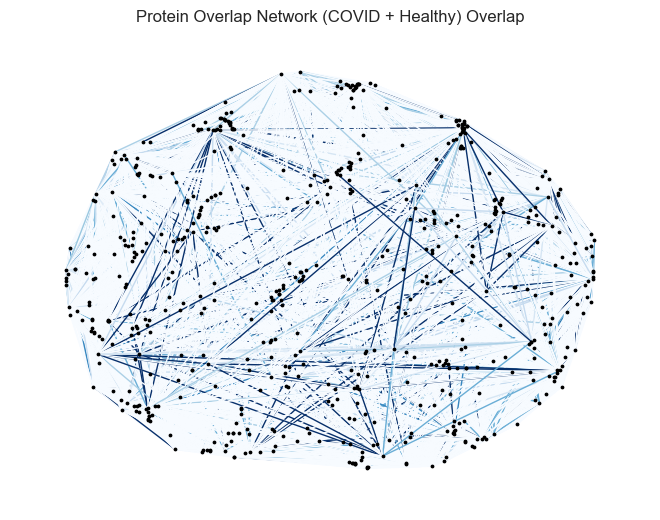

In [179]:
#Creating a networkx

# Create an empty graph structure (a “null graph”) with no nodes and no edges
G_overlap = nx.Graph() 

#Add the nodes from any container (a list, dict, set or even the lines from a file or the nodes from another graph)
G_overlap =nx.from_pandas_edgelist(links_overlap, 'Pathway_1', 'Pathway_2', edge_attr= "Overlap_Correlation") #G.add_nodes
weight_corr = [i['Overlap_Correlation'] for i in dict(G_overlap.edges).values()]

nx.draw(G_overlap, with_labels=False, node_color='black', node_size=3, edge_color=weight_corr, font_size=5, edge_cmap=plt.cm.Blues)

plt.title('Protein Overlap Network (COVID + Healthy) Overlap')


In [180]:
# Attributes 
number_of_nodes = G_overlap.number_of_nodes()
print("Number of nodes:", number_of_nodes)

number_of_edges= G_overlap.number_of_edges()
print("Number of edges:", number_of_edges)

density =nx.density(G_overlap)
print("Graph density:", density)

Number of nodes: 598
Number of edges: 178503
Graph density: 1.0


In [181]:

# Put graph into Cytoscape
nx.write_gml(G_overlap,'/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Cytoscape_files/Protein_overlap_network_allconnections.gml')

In [182]:
# Number of nodes

number_of_nodes_overlap = G_overlap.number_of_nodes()
print("Number of nodes in overlap:", number_of_nodes_overlap)

Number of nodes in overlap: 598


In [183]:
links_overlap_OC = links_overlap.loc[links_overlap["Overlap_Correlation"] >= 0.5]

Text(0.5, 1.0, 'Protein Overlap Network (COVID + Healthy) Overlap >= 0.5 ')

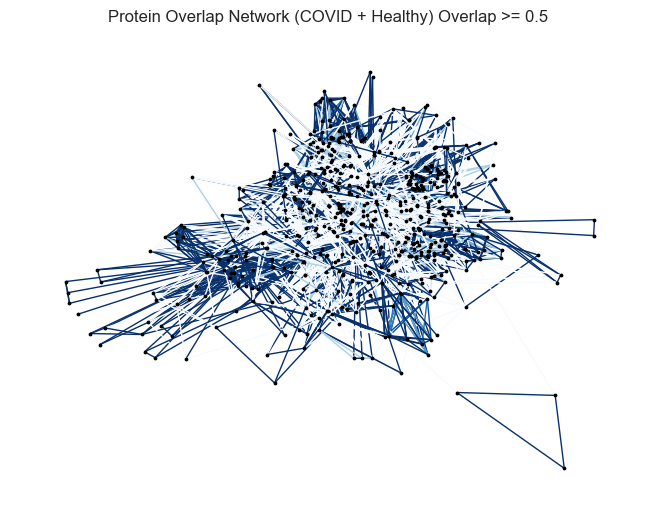

In [184]:
#Creating a networkx

# Create an empty graph structure (a “null graph”) with no nodes and no edges
G_overlap_OC = nx.Graph() 

#Add the nodes from any container (a list, dict, set or even the lines from a file or the nodes from another graph)
G_overlap_OC =nx.from_pandas_edgelist(links_overlap_OC, 'Pathway_1', 'Pathway_2', edge_attr= "Overlap_Correlation") #G.add_nodes
weight_corr = [i['Overlap_Correlation'] for i in dict(G_overlap_OC.edges).values()]

nx.draw(G_overlap_OC, with_labels=False, node_color='black', node_size=3, edge_color=weight_corr, font_size=5, edge_cmap=plt.cm.Blues)

plt.title('Protein Overlap Network (COVID + Healthy) Overlap >= 0.5 ')

In [233]:
# Attributes 
number_of_nodes = G_overlap_OC.number_of_nodes()
print("Number of nodes:", number_of_nodes)

number_of_edges= G_overlap_OC.number_of_edges()
print("Number of edges:", number_of_edges)

density =nx.density(G_overlap_OC)
print("Graph density:", density)

Number of nodes: 598
Number of edges: 12876
Graph density: 0.07213324145812676


In [186]:
# Drop values where Overlap_Correlation = 0

links_overlap_nozero = links_overlap[links_overlap["Overlap_Correlation"] != 0]
links_overlap_nozero

,Pathway_1,Pathway_2,Overlap_Correlation
1,R-HSA-109581,R-HSA-109582,0.214286
2,R-HSA-109581,R-HSA-109606,1.000000
6,R-HSA-109581,R-HSA-111465,1.000000
11,R-HSA-109581,R-HSA-114508,0.500000
13,R-HSA-109581,R-HSA-1168372,0.333333
...,...,...,...
357594,R-HSA-983705,R-HSA-975871,0.166667
357596,R-HSA-983705,R-HSA-9759194,0.250000
357599,R-HSA-983705,R-HSA-983168,0.250000
357600,R-HSA-983705,R-HSA-983169,0.333333


Text(0.5, 1.0, 'Overlap Coefficient Proteins (exclding 0)')

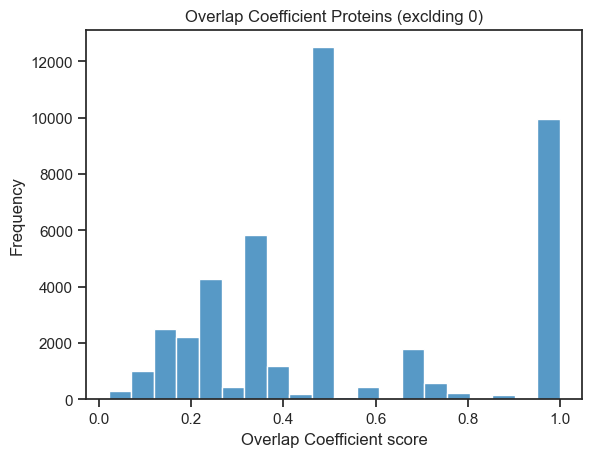

In [187]:
#Histogram of overlap coefficient 

sns.histplot(data=links_overlap_nozero["Overlap_Correlation"], bins = 20)
plt.xlabel('Overlap Coefficient score')
plt.ylabel('Frequency')
plt.title('Overlap Coefficient Proteins (exclding 0)')


In [188]:
#Set a threshold for overlap to be 0.5
#overlap_thres = links_overlap.loc[(links_overlap["Overlap_Correlation"] > 0.5) & (links_overlap["Pathway_1"] != links_overlap["Pathway_2"])]
overlap_thres = links_overlap.loc[(links_overlap["Pathway_1"] != links_overlap["Pathway_2"])]
overlap_thres # All the pathways with high overlap

,Pathway_1,Pathway_2,Overlap_Correlation
1,R-HSA-109581,R-HSA-109582,0.214286
2,R-HSA-109581,R-HSA-109606,1.000000
3,R-HSA-109581,R-HSA-109704,0.000000
4,R-HSA-109581,R-HSA-110362,0.000000
5,R-HSA-109581,R-HSA-110373,0.000000
...,...,...,...
357598,R-HSA-983705,R-HSA-9772573,0.000000
357599,R-HSA-983705,R-HSA-983168,0.250000
357600,R-HSA-983705,R-HSA-983169,0.333333
357601,R-HSA-983705,R-HSA-983231,0.000000


Text(0.5, 1.0, 'Protein Overlap Network (COVID + Healthy) overlap')

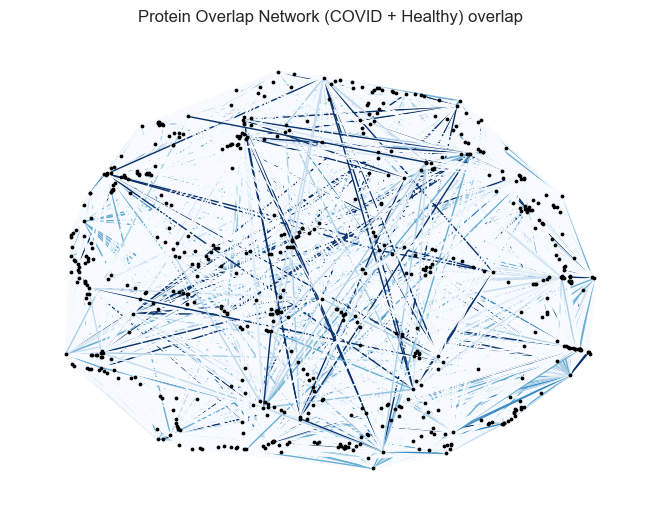

In [189]:
#Creating a networkx

# Create an empty graph structure (a “null graph”) with no nodes and no edges
G_overlap = nx.Graph() 

#Add the nodes from any container (a list, dict, set or even the lines from a file or the nodes from another graph)
G_overlap =nx.from_pandas_edgelist(overlap_thres, 'Pathway_1', 'Pathway_2', edge_attr= "Overlap_Correlation") #G.add_nodes
weight_corr = [i['Overlap_Correlation'] for i in dict(G_overlap.edges).values()]

nx.draw(G_overlap, with_labels=False, node_color='black', node_size=3, edge_color=weight_corr, font_size=5, edge_cmap=plt.cm.Blues)

plt.title('Protein Overlap Network (COVID + Healthy) overlap')

# Put graph into Cytoscape
#nx.write_gml(G_overlap,'/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Cytoscape files/Protein_overlap_network.gml')

In [190]:
# Attributes 
number_of_nodes = G_overlap.number_of_nodes()
print("Number of nodes:", number_of_nodes)

number_of_edges= G_overlap.number_of_edges()
print("Number of edges:", number_of_edges)

density =nx.density(G_overlap)
print("Graph density:", density)

Number of nodes: 598
Number of edges: 178503
Graph density: 1.0


# Combining Overlap and Fischer

In [191]:
print("fisher_exact_pathway_p_val_df_full shape:", fisher_exact_pathway_p_val_df_full.shape)
print("links_overlap shape:", links_overlap.shape)
overlap_fisher = pd.merge(fisher_exact_pathway_p_val_df_full, links_overlap["Overlap_Correlation"], right_index=True, left_index=True )
overlap_fisher.sort_values(by=["Fisher_exact_p_val", "Overlap_Correlation"])

fisher_exact_pathway_p_val_df_full shape: (357006, 3)
links_overlap shape: (357006, 3)


,Pathway1,Pathway2,Fisher_exact_p_val,Overlap_Correlation
20596,R-HSA-1280215,R-HSA-449147,2.408432e-52,0.25
178537,R-HSA-449147,R-HSA-1280215,2.408432e-52,1.00
110884,R-HSA-212436,R-HSA-73857,3.091190e-47,0.00
262865,R-HSA-73857,R-HSA-212436,3.091190e-47,0.00
265850,R-HSA-74160,R-HSA-212436,1.051004e-45,0.00
...,...,...,...,...
355697,R-HSA-983231,R-HSA-8941858,1.000000e+00,1.00
355805,R-HSA-983231,R-HSA-9759194,1.000000e+00,1.00
355811,R-HSA-983231,R-HSA-983705,1.000000e+00,1.00
355869,R-HSA-983695,R-HSA-1592230,1.000000e+00,1.00


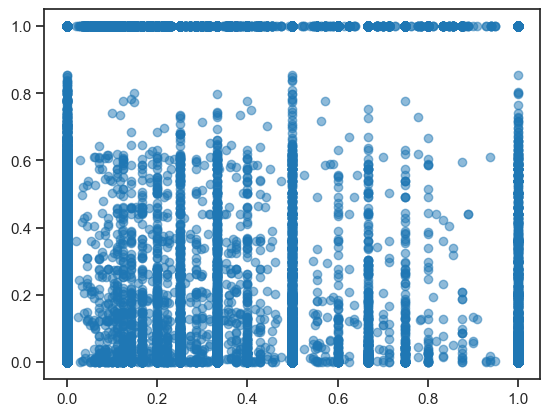

In [192]:
plt.scatter(overlap_fisher["Overlap_Correlation"], overlap_fisher["Fisher_exact_p_val"], alpha=0.5)
plt.show()

# Make a network thresholded by signficance then overlap

In [193]:
print("Pathway_scores shape:", kpca_scores_corr_pval_sort.shape)
print("Overlap shape:", links_overlap_all.shape)

Pathway_scores shape: (328329, 7)
Overlap shape: (357604, 3)


In [194]:
# Combine Correlation and overlap scores

corr_overlap_df = kpca_scores_corr_pval_sort.merge(links_overlap_all["Overlap_Correlation"], left_index=True, right_index=True)
corr_overlap_df

,Pathway_1,Pathway_2,Correlation,Correlation_abs,p_val,p_val_adjust,log10_p_val_adjusted,Overlap_Correlation
0,R-HSA-109581,R-HSA-109581,1.000000,1.000000,0.000000,0.0,inf,1.0
93159,R-HSA-2033519,R-HSA-5654693,1.000000,1.000000,0.000000,0.0,inf,0.0
93160,R-HSA-2033519,R-HSA-5654695,1.000000,1.000000,0.000000,0.0,inf,0.0
93161,R-HSA-2033519,R-HSA-5654696,1.000000,1.000000,0.000000,0.0,inf,0.0
93162,R-HSA-2033519,R-HSA-5654699,1.000000,1.000000,0.000000,0.0,inf,0.0
...,...,...,...,...,...,...,...,...
204695,R-HSA-5658442,R-HSA-196854,-0.090006,0.090006,0.150209,1.0,-0.0,0.0
204694,R-HSA-5658442,R-HSA-196849,0.025837,0.025837,0.680159,1.0,-0.0,0.0
204693,R-HSA-5658442,R-HSA-196741,0.045549,0.045549,0.467207,1.0,-0.0,0.0
280510,R-HSA-9012999,R-HSA-5576891,0.040415,0.040415,0.518924,1.0,-0.0,0.0


In [195]:
# Covert to CSV
corr_overlap_df.to_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/protein_all.csv')

In [196]:
# Remove the same pathways
corr_overlap_df_network = corr_overlap_df.loc[(corr_overlap_df["Pathway_1"] != corr_overlap_df["Pathway_2"])]

Text(0.5, 1.0, 'Protein Network')

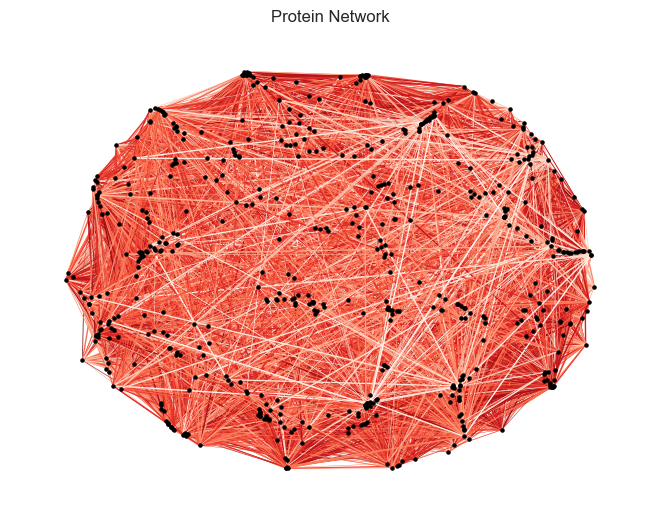

In [197]:
# Network with no threshold 

# Proprties of graph

test_G = nx.from_pandas_edgelist(corr_overlap_df_network, source = 'Pathway_1', target= 'Pathway_2', edge_attr= ["Correlation_abs","Overlap_Correlation"])

weight_corr = [i['Correlation_abs'] for i in dict(test_G.edges).values()]
overlap_coef = [i['Overlap_Correlation'] for i in dict(test_G.edges).values()] 

nx.draw(test_G, with_labels=False, node_color='Black', node_size=5, edge_color=weight_corr, width = overlap_coef, font_size=5, edge_cmap=plt.cm.Reds)

plt.title('Protein Network')


In [198]:
# Attributes 
number_of_nodes = test_G.number_of_nodes()
print("Number of nodes:", number_of_nodes)

number_of_edges= test_G.number_of_edges()
print("Number of edges:", number_of_edges)

density =nx.density(test_G)
print("Graph density:", density)


Number of nodes: 573
Number of edges: 163878
Graph density: 1.0


In [199]:
# Keep only correlations where adjusted P value is >0.005, overlap < 0.5 

threshold_corr_overlap_df = corr_overlap_df.loc[
    (corr_overlap_df["p_val_adjust"] <= 0.005) & (corr_overlap_df["Pathway_1"] != corr_overlap_df["Pathway_2"]) & (corr_overlap_df["Overlap_Correlation"] < 0.5)]

In [200]:
len(set(threshold_corr_overlap_df["Pathway_1"])) ## Why am I losing a node???

572

In [201]:
# Covert to CSV
threshold_corr_overlap_df.to_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/protein_all_threshold.csv')

Text(0.5, 1.0, 'Protein Network (threshold with overlap and p_val)')

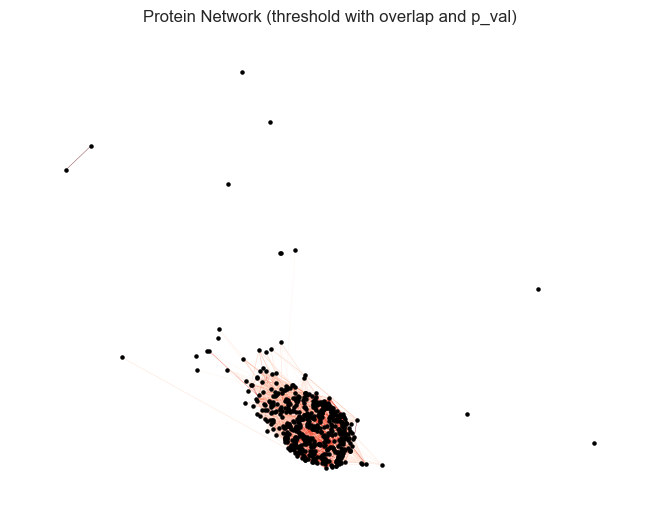

In [202]:
# Make graph with signifcance and overlap threshold

final_G = nx.from_pandas_edgelist(threshold_corr_overlap_df, source = 'Pathway_1', target= 'Pathway_2', edge_attr= ["Correlation_abs","Overlap_Correlation"])

weight_corr = [i['Correlation_abs'] for i in dict(final_G.edges).values()]
overlap_coef = [i['Overlap_Correlation'] for i in dict(final_G.edges).values()] 

nx.draw(final_G, with_labels=False, node_color='Black', node_size=5, edge_color=weight_corr, width = overlap_coef, font_size=5, edge_cmap=plt.cm.Reds)

plt.title('Protein Network (threshold with overlap and p_val)')



In [203]:
# Proprties of graph

number_of_nodes = final_G.number_of_nodes()
print("Number of nodes:", number_of_nodes)

number_of_edges= final_G.number_of_edges()
print("Number of edges:", number_of_edges)

density =nx.density(final_G)
print("Graph density:", density)


Number of nodes: 572
Number of edges: 130681
Graph density: 0.8002216697488151


In [204]:
## Add more attributes
degree_centrality = nx.degree_centrality(final_G) # Compute the degree centrality for nodes
degree_centrality_df = pd.DataFrame(list(degree_centrality.items()), columns= ["Node", "Degree_centrality"])

clustering = nx.clustering(final_G) # Compute the clustering coefficent for nodes
clustering_df = pd.DataFrame(list(clustering.items()), columns= ["Node", "Clustering"])

btwn_centrality = nx.betweenness_centrality(final_G)
btwn_centrality_df = pd.DataFrame(list(btwn_centrality.items()), columns= ["Node", "Betweenness_centrality"])

degree = list(final_G.degree)
degree_df = pd.DataFrame(degree, columns = ["Nodes", "Degree"])


In [205]:
# Merge attributes

attributes_df = pd.merge(degree_centrality_df, clustering_df["Clustering"], left_index = True, right_index = True)
attributes_df = pd.merge(attributes_df, btwn_centrality_df["Betweenness_centrality"], left_index = True, right_index = True)
attributes_df = pd.merge(attributes_df, degree_df["Degree"], left_index = True, right_index = True)
attributes_df 

,Node,Degree_centrality,Clustering,Betweenness_centrality,Degree
0,R-HSA-2033519,0.756567,0.982792,0.000041,432
1,R-HSA-5654693,0.754816,0.982701,0.000041,431
2,R-HSA-5654695,0.758319,0.982797,0.000041,433
3,R-HSA-5654696,0.747811,0.982782,0.000040,427
4,R-HSA-5654699,0.756567,0.982749,0.000041,432
...,...,...,...,...,...
567,R-HSA-193697,0.288967,0.957945,0.000017,165
568,R-HSA-9020558,0.010508,1.000000,0.000000,6
569,R-HSA-9024446,0.001751,0.000000,0.000000,1
570,R-HSA-209776,0.007005,1.000000,0.000000,4


In [206]:
kPCA_WHO_status_stack

,WHO_status,Pathway,Pathway_Score
0,0,R-HSA-109581,-0.301245
1,0,R-HSA-109606,0.094384
2,0,R-HSA-109704,0.167917
3,0,R-HSA-110362,-0.280709
4,0,R-HSA-110373,-0.280709
...,...,...,...
2287,5-7,R-HSA-983168,0.363016
2288,5-7,R-HSA-983169,0.356185
2289,5-7,R-HSA-983231,0.362615
2290,5-7,R-HSA-983695,0.178435


In [207]:
# Mean value for pathway score for each WHO status

kPCA_0 = kPCA_WHO_status_stack[kPCA_WHO_status_stack["WHO_status"] == "0"]
kPCA_0 = kPCA_0.rename(columns={'Pathway_Score': 'Pathway_Score_healthy'})
kPCA_0= kPCA_0.set_index("Pathway")

kPCA_1_2 = kPCA_WHO_status_stack[kPCA_WHO_status_stack["WHO_status"] == "1-2"]
kPCA_1_2 = kPCA_1_2.rename(columns={'Pathway_Score': 'Pathway_Score_mild'})
kPCA_1_2= kPCA_1_2.set_index("Pathway")

kPCA_3_4 = kPCA_WHO_status_stack[kPCA_WHO_status_stack["WHO_status"] == "3-4"]
kPCA_3_4 = kPCA_3_4.rename(columns={'Pathway_Score': 'Pathway_Score_moderate'})
kPCA_3_4= kPCA_3_4.set_index("Pathway")

kPCA_5_7 = kPCA_WHO_status_stack[kPCA_WHO_status_stack["WHO_status"] == "5-7"]
kPCA_5_7 = kPCA_5_7.rename(columns={'Pathway_Score': 'Pathway_Score_severe'})
kPCA_5_7= kPCA_5_7.set_index("Pathway")



In [208]:
# Make data fram with mean pathway score for each WHO status

who_status_mean = pd.merge(kPCA_0["Pathway_Score_healthy"], kPCA_1_2["Pathway_Score_mild"], on= ["Pathway"])
who_status_mean = pd.merge(who_status_mean, kPCA_3_4["Pathway_Score_moderate"], on= ["Pathway"])
who_status_mean = pd.merge(who_status_mean, kPCA_5_7["Pathway_Score_severe"], on= ["Pathway"])
who_status_mean = who_status_mean.reset_index()
who_status_mean = who_status_mean.rename(columns = {"Pathway": "Node"})
who_status_mean

,Node,Pathway_Score_healthy,Pathway_Score_mild,Pathway_Score_moderate,Pathway_Score_severe
0,R-HSA-109581,-0.301245,0.408476,0.178667,0.255738
1,R-HSA-109606,0.094384,-0.305790,0.078081,-0.056966
2,R-HSA-109704,0.167917,-0.276696,-0.065514,-0.129890
3,R-HSA-110362,-0.280709,0.189632,0.226505,0.446705
4,R-HSA-110373,-0.280709,0.189632,0.226505,0.446705
...,...,...,...,...,...
568,R-HSA-983168,-0.334271,0.328905,0.263161,0.363016
569,R-HSA-983169,-0.332691,0.306048,0.281588,0.356185
570,R-HSA-983231,-0.394859,0.528012,0.227670,0.362615
571,R-HSA-983695,-0.286311,0.383411,0.203301,0.178435


In [209]:
# Save to file 
who_status_mean.to_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/Protein_pathwayscores.csv')

In [210]:
# #Community Detection
# import networkx.algorithms.community as nx_comm
# louvain_communities = nx_comm.louvain_communities(final_G)
# louvain_communities = pd.DataFrame(louvain_communities)
# louvain_communities

In [211]:
# # # Export to excel
# louvain_communities.to_excel('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/louvain_communities_protein.xlsx')

In [212]:
# Import from excel
louvain_communities = pd.read_excel('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/louvain_communities_protein.xlsx', sheet_name = 'Final')
louvain_communities

,Node,Community
0,R-HSA-8963889,1
1,R-HSA-8963899,1
2,R-HSA-5689896,2
3,R-HSA-210991,2
4,R-HSA-168643,2
...,...,...
567,R-HSA-198933,3
568,R-HSA-209822,3
569,R-HSA-5632684,3
570,R-HSA-211859,3


In [213]:
# Pathway hiercharcy
hierarchy = pd.read_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/hierarchy_hsa_all.csv', index_col=0)
hierarchy.columns = ['Parent', 'Node', 'Root']

# Drop parent because you get duplications
hierarchy = hierarchy.drop("Parent", axis=1)

In [214]:
print("All", len((hierarchy["Node"])))
print("No dups", len(set((hierarchy["Node"]))))

#do some nodes have multiple highest level nodes?

All 2657
No dups 2610


In [215]:
# Name pathways with names
hierarchy['Root'] = hierarchy['Root'].map(reactome_dict)

# Name pathways with names
# hierarchy_names = hierarchy.rename(mapper=reactome_dict, axis=0, errors='ignore')
# hierarchy_names.to_excel('/Users/sarapatti/Desktop/Rename.xlsx')
# hierarchy.to_excel('/Users/sarapatti/Desktop/Map.xlsx')

In [216]:
# Remove duplicates
print("Length before drop", len((hierarchy["Node"])))
hierarchy = hierarchy.drop_duplicates(subset=['Node'])
print("Length after drop", len((hierarchy["Node"])))

# # Confirm no dubs
# dups = hierarchy[hierarchy['Node'].duplicated() == True]
# dups

Length before drop 2657
Length after drop 2610


In [217]:
hierarchy

,Node,Root
10591,R-HSA-109606,Programmed Cell Death
10592,R-HSA-169911,Programmed Cell Death
10593,R-HSA-5357769,Programmed Cell Death
10594,R-HSA-75153,Programmed Cell Death
10595,R-HSA-140877,Hemostasis
...,...,...
24,R-HSA-8963743,Digestion and absorption
25,R-HSA-9609507,Protein localization
26,R-HSA-9612973,Autophagy
27,R-HSA-9709957,Sensory Perception


In [218]:
# Adding mean value for WHO status
attributes_df_WHO_status = pd.merge(attributes_df, who_status_mean, on= ["Node"])

# Export attributes
attributes_df_WHO_status.to_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/Protein_node_attributes.csv')

attributes_df_WHO_status

,Node,Degree_centrality,Clustering,Betweenness_centrality,Degree,Pathway_Score_healthy,Pathway_Score_mild,Pathway_Score_moderate,Pathway_Score_severe
0,R-HSA-2033519,0.756567,0.982792,0.000041,432,-0.165286,0.334678,0.018013,0.118623
1,R-HSA-5654693,0.754816,0.982701,0.000041,431,-0.165286,0.334678,0.018013,0.118623
2,R-HSA-5654695,0.758319,0.982797,0.000041,433,-0.165286,0.334678,0.018013,0.118623
3,R-HSA-5654696,0.747811,0.982782,0.000040,427,-0.165286,0.334678,0.018013,0.118623
4,R-HSA-5654699,0.756567,0.982749,0.000041,432,-0.165286,0.334678,0.018013,0.118623
...,...,...,...,...,...,...,...,...,...
567,R-HSA-193697,0.288967,0.957945,0.000017,165,-0.117179,0.070395,0.101362,0.187173
568,R-HSA-9020558,0.010508,1.000000,0.000000,6,-0.047559,-0.022203,0.106216,0.024028
569,R-HSA-9024446,0.001751,0.000000,0.000000,1,-0.019103,-0.028183,0.061421,0.002912
570,R-HSA-209776,0.007005,1.000000,0.000000,4,-0.112778,0.014613,0.143789,0.173581


In [219]:
# Adding community
attributes_df_WHO_status_communities = attributes_df_WHO_status.merge(louvain_communities, how='left', on='Node')

In [220]:
# Adding heirchary 
attributes_df_WHO_status_hierarchy = attributes_df_WHO_status_communities.merge(hierarchy, how='left', on='Node')
len(attributes_df_WHO_status_hierarchy)

572

In [221]:
## IM LOSING NODES ON THIS STEP!!

# # Add pathway names
# names_pathways = reactome_pathways.iloc[:,:1]
# names_pathways.index.name = 'Node'
# attributes_df_WHO_status_hierarchy_communities = pd.merge(attributes_df_WHO_status_hierarchy, names_pathways, on=['Node'])

In [222]:
# Complete node attributes
complete_attributes_metabolites = attributes_df_WHO_status_hierarchy
complete_attributes_metabolites

,Node,Degree_centrality,Clustering,Betweenness_centrality,Degree,Pathway_Score_healthy,Pathway_Score_mild,Pathway_Score_moderate,Pathway_Score_severe,Community,Root
0,R-HSA-2033519,0.756567,0.982792,0.000041,432,-0.165286,0.334678,0.018013,0.118623,2,Disease
1,R-HSA-5654693,0.754816,0.982701,0.000041,431,-0.165286,0.334678,0.018013,0.118623,2,Signal Transduction
2,R-HSA-5654695,0.758319,0.982797,0.000041,433,-0.165286,0.334678,0.018013,0.118623,2,Signal Transduction
3,R-HSA-5654696,0.747811,0.982782,0.000040,427,-0.165286,0.334678,0.018013,0.118623,2,Signal Transduction
4,R-HSA-5654699,0.756567,0.982749,0.000041,432,-0.165286,0.334678,0.018013,0.118623,2,Signal Transduction
...,...,...,...,...,...,...,...,...,...,...,...
567,R-HSA-193697,0.288967,0.957945,0.000017,165,-0.117179,0.070395,0.101362,0.187173,3,Signal Transduction
568,R-HSA-9020558,0.010508,1.000000,0.000000,6,-0.047559,-0.022203,0.106216,0.024028,3,Immune System
569,R-HSA-9024446,0.001751,0.000000,0.000000,1,-0.019103,-0.028183,0.061421,0.002912,2,Signal Transduction
570,R-HSA-209776,0.007005,1.000000,0.000000,4,-0.112778,0.014613,0.143789,0.173581,3,Metabolism


In [223]:
complete_attributes_metabolites.to_excel('/Users/sarapatti/Desktop/complete_attributes_metabolites.xlsx')

In [224]:
# Convert to dictonary 

complete_attributes_metabolites = complete_attributes_metabolites.set_index(["Node"])
complete_attributes_metabolites_dict = complete_attributes_metabolites.to_dict(orient= 'index')

# Check an example
complete_attributes_metabolites_dict["R-HSA-211945"]


{'Degree_centrality': 0.005253940455341506,
 'Clustering': 0.0,
 'Betweenness_centrality': 1.0872116664459196e-06,
 'Degree': 3,
 'Pathway_Score_healthy': -0.11843877921765797,
 'Pathway_Score_mild': 0.11879764521907987,
 'Pathway_Score_moderate': 0.12879271487005975,
 'Pathway_Score_severe': 0.046922692441576305,
 'Community': 3,
 'Root': 'Metabolism'}

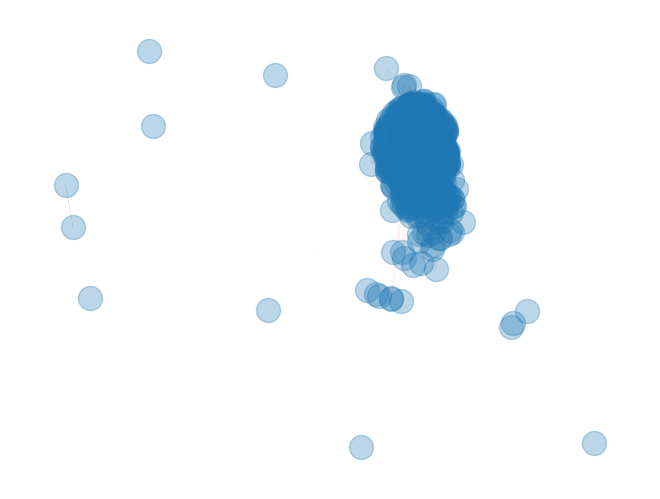

In [225]:
# Make edgelist
edgelist = threshold_corr_overlap_df.drop(columns = ["p_val", "log10_p_val_adjusted"]) 

# Make edges
G_protein = nx.from_pandas_edgelist(df=edgelist, source='Pathway_1', target='Pathway_2', edge_attr=['Correlation_abs', 'Overlap_Correlation'])
weight_corr = [i['Correlation_abs'] for i in dict(G_protein.edges).values()]
overlap_coef = [i['Overlap_Correlation'] for i in dict(G_protein.edges).values()] 

#Set Node Attributes
nx.set_node_attributes(G_protein, complete_attributes_metabolites_dict)

#Draw graph
nx.draw(G_protein, with_labels=False, edge_color=weight_corr, width = overlap_coef, font_size=5, edge_cmap=plt.cm.Reds, cmap=plt.cm.Greens, alpha=0.3)


In [226]:
#Save file
#nx.write_gml(G_protein, '/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Cytoscape/Protein_full_network_withattributes_1.10.23.gml')
#nx.write_gml(G_protein, '/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Cytoscape/Protein_full_network_withattributes_V2.gml')
#nx.write_gml(G_protein, '/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Cytoscape_files/Protein_full_network_withattributes_V3.gml')
nx.write_gml(G_protein, '/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Cytoscape_files/Protein_full_network_withattributes_V6.gml')


In [227]:
## Check node attributes

G_protein.nodes['R-HSA-211945']

{'Degree_centrality': 0.005253940455341506,
 'Clustering': 0.0,
 'Betweenness_centrality': 1.0872116664459196e-06,
 'Degree': 3,
 'Pathway_Score_healthy': -0.11843877921765797,
 'Pathway_Score_mild': 0.11879764521907987,
 'Pathway_Score_moderate': 0.12879271487005975,
 'Pathway_Score_severe': 0.046922692441576305,
 'Community': 3,
 'Root': 'Metabolism'}

In [228]:
number_of_nodes = G_protein.number_of_nodes()
print("Number of nodes:", number_of_nodes)

Number of nodes: 572


In [229]:
## Check edge attributes
G_protein.edges['R-HSA-186763',	'R-HSA-157118']

{'Correlation_abs': 0.34391542620577314, 'Overlap_Correlation': 0.0}

# Work in progress

In [230]:
# Add attributes
nx.set_node_attributes(final_G, degree_centrality, "degree_centrality")
print("degree_centrality", isinstance(degree_centrality, dict))

nx.set_node_attributes(final_G, clustering, "clustering")
print("clustering", isinstance(clustering, dict))

nx.set_node_attributes(final_G, degree, "degree")
print("degree", isinstance(degree, dict))


degree_centrality True
clustering True
degree False


# Data simulation

In [231]:
uniport_proteomic

,WHO_status,Group,O00182,O00220,O00253,O14763,O14836,O43915,O94907,P00797,...,Q9UHF1,Q9UKL0,Q9ULX7,Q9UNK0,Q9Y478,Q9Y4K4,Q9Y5A7,Q9Y5L3,Q9Y5V3,Q9Y653
sample_id,,,,,,,,,,,,,,,,,,,,,
1010823,0,Healthy Donor,-0.774169,-0.715042,-0.475117,-0.376539,-0.242449,0.465974,-0.035831,-1.096496,...,-0.989566,-0.846847,0.211866,-0.662963,-0.763679,-0.329100,-0.448917,-0.533633,-1.385562,-0.256394
1029090,0,Healthy Donor,-0.630451,-0.747448,-0.614390,-0.431615,-0.663813,1.342395,-1.075601,-1.571843,...,-1.045833,-0.824271,0.222942,-0.544820,-0.606509,-0.746644,-0.310256,0.009598,-0.980404,-0.484592
1049423,0,Healthy Donor,-0.869347,-0.806791,-0.589703,-0.453958,2.916144,-0.139408,-1.162517,-0.299875,...,-1.550021,-0.840020,0.226861,-0.501834,-0.754269,-0.649450,-0.464950,0.249570,-0.488508,-0.795142
1057525,0,Healthy Donor,-1.183256,-0.661162,0.318194,-0.607657,-0.286423,0.747850,-1.019120,-0.871288,...,-0.432772,-1.001817,0.472765,-0.646423,-0.897788,-0.573819,-0.952502,-0.307157,-1.059203,-0.267909
1065558,0,Healthy Donor,-0.706962,-0.590959,-0.421688,-0.431809,-0.331733,-0.638581,-0.827605,-0.448884,...,-1.313631,-0.949374,0.030338,-1.348789,-1.550576,-1.364199,-1.433501,-0.402257,-1.459650,-0.667893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INCOV139,3-4,COVID19,-0.371715,-0.099352,-0.342947,-0.171196,-1.014702,-0.420922,1.351346,-1.283404,...,1.181426,3.274395,0.656156,1.384484,1.722687,1.159764,2.163207,-1.071250,1.245149,-0.332915
INCOV141,1-2,COVID19,0.378032,-0.310503,-0.929602,-1.002270,-0.908728,0.023220,0.709804,-0.331578,...,0.387357,1.134318,1.579150,1.012202,0.793193,0.734457,1.330451,-0.977843,0.573041,-0.681664
INCOV142,5-7,COVID19,1.040650,0.642916,0.830414,0.543150,1.149508,-1.346764,1.016663,0.869184,...,0.349971,1.146998,-1.076766,0.475122,0.680888,0.648045,0.917351,-1.143528,0.354805,1.392459


In [232]:
# Covert to CSV
uniport_proteomic.to_csv('/Users/sarapatti/Documents/Code MRes DS SP 2022-2023/Exported files/uniport_proteomic.csv')
